In [1]:
# import all necessary libraries
import os
from datetime import datetime, timedelta
import requests as r
import numpy as np
import pandas as pd
import geopandas as gp
import matplotlib.pyplot as plt

import random
from osgeo import gdal
from pathlib import Path
import io
from scipy.sparse import csr_matrix
from scipy.sparse import load_npz

import zipfile
from collections import defaultdict

import re
from tqdm import tqdm
import shutil
import calendar

import rasterio as rio
from rasterio.mask import mask
from rasterio.enums import Resampling
from rasterio.shutil import copy
from rasterio.plot import show
from rasterio.warp import calculate_default_transform, reproject, Resampling
from rasterio.transform import Affine
from rasterio.merge import merge

import joblib
import math
import cv2
from scipy import sparse
import traceback

import pyproj
from pyproj import Proj

from shapely.ops import transform
from shapely.geometry import Polygon

import multiprocessing
from multiprocessing.pool import ThreadPool
import concurrent.futures
from concurrent.futures import ProcessPoolExecutor

import time
import random

## GIS

In [2]:
s2_tiles = gp.read_file('/scratch/user/anshulya/hls/data/auxiliary/gis/s2-tiles.geojson')
conus = gp.read_file('/scratch/user/anshulya/hls/data/auxiliary/gis/s_05mr24/s_05mr24.shp')

In [3]:
s2_res = pd.read_csv('/scratch/user/anshulya/hls/data/auxiliary/gis/sentinel_tiles.csv')
grand = gp.read_file('/scratch/user/anshulya/hls/data/auxiliary/gis/hls_reservoirs.geojson')
s2_res

,OID_,Join_Count,TARGET_FID,JOIN_FID,Join_Count_1,TARGET_FID_1,Name,FolderPath,SymbolID,AltMode,...,URL,QUALITY,EDITOR,LONG_DD,LAT_DD,POLY_SRC,Shape_Length_12,Shape_Area_12,Shape_Length,Shape_Area
0,1,1,9545,139,1,2,10SDH,S2A_OPER_GIP_TILPAR_20150622T000000_21000101T0...,0,0,...,http://www.spn.usace.army.mil/lakesonoma/Lake%...,2: Good,UNH,-123.011209,38.718758,SWBD,1001.575515,817.979987,4.492413,1.243465
1,2,1,9546,115,1,3,10SDJ,S2A_OPER_GIP_TILPAR_20150622T000000_21000101T0...,0,0,...,http://damsafety.water.ca.gov/,2: Good,UNH,-122.955096,39.410033,SWBD,1001.575515,817.979987,4.523982,1.259036
2,3,1,9546,128,1,3,10SDJ,S2A_OPER_GIP_TILPAR_20150622T000000_21000101T0...,0,0,...,http://www.spn.usace.army.mil/mendocino/,2: Good,UNH,-123.180998,39.197467,SWBD,1001.575515,817.979987,4.523982,1.259036
3,4,1,9546,139,1,3,10SDJ,S2A_OPER_GIP_TILPAR_20150622T000000_21000101T0...,0,0,...,http://www.spn.usace.army.mil/lakesonoma/Lake%...,2: Good,UNH,-123.011209,38.718758,SWBD,1001.575515,817.979987,4.523982,1.259036
4,5,1,9553,159,1,5,10SEG,S2A_OPER_GIP_TILPAR_20150622T000000_21000101T0...,0,0,...,http://damsafety.water.ca.gov/,2: Good,UNH,-122.259099,37.942618,SWBD,1001.575515,817.979987,4.462166,1.228539
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2878,2879,1,18115,1712,1,989,19TFL,S2A_OPER_GIP_TILPAR_20150622T000000_21000101T0...,0,0,...,http://www.ferc.gov/industries/hydropower/safe...,2: Good,UNH,-67.425939,45.569890,SWBD,1001.575515,817.979987,4.788540,1.389208
2879,2880,1,18115,1716,1,989,19TFL,S2A_OPER_GIP_TILPAR_20150622T000000_21000101T0...,0,0,...,,3: Fair,UNH,-67.481250,45.276678,SWBD,1001.575515,817.979987,4.788540,1.389208
2880,2881,1,18115,1721,1,989,19TFL,S2A_OPER_GIP_TILPAR_20150622T000000_21000101T0...,0,0,...,,2: Good,UNH,-67.403396,45.160159,SWBD,1001.575515,817.979987,4.788540,1.389208
2881,2882,1,18115,1725,1,989,19TFL,S2A_OPER_GIP_TILPAR_20150622T000000_21000101T0...,0,0,...,,2: Good,UNH,-67.690625,45.092880,SWBD,1001.575515,817.979987,4.788540,1.389208


In [4]:
unique_names_per_id = s2_res.groupby('GRAND_ID')['Name'].nunique()
grand_ids_with_unique_names = unique_names_per_id[unique_names_per_id == 1].index
filtered_df = grand[grand['GRAND_ID'].isin(grand_ids_with_unique_names)]
for idx, row in filtered_df.iterrows():
    filtered_df.loc[idx, 's2-tile'] = s2_res.loc[s2_res['GRAND_ID']==row['GRAND_ID'], 'Name'].values[0]

/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [5]:
old_hls = gp.read_file('/scratch/user/anshulya/hls/data/auxiliary/gis/800_res.geojson')
old_hls.shape

(809, 24)

## Reservoirs already done

In [6]:
old_done_idx = [int(f.split('_')[0]) for f in os.listdir('/scratch/user/anshulya/hls/results/old') if f.endswith('_f.csv')]
old_gid = [old_hls.loc[id,'grand_id'] for id in old_done_idx]
print(len(old_gid))

615


In [7]:
new_gid = [int(f) for f in os.listdir('/scratch/user/anshulya/hls/results/hls_classified') if int(f) not in old_gid]
incomplete_gid = []
files = ['2016.zip','2017.zip','2018.zip','2019.zip','2020.zip','2021.zip','2022.zip','2023.zip']
for g in tqdm(new_gid):
    all_exist = all(Path(f'/scratch/user/anshulya/hls/results/hls_classified/{g}/{f}').exists() for f in files)
    if not all_exist:
        incomplete_gid.append(g)

100%|██████████| 1185/1185 [05:56<00:00,  3.32it/s]


### Incomplete Reservoirs

In [8]:
len(incomplete_gid)

17

In [9]:
files = ['2016.zip','2017.zip','2018.zip','2019.zip','2020.zip','2021.zip','2022.zip']
for g in incomplete_gid:
    all_exist = all(Path(f'/scratch/user/anshulya/hls/results/hls_classified/{g}/{f}').exists() for f in files)
    dates = [int(x) for x in os.listdir(f'/scratch/user/anshulya/hls/results/hls_classified/{g}') if '.zip' not in x]
    if all_exist:
        print(g, os.listdir(f'/scratch/user/anshulya/hls/results/hls_classified/{g}'))
    elif len(dates)>0:
        print(g, np.max(dates))
    else:
        print(g, os.listdir(f'/scratch/user/anshulya/hls/results/hls_classified/{g}'))

1753 2023222
1132 2023226
1847 2023219
1142 2023226
1912 2023219
1888 2023197
1909 2023216
1893 2023218
1792 2023197
1910 2023224
1749 2023197
1752 2023220
1874 2023214
1887 2023217
1867 2023214
1916 2023221
1891 2023218


In [10]:
new_gid = [int(f) for f in os.listdir('/scratch/user/anshulya/hls/results/hls_classified') if int(f) not in old_gid]
print(len(os.listdir('/scratch/user/anshulya/hls/results/hls_classified')), len(new_gid))

done_gid = new_gid + old_gid 
done_gid = [x for x in done_gid if x not in incomplete_gid]
print(len(done_gid))

1270 1185
1783


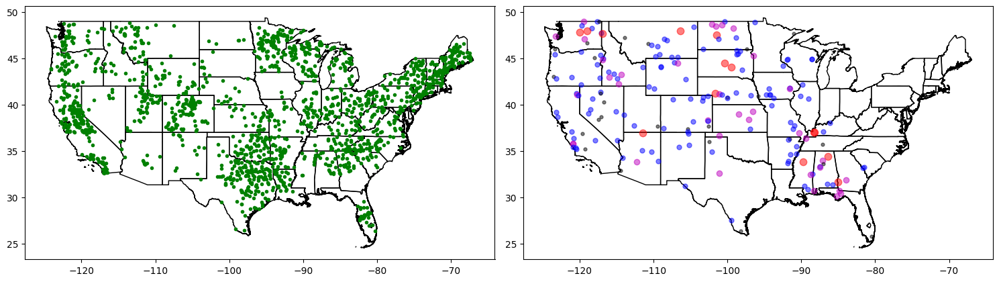

In [11]:
not_done_gid = []
todo_gid = []

fig, ax = plt.subplots(1,2,figsize=(15,5))
# s2_tiles.plot(ax = ax, facecolor='none', ec = 'r', linewidth=0.5)

conus.plot(ax = ax[0], facecolor='none', ec = 'k')
conus.plot(ax = ax[1], facecolor='none', ec = 'k')

for gid in grand['GRAND_ID']:
    x = grand.loc[grand['GRAND_ID']==gid, 'LONG_DD']
    y = grand.loc[grand['GRAND_ID']==gid, 'LAT_DD']
    s = grand.loc[grand['GRAND_ID']==gid, 'AREA_SKM'].values[0]
    
    if gid in done_gid:
        ax[0].plot(x, y, 'g.-')
    else:
        if s<1:
            ax[1].plot(x, y, 'k.-', markersize=7, alpha=0.5)
            todo_gid.append(gid)
        elif s<10:
            
            ax[1].plot(x, y, 'b.-', markersize=10, alpha=0.5)
            todo_gid.append(gid)
        elif s<100:
            ax[1].plot(x, y, 'm.-', markersize=12, alpha=0.5)
            todo_gid.append(gid)
        else:
            ax[1].plot(x, y, 'r.-', markersize=15, alpha=0.5)
            todo_gid.append(gid)
        not_done_gid.append(gid)
plt.tight_layout()
plt.show()

In [12]:
grand_select = grand[grand['GRAND_ID'].isin(todo_gid)]
print(grand_select.shape)

(194, 64)


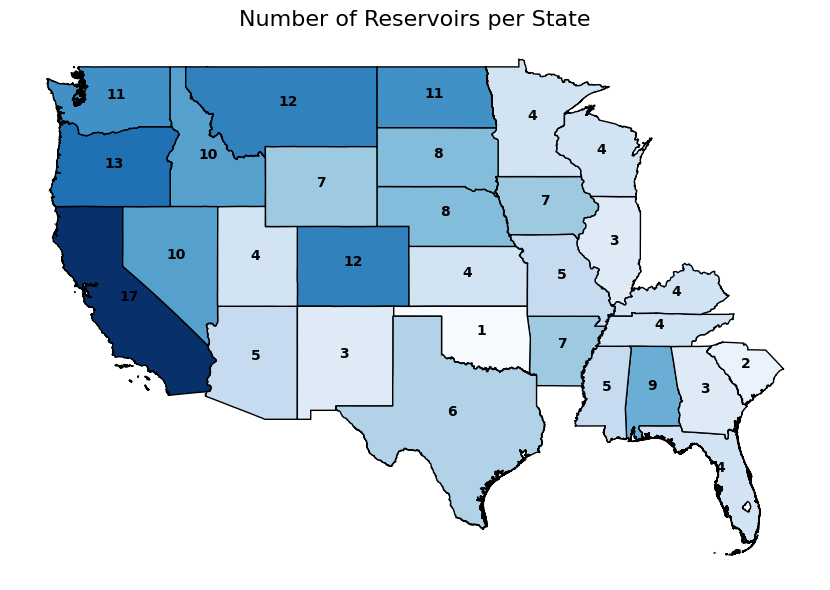

In [13]:
# Ensure CRS is consistent
if grand_select.crs != conus.crs:
    grand_select = grand_select.to_crs(conus.crs)  # Reproject 'grand' to match 'conus'
    
# Spatial join: Match reservoirs to states
reservoirs_with_states = gp.sjoin(grand_select, conus, how='inner', predicate='intersects')

# Count reservoirs per state
state_reservoir_counts = reservoirs_with_states.groupby('STATE').size().reset_index(name='reservoir_count')

# Merge counts with state GeoDataFrame
conus_with_counts = conus.merge(state_reservoir_counts, left_on='STATE', right_on='STATE', how='left')

data = np.log10(grand.loc[grand['GRAND_ID'].isin(not_done_gid), 'AREA_SKM'].values)

# Define bin edges: <1, 1, 10, 100, 1000 (log10 values: -inf, 0, 1, 2, 3)
bins = [-2, -1, 0, 1, 2, 3, 4]

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
conus_with_counts.plot(
    ax=ax,
    column='reservoir_count',
    cmap='Blues',
    legend=False,
    edgecolor='k'
)

# Annotate states with reservoir counts
for idx, row in conus_with_counts.iterrows():
    if not pd.isna(row['reservoir_count']):
        ax.annotate(
            text=str(int(row['reservoir_count'])),
            xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
            ha='center', fontsize=10, color='black', weight='bold'
        )

ax.set_title('Number of Reservoirs per State', fontsize=16)
ax.axis('off')
plt.tight_layout()
plt.show()

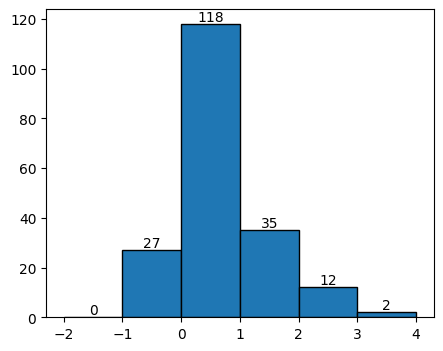

In [14]:
plt.figure(figsize=(5,4))

# Plot histogram
counts, edges, patches = plt.hist(data, bins=bins, edgecolor='black')

# Add count labels above each bar
for count, edge in zip(counts, edges[:-1]):
    plt.text(edge + (edges[1] - edges[0]) / 2, count, int(count), ha='center', va='bottom')

# Add labels and show plot
plt.show()

In [15]:
todo_tiles = s2_res.loc[s2_res['GRAND_ID'].isin(todo_gid),'Name'].unique()
print(len(todo_tiles))

219


In [16]:
todo_df = {}
for res in todo_gid:
    tiles_ = s2_res.loc[s2_res['GRAND_ID']==res,'Name'].values
    todo_df[res] = list(tiles_)

In [17]:
from collections import Counter

# Flatten the list of strings from all dictionary values
all_strings = [s for sublist in todo_df.values() for s in sublist]

# Count the occurrences of each string
counter = Counter(all_strings)

# Get the top 15 strings (or fewer if there aren't 15 unique strings)
top_15 = counter.most_common(15)

# For each top string, also find the keys where it appears
for string, count in top_15:
    keys_with_string = [key for key, values in todo_df.items() if string in values]
    print(f"{string}: {count} occurrences, keys: {keys_with_string}")

11TMK: 4 occurrences, keys: [360, 363, 365, 376]
14TNR: 4 occurrences, keys: [832, 835, 845, 848]
10UGU: 3 occurrences, keys: [49, 294, 310]
10TGL: 3 occurrences, keys: [123, 125, 128]
11TKF: 3 occurrences, keys: [123, 125, 128]
10SFE: 3 occurrences, keys: [230, 231, 232]
11UMQ: 3 occurrences, keys: [289, 290, 310]
13TCK: 3 occurrences, keys: [359, 369, 371]
11TPH: 3 occurrences, keys: [395, 405, 408]
13UGP: 3 occurrences, keys: [729, 732, 753]
15TWK: 3 occurrences, keys: [864, 865, 876]
14TML: 3 occurrences, keys: [912, 926, 928]
15TUF: 3 occurrences, keys: [915, 916, 917]
16SDF: 3 occurrences, keys: [1749, 1752, 1753]
16SDC: 3 occurrences, keys: [1867, 1874, 1888]


In [18]:
max_res_tiles = [x[0] for x in top_15]

In [19]:
green_tiles = [t for t in todo_tiles if s2_res.loc[s2_res['Name']==t,'GRAND_ID'].shape[0]>5]
orange_tiles = [t for t in todo_tiles if s2_res.loc[s2_res['Name']==t,'GRAND_ID'].shape[0]>3]
yellow_tiles = [t for t in todo_tiles if s2_res.loc[s2_res['Name']==t,'GRAND_ID'].shape[0]>0]

In [20]:
current_tiles = os.listdir('/scratch/user/anshulya/hls/data/cluster/')
print(current_tiles)

['16SDF', '16SGA', '16SCG', '16SFA', '16SDC', '16SDG', '16SDE', '16SDB', '17SMS', '16RFV', '15SXT', '16RGV', '16SEC', '16SCE', '16SED', '16SCF']


In [21]:
res_list = [x for x in s2_res.loc[s2_res['Name'].isin(todo_tiles),'GRAND_ID'].unique() if x in todo_gid]
print(len(res_list))

194


In [22]:
import matplotlib.patches as patches

In [23]:
rectangles = [
    (-90,42,8,5),  # (x, y, width, height)
    (-97,43,7,6),
    (-115,37,6,12),
    (-124,40,8,10),
    (-92,33,9,5),
]

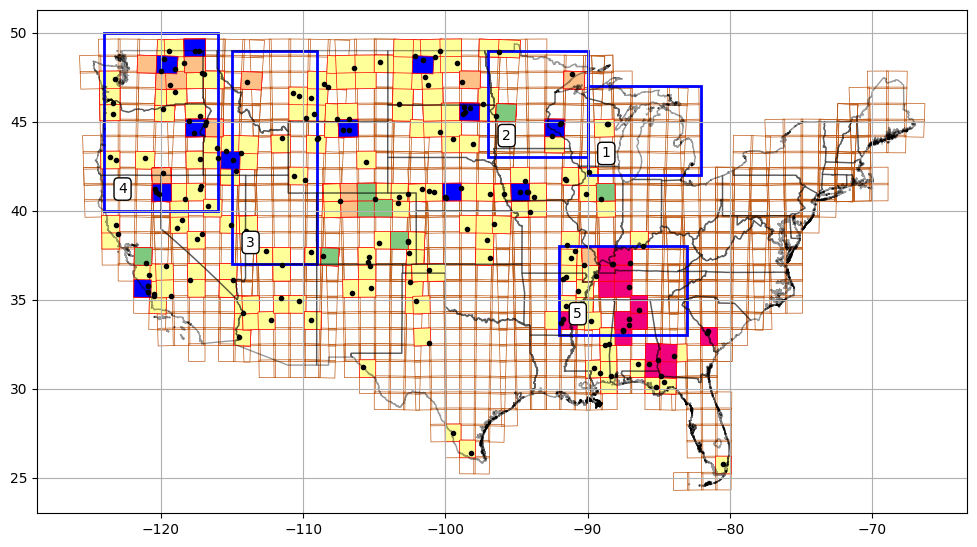

In [24]:
fig, ax = plt.subplots(1,1,figsize=(12,7))
s2_tiles.plot(ax = ax, facecolor='none', ec = '#bf5b17', linewidth=0.5)

s2_tiles[s2_tiles['Name'].isin(yellow_tiles)].plot(ax = ax, facecolor='#ffff99', ec = 'r', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(orange_tiles)].plot(ax = ax, facecolor='#fdc086', ec = 'r', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(green_tiles)].plot(ax = ax, facecolor='#7fc97f', ec = 'r', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(max_res_tiles)].plot(ax = ax, facecolor='blue', ec = 'r', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(current_tiles)].plot(ax = ax, facecolor='#f0027f', ec = 'r', linewidth=0.5)

for gid in todo_gid:
    x = grand.loc[grand['GRAND_ID']==gid, 'LONG_DD']
    y = grand.loc[grand['GRAND_ID']==gid, 'LAT_DD']
    ax.plot(x,y,'k.')

# Add rectangles to the plot
for i, rect in enumerate(rectangles):
    x, y, width, height = rect
    rectangle_patch = patches.Rectangle((x, y), width, height, edgecolor='blue', facecolor='none', linewidth=2)
    ax.add_patch(rectangle_patch)
    ax.text(x+1, y+1, i+1, bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))
    
conus.plot(ax = ax, facecolor='none', ec = 'k',alpha=0.4)
plt.grid()
plt.show()


In [25]:
points = grand[grand['GRAND_ID'].isin(todo_gid)][['LONG_DD', 'LAT_DD']].values

# Initialize a dictionary to store counts
rectangle_counts = []

# Check each rectangle
for rect in rectangles:
    x_min = rect[0]
    y_min = rect[1]
    x_max = x_min + rect[2]
    y_max = y_min + rect[3]
    
    # Count points within the rectangle
    count = ((points[:, 0] >= x_min) & (points[:, 0] <= x_max) &
             (points[:, 1] >= y_min) & (points[:, 1] <= y_max)).sum()
    
    rectangle_counts.append({
        'rectangle': rect,
        'count': count
    })

In [26]:
total = 0
for i, r in enumerate(rectangle_counts):
    size = r['rectangle'][2]*r['rectangle'][3]
    print(i+1,':', r['count'], 'reservoirs with', size, 'tiles -- ', r['count']/size)
    total = total + r['count']
print(total, len(done_gid), len(done_gid)+total)

1 : 3 reservoirs with 40 tiles --  0.075
2 : 6 reservoirs with 42 tiles --  0.14285714285714285
3 : 16 reservoirs with 72 tiles --  0.2222222222222222
4 : 33 reservoirs with 80 tiles --  0.4125
5 : 22 reservoirs with 45 tiles --  0.4888888888888889
80 1783 1863


## Current Cluster

In [27]:
cluster = 5

In [28]:
current_tiles = os.listdir('/scratch/user/anshulya/hls/data/cluster/')
print(current_tiles)

['16SDF', '16SGA', '16SCG', '16SFA', '16SDC', '16SDG', '16SDE', '16SDB', '17SMS', '16RFV', '15SXT', '16RGV', '16SEC', '16SCE', '16SED', '16SCF']


In [29]:
last_res = [x for x in s2_res.loc[s2_res['Name'].isin(current_tiles),'GRAND_ID'].unique()]
len(last_res)

34

In [30]:
print(len([x for x in last_res if x not in done_gid]))
print([x for x in last_res if x not in done_gid])

17
[1132, 1142, 1910, 1912, 1916, 1753, 1752, 1887, 1888, 1867, 1874, 1792, 1749, 1847, 1909, 1891, 1893]


In [31]:
not_done_res = []
for res in last_res:
    if not os.path.exists(f'/scratch/user/anshulya/hls/results/hls_classified/{res}') and not os.path.exists(f'/scratch/user/anshulya/hls/results/new/{res}.csv'):
        not_done_res.append(res)
    # if not os.path.exists(f'/scratch/user/anshulya/hls/results/new/{res}.csv'):
    #     print(res)

In [32]:
len(not_done_res)

0

In [33]:
# def get_folder_size(folder_path):
#     total_size = 0
#     all_files = []

#     # Collect all files in the folder and subfolders
#     for dirpath, dirnames, filenames in os.walk(folder_path):
#         for file in filenames:
#             file_path = os.path.join(dirpath, file)
#             if os.path.isfile(file_path):  # Check to avoid issues with broken links
#                 all_files.append(file_path)

#     # Use tqdm to show progress
#     for file in tqdm(all_files, desc="Calculating folder size", unit="file"):
#         total_size += os.path.getsize(file)

#     return total_size

# # Convert size to a human-readable format
# def human_readable_size(size_bytes):
#     if size_bytes == 0:
#         return "0B"
#     size_units = ["B", "KB", "MB", "GB", "TB"]
#     unit_index = 0
#     while size_bytes >= 1024 and unit_index < len(size_units) - 1:
#         size_bytes /= 1024.0
#         unit_index += 1
#     return f"{size_bytes:.2f} {size_units[unit_index]}"

In [34]:
print(os.listdir('/scratch/user/anshulya/hls/data/cluster/'))

['16SDF', '16SGA', '16SCG', '16SFA', '16SDC', '16SDG', '16SDE', '16SDB', '17SMS', '16RFV', '15SXT', '16RGV', '16SEC', '16SCE', '16SED', '16SCF']


In [35]:
# for tile in ['15TWE', '15SUC', '12STG', '15SVA', '15TYE', '16SCD', '15SWD', '15SVB', '16SCC', '15STC', '16SDD', '15SVC', '15STD', '15SWA', '15SWC']:
#     print(tile)
#     files = os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{tile}/unmerged_rasters/')
#     for f in tqdm(files):
#         shutil.rmtree(f'/scratch/user/anshulya/hls/data/cluster/{tile}/unmerged_rasters/{f}')

In [36]:
for tile in os.listdir('/scratch/user/anshulya/hls/data/cluster/'):
    x = len(os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{tile}/unmerged_rasters/'))
    print(tile, x)
    # if x == 0:
    #     os.rmdir(f'/scratch/user/anshulya/hls/data/cluster/{tile}/unmerged_rasters')
    #     os.rmdir(f'/scratch/user/anshulya/hls/data/cluster/{tile}')

16SDF 998
16SGA 1067
16SCG 940
16SFA 1054
16SDC 871
16SDG 951
16SDE 984
16SDB 1023
17SMS 1077
16RFV 1209
15SXT 1024
16RGV 1098
16SEC 1041
16SCE 1129
16SED 1014
16SCF 1129


In [37]:
rect = rectangles[cluster-1]
x_min = rect[0]
y_min = rect[1]
x_max = x_min + rect[2]
y_max = y_min + rect[3]

In [38]:
# x_min = -72.5
# y_min = 41.5
# x_max = x_min + 1
# y_max = y_min + 1

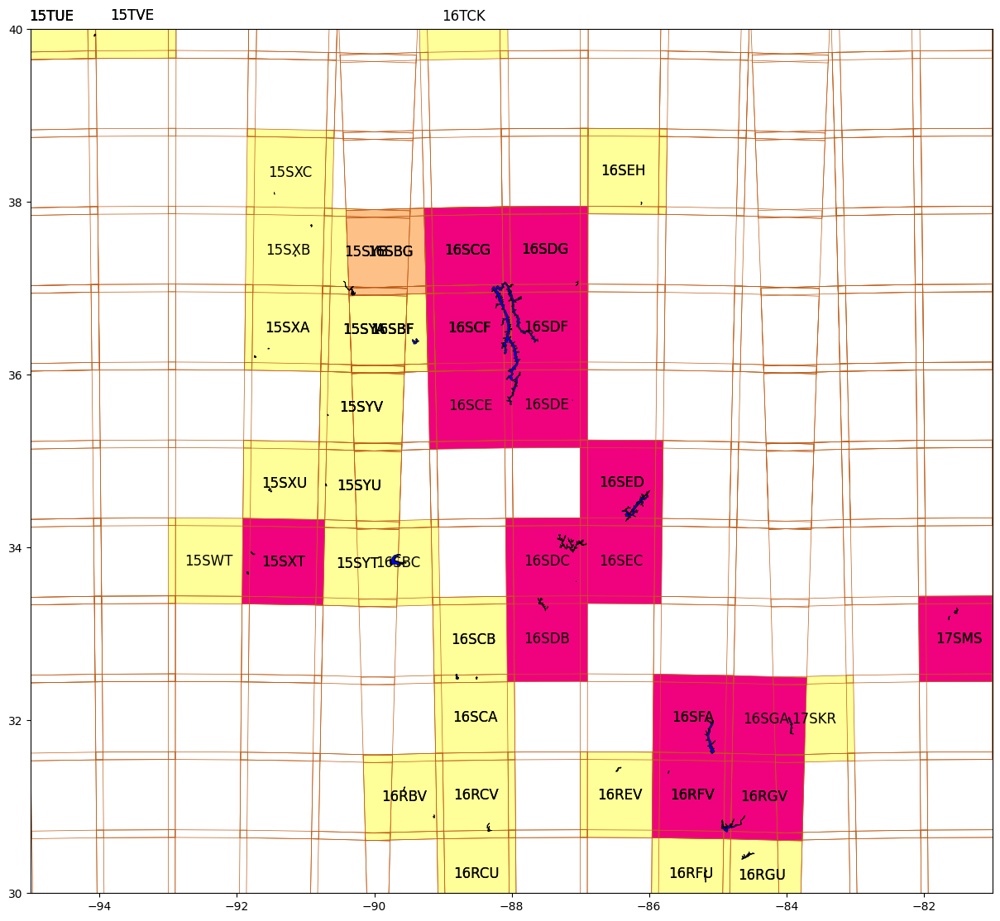

In [39]:
fig, ax = plt.subplots(1,1,figsize=(15,15))

s2_tiles[s2_tiles['Name'].isin(yellow_tiles)].plot(ax = ax, facecolor='#ffff99', ec = 'none', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(orange_tiles)].plot(ax = ax, facecolor='#fdc086', ec = 'none', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(green_tiles)].plot(ax = ax, facecolor='#7fc97f', ec = 'none', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(max_res_tiles)].plot(ax = ax, facecolor='red', ec = 'r', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(current_tiles)].plot(ax = ax, facecolor='#f0027f', ec = 'none', linewidth=0.5)

s2_tiles.plot(ax = ax, facecolor='none', ec = '#bf5b17', linewidth=0.5)

grand[grand['GRAND_ID'].isin(todo_gid)].plot(ax = ax, facecolor='blue', ec = 'k', linewidth=0.5)
# grand[grand['GRAND_ID'].isin(done_gid)].plot(ax = ax, facecolor='green', ec = 'g', linewidth=0.5)

# conus.plot(ax = ax, facecolor='none', ec = 'k',alpha=0.4)

# Set the x and y limits
ax.set_xlim([x_min-3, x_max+2])
ax.set_ylim([y_min-3, y_max+2])

# Filter green tiles based on the centroid being within the xlim and ylim
filtered_tiles = []

for _, row in s2_tiles[(s2_tiles['Name'].isin(yellow_tiles))|(s2_tiles['Name'].isin(orange_tiles))|(s2_tiles['Name'].isin(green_tiles))|(s2_tiles['Name'].isin(current_tiles))].iterrows():
# for _, row in s2_tiles.iterrows():
    centroid = row['geometry'].centroid
    # if not '15' in row['Name']:
    #     continue
    if x_min-3 <= centroid.x <= x_max+3 and y_min-3 <= centroid.y <= y_max+3:
        ax.text(centroid.x, centroid.y, row['Name'], fontsize=12, ha='center', va='center', color='black')
        filtered_tiles.append(row['Name'])

# Display the plot
plt.show()

# # Remove duplicates from the list of filtered tile names
# filtered_tiles = list(set(filtered_tiles))

# # Output the list of filtered tile names
# print("Filtered green tile names:", filtered_tiles)

In [40]:
res_list = [x for x in s2_res.loc[s2_res['Name'].isin(current_tiles),'GRAND_ID'].unique()]
current_done = [x for x in res_list if x in done_gid]
current_todo = [x for x in res_list if x not in done_gid]
print(len(res_list), len(current_done), len(current_todo))

34 17 17


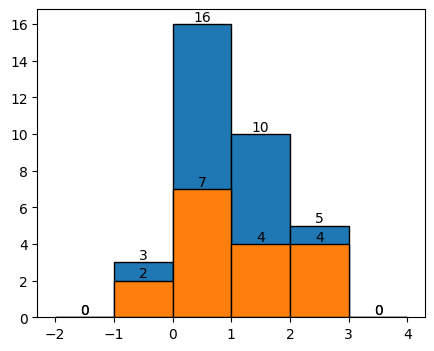

In [42]:
data1 = np.log10(grand.loc[grand['GRAND_ID'].isin(res_list), 'AREA_SKM'].values)
data = np.log10(grand.loc[grand['GRAND_ID'].isin(current_todo), 'AREA_SKM'].values)

# Define bin edges: <1, 1, 10, 100, 1000 (log10 values: -inf, 0, 1, 2, 3)
bins = [-2, -1, 0, 1, 2, 3, 4]

plt.figure(figsize=(5,4))

# Plot histogram
counts1, edges1, patches1 = plt.hist(data1, bins=bins, edgecolor='black')
counts, edges, patches = plt.hist(data, bins=bins, edgecolor='black')

# Add count labels above each bar
for count, edge in zip(counts, edges[:-1]):
    plt.text(edge + (edges[1] - edges[0]) / 2, count, int(count), ha='center', va='bottom')

for count1, edge1 in zip(counts1, edges1[:-1]):
    plt.text(edge1 + (edges1[1] - edges1[0]) / 2, count1, int(count1), ha='center', va='bottom')

# Add labels and show plot
plt.show()

In [43]:
todo_res_list = {}
ext_res = []
for r in current_todo:
    tiles = s2_res.loc[s2_res['GRAND_ID']==r,'Name'].unique()
    rogue = [t for t in tiles if t not in current_tiles]
    if len(rogue)>0:
        # print(r, tiles)
        print(r, [t for t in tiles if t not in current_tiles])
        ext_res.append(r)
    else:
        # d_tiles = [t for t in tiles if t in todo_tiles]
        todo_res_list[r] = list(tiles)
print('Reservoirs to be processed: ',len(todo_res_list),'; Rogue reservoirs: ', len(ext_res))

1142 ['15SWT']
1916 ['16RFU', '16RGU']
1909 ['17SKR']
Reservoirs to be processed:  14 ; Rogue reservoirs:  3


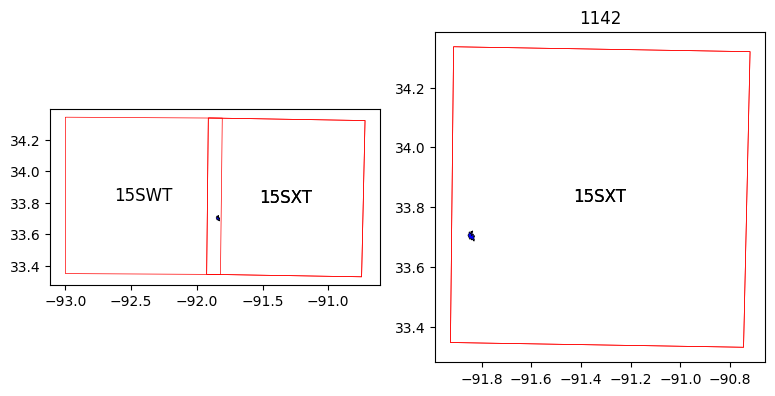

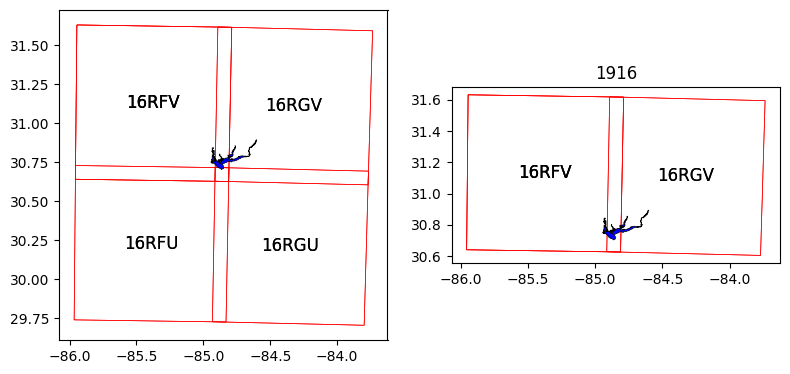

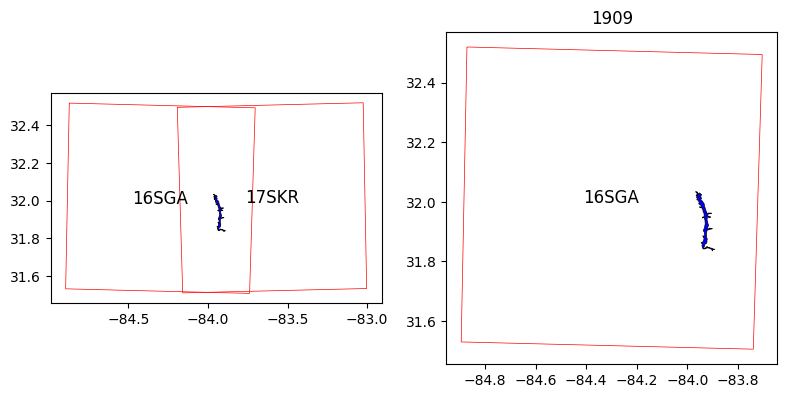

In [44]:
for r in ext_res:
    tiles = s2_res.loc[s2_res['GRAND_ID']==r,'Name'].unique()
    d_tiles = [t for t in tiles if t in current_tiles]

    fig, ax = plt.subplots(1,2,figsize=(8,4))
    s2_tiles[s2_tiles['Name'].isin(tiles)].plot(ax = ax[0], facecolor='None', ec = 'r', linewidth=0.5)
    grand[grand['GRAND_ID'].isin([r])].plot(ax = ax[0], facecolor='blue', ec = 'k', linewidth=0.5)
    
    for _, row in s2_tiles[(s2_tiles['Name'].isin(tiles))].iterrows():
        centroid = row['geometry'].centroid
        ax[0].text(centroid.x, centroid.y, row['Name'], fontsize=12, ha='center', va='center', color='black')
    
    s2_tiles[s2_tiles['Name'].isin(d_tiles)].plot(ax = ax[1], facecolor='None', ec = 'r', linewidth=0.5)
    grand[grand['GRAND_ID'].isin([r])].plot(ax = ax[1], facecolor='blue', ec = 'k', linewidth=0.5)

    for _, row in s2_tiles[(s2_tiles['Name'].isin(d_tiles))].iterrows():
        centroid = row['geometry'].centroid
        ax[1].text(centroid.x, centroid.y, row['Name'], fontsize=12, ha='center', va='center', color='black')

    plt.title(r)
    plt.tight_layout()
    plt.show()    

In [45]:
print(ext_res)

[1142, 1916, 1909]


In [46]:
okay_rogue = [1142, 1916, 1909]

In [47]:
todo_res_list = {}
ext_res = []
for r in current_todo:
    tiles = s2_res.loc[s2_res['GRAND_ID']==r,'Name'].unique()
    rogue = [t for t in tiles if t not in current_tiles]
    if len(rogue)>0:
        if r in okay_rogue:
            d_tiles = [t for t in tiles if t in current_tiles]
            todo_res_list[r] = list(d_tiles)
        else:
            print(r, [t for t in tiles if t not in current_tiles])
            ext_res.append(r)
    else:
        todo_res_list[r] = list(tiles)
print('Reservoirs to be processed: ',len(todo_res_list),'; Rogue reservoirs: ', len(ext_res))

Reservoirs to be processed:  17 ; Rogue reservoirs:  0


## Find out the max extent

This will be used for half image correction later during classification

In [48]:
todo_res_gid = todo_res_list.keys()
print(len(todo_res_gid))

17


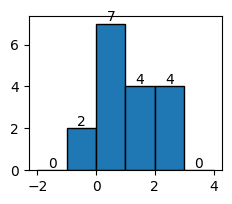

In [49]:
data = np.log10(grand.loc[grand['GRAND_ID'].isin(todo_res_gid), 'AREA_SKM'].values)

# Define bin edges: <1, 1, 10, 100, 1000 (log10 values: -inf, 0, 1, 2, 3)
bins = [-2, -1, 0, 1, 2, 3, 4]

plt.figure(figsize=(2.5,2))

# Plot histogram
counts, edges, patches = plt.hist(data, bins=bins, edgecolor='black')

# Add count labels above each bar
for count, edge in zip(counts, edges[:-1]):
    plt.text(edge + (edges[1] - edges[0]) / 2, count, int(count), ha='center', va='bottom')

# Add labels and show plot
plt.show()

In [50]:
# shutil.rmtree('/scratch/user/anshulya/hls/data/cluster/15TXK/unmerged_rasters/2016277/')

In [51]:
max_date_df = pd.DataFrame(columns=['res_gid', 'l30_date', 's30_date'])
single_tile = 0
for r in tqdm(todo_res_gid):
    try:
        sflag = 0
        lflag = 0
        
        tiles = todo_res_list[r]
        if len(tiles)>1:
            dates = os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{tiles[0]}/unmerged_rasters')
            for t in tiles[1:]:
                dates_ = os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters')
                dates = [d for d in dates if d in dates_]
                if len(dates) == 0:
                    print('No full date for ', r)
                    break
            if len(dates)>0:
                # print('Full dates for ',r, ': ', dates)
                for d in dates:
                    s30 = 0
                    l30 = 0
                    for t in tiles:
                        if 'S30' in os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{d}'):
                            s30 = s30 + 1
                        if 'L30' in os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{d}'):
                            l30 = l30 + 1
                    if s30 == len(tiles):
                        x = np.sum([len(os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{d}/S30')) for t in tiles])
                        if x == 16*len(tiles):
                            sdate = d
                            sflag = 1
                    if l30 == len(tiles):
                        x = np.sum([len(os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{d}/L30')) for t in tiles])
                        if x == 12*len(tiles):
                            ldate = d
                            lflag = 1
                    if sflag ==1 and lflag == 1:
                        new_row = pd.DataFrame([{'res_gid': r, 'l30_date': ldate, 's30_date': sdate}])
                        max_date_df = pd.concat([max_date_df, new_row], ignore_index=True)
                        break
        else:
            single_tile = single_tile + 1
            dates = os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{tiles[0]}/unmerged_rasters')
            for d in dates:
                if 'S30' in os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{tiles[0]}/unmerged_rasters/{d}'):
                    x = np.sum([len(os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{d}/S30')) for t in tiles])
                    if x == 16*len(tiles):
                        sdate = d
                        sflag = 1
                if 'L30' in os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{tiles[0]}/unmerged_rasters/{d}'):
                    x = np.sum([len(os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{d}/L30')) for t in tiles])
                    if x == 12*len(tiles):
                        ldate = d
                        lflag = 1
                if sflag ==1 and lflag == 1:
                    new_row = pd.DataFrame([{'res_gid': r, 'l30_date': ldate, 's30_date': sdate}])
                    max_date_df = pd.concat([max_date_df, new_row], ignore_index=True)
                    break
    except:
        traceback.print_exc()
        continue

100%|██████████| 17/17 [00:00<00:00, 46.09it/s]


In [52]:
print(single_tile, max_date_df.shape[0])

9 17


In [53]:
def project_hls_latlon(hls, jrc, filename = 'hls_proj.tif'):
    projTIF = filename
    transform, width, height = calculate_default_transform(
        hls.crs, jrc.crs, hls.width, hls.height, *hls.bounds)
    kwargs = hls.meta.copy()
    kwargs.update({
        'crs': jrc.crs,
        'transform': transform,
        'width': width,
        'height': height
    })

    with rio.open(projTIF, 'w', **kwargs) as dst:
        for i in range(1, hls.count + 1):
            reproject(
                source=rio.band(hls, i),
                destination=rio.band(dst, i),
                src_transform=hls.transform,
                src_crs=hls.crs,
                dst_transform=transform,
                dst_crs=jrc.crs,
                resampling=Resampling.nearest)
    return projTIF

def reproject_unmerged_rasters(save_path):
    print('start of reprojections')
    for filename in tqdm(os.listdir(save_path)):
        if filename == 'tile_metadata.csv':
            continue
        if os.path.isfile(os.path.join(save_path, filename)):
            jrc = rio.open('/scratch/user/anshulya/hls/data/383_LAKE_MEAD.tif')
            hls = rio.open(os.path.join(save_path, filename))
            project_hls_latlon(hls, jrc, os.path.join(save_path, filename))

## Merge downloaded rasters
def merge_max_rasters(res_gid, bands, l30_rasters_to_merge, save_path, sat):
    if not os.path.exists(os.path.join(save_path, sat)):
        os.makedirs(os.path.join(save_path, sat))
    
    for b in tqdm(bands):
        bandpaths = []
        for dirpath in l30_rasters_to_merge:
            bandpaths.append([os.path.join(dirpath, bname) for bname in os.listdir(dirpath) if b in bname][0])
        # print(bandpaths)
        rasters = [rio.open(raster_path) for raster_path in bandpaths]
    
        # Merge the rasters into a single dataset
        b1_merged, b1_merged_transform = merge(rasters)
    
        # Update the metadata of the merged dataset
        b1_merged_meta = rasters[0].meta.copy()
        b1_merged_meta.update({
            'height': b1_merged.shape[1],
            'width': b1_merged.shape[2],
            'transform': b1_merged_transform
        })
        
        if not os.path.exists(os.path.join(save_path, sat)):
            os.makedirs(os.path.join(save_path, sat))
        
        # Create a new raster file to store the stitched data
        output_path = os.path.join(save_path, sat, b +'_stitched_raster.tif')
        # print(output_path)
        with rio.open(output_path, 'w', **b1_merged_meta) as dst:
            dst.write(b1_merged)
        
        # Close all the input rasters
        for raster in rasters:
            raster.close()


def getFeatures(gdf):
  """Function to parse features from GeoDataFrame in such a manner that rasterio wants them"""
  import json
  return [json.loads(gdf.to_json())['features'][0]['geometry']]

def clip_raster(src, res, fname = 'clipped_hls.tif'):
  coords = getFeatures(res)

  # Clip the raster with Polygon
  out_image, out_transform = mask(dataset=src, shapes=coords, crop=True, nodata=-9999)

  # Update the metadata with the new bounds and resolution
  out_meta = src.meta.copy()
  out_meta.update({
      'height': out_image.shape[1],
      'width': out_image.shape[2],
      'transform': out_transform
  })

  with rio.open(fname, 'w', **out_meta) as dest:
    dest.write(out_image)
  return fname

In [54]:
okay_max = []
for res_gid in todo_res_gid:
    flag1, flag2 = 0, 0
    if os.path.exists(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/L30/B05_clipped_raster.tif'):
        print(f'Max Landsat raster already available for: {res_gid}')
        
        # ras = rio.open(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/L30/B05_clipped_raster.tif')
        # fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
        # show(ras, ax = ax)
        # grand[grand['GRAND_ID'].isin([res_gid])].plot(ax = ax, facecolor='none', ec = 'k', linewidth=0.5)
        # plt.tight_layout()
        # plt.show()
        flag1 = 1
        
    if os.path.exists(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/S30/B05_clipped_raster.tif'):
        print(f'Max Sentinel raster already available for: {res_gid}')

        # ras = rio.open(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/S30/B8A_clipped_raster.tif')
        # fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
        # show(ras, ax = ax)
        # grand[grand['GRAND_ID'].isin([res_gid])].plot(ax = ax, facecolor='none', ec = 'k', linewidth=0.5)
        # plt.tight_layout()
        # plt.show()
        flag2 = 1

    if flag1 == 1 and flag2 ==1:
        okay_max.append(res_gid)

Max Landsat raster already available for: 1132
Max Sentinel raster already available for: 1132
Max Landsat raster already available for: 1142
Max Sentinel raster already available for: 1142
Max Landsat raster already available for: 1910
Max Sentinel raster already available for: 1910
Max Landsat raster already available for: 1912
Max Sentinel raster already available for: 1912
Max Landsat raster already available for: 1916
Max Sentinel raster already available for: 1916
Max Landsat raster already available for: 1753
Max Sentinel raster already available for: 1753
Max Landsat raster already available for: 1752
Max Sentinel raster already available for: 1752
Max Landsat raster already available for: 1887
Max Sentinel raster already available for: 1887
Max Landsat raster already available for: 1888
Max Sentinel raster already available for: 1888
Max Landsat raster already available for: 1867
Max Sentinel raster already available for: 1867
Max Landsat raster already available for: 1874
Max

In [55]:
print(len(okay_max), okay_max)

17 [1132, 1142, 1910, 1912, 1916, 1753, 1752, 1887, 1888, 1867, 1874, 1792, 1749, 1847, 1909, 1891, 1893]


In [56]:
def process_res_gid(res_gid):
    if res_gid in okay_max:
        return
    
    s30_date = max_date_df.loc[max_date_df['res_gid'] == res_gid, 's30_date'].values[0]
    l30_date = max_date_df.loc[max_date_df['res_gid'] == res_gid, 'l30_date'].values[0]
    
    tiles = todo_res_list[res_gid]
    print(res_gid, tiles)
    
    s30_rasters_to_merge = [
        f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{s30_date}/S30' for t in tiles
    ]
    l30_rasters_to_merge = [
        f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{l30_date}/L30' for t in tiles
    ]

    print(len(s30_rasters_to_merge), len(l30_rasters_to_merge))
    
    # Define bands to be downloaded
    l30_bands = ['B01', 'B03', 'B05', 'B06', 'B04', 'Fmask', 'B07', 'B10', 'B02', 'B11', 'SAA', 'SZA']
    s30_bands = ['B10', 'B07', 'B09', 'B04', 'B03', 'B11', 'B06', 'B12', 'B02', 'B8A', 'B08', 'B01', 'Fmask', 'B05', 'SAA', 'SZA']

    save_path = f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}'
    res = grand.loc[grand['GRAND_ID'] == res_gid]
    res.geometry = res.geometry.buffer(0.01)
    
    # L30 merge
    for dirpath in l30_rasters_to_merge:
        reproject_unmerged_rasters(dirpath)
    print('Merging rasters ... ')
    merge_max_rasters(res_gid, l30_bands, l30_rasters_to_merge, save_path, 'L30')

    print('Clipping rasters ... ')
    for f in os.listdir(f'{save_path}/L30/'):
        ras = rio.open(f'{save_path}/L30/{f}')
        cr_name = f.split('_')[0] + '_clipped_raster.tif'
        clip_raster(ras, res, f'{save_path}/L30/{cr_name}')
        ras.close()
        os.remove(f'{save_path}/L30/{f}')
    print('----------------------')

    # S30 merge
    for dirpath in s30_rasters_to_merge:
        reproject_unmerged_rasters(dirpath)
    print('Merging rasters ... ')
    merge_max_rasters(res_gid, s30_bands, s30_rasters_to_merge, save_path, 'S30')

    print('Clipping rasters ... ')
    for f in os.listdir(f'{save_path}/S30/'):
        ras = rio.open(f'{save_path}/S30/{f}')
        cr_name = f.split('_')[0] + '_clipped_raster.tif'
        clip_raster(ras, res, f'{save_path}/S30/{cr_name}')
        ras.close()
        os.remove(f'{save_path}/S30/{f}')
    print('----------------------')

In [57]:
# with ProcessPoolExecutor(max_workers=40) as executor:
#     list(executor.map(process_res_gid, [x for x in todo_res_list.keys() if x not in okay_max]))

In [58]:
for idx, res_gid in enumerate(todo_res_list.keys()):

    print(idx)
    if res_gid in okay_max:
        continue
    
    s30_date = max_date_df.loc[max_date_df['res_gid']==res_gid,'s30_date'].values[0]
    l30_date = max_date_df.loc[max_date_df['res_gid']==res_gid,'l30_date'].values[0]
    
    tiles = todo_res_list[res_gid]
    print(res_gid, tiles)
    
    s30_rasters_to_merge = []
    l30_rasters_to_merge = []
    
    for t in tiles:
        s30_rasters_to_merge.append(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{s30_date}/S30')
        l30_rasters_to_merge.append(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{l30_date}/L30')

    print(len(s30_rasters_to_merge),len(l30_rasters_to_merge))
    
    # Define bands to be downloaded
    l30_bands = ['B01', 'B03', 'B05', 'B06', 'B04', 'Fmask', 'B07',
            'B10', 'B02', 'B11','SAA','SZA']
    s30_bands = ['B10', 'B07', 'B09', 'B04', 'B03', 'B11', 'B06',
            'B12','B02', 'B8A', 'B08', 'B01', 'Fmask','B05','SAA','SZA']

    save_path = f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}'
    res = grand.loc[grand['GRAND_ID']==res_gid]
    res.geometry = res.geometry.buffer(0.01)
    
    #L30 merge
    for dirpath in l30_rasters_to_merge:
        reproject_unmerged_rasters(dirpath)
    print('Merging rasters ... ')
    merge_max_rasters(res_gid, l30_bands, l30_rasters_to_merge, save_path, 'L30')

    print('Clipping rasters ... ')
    for f in tqdm(os.listdir(f'{save_path}/L30/')):
        ras = rio.open(f'{save_path}/L30/{f}')
        cr_name = f.split('_')[0] + '_clipped_raster.tif'
        clip_raster(ras, res, f'{save_path}/L30/{cr_name}' )
        ras.close()
        os.remove(f'{save_path}/L30/{f}')
    print('----------------------')

    #S30 merge
    for dirpath in s30_rasters_to_merge:
        reproject_unmerged_rasters(dirpath)
    print('Merging rasters ... ')
    merge_max_rasters(res_gid, s30_bands, s30_rasters_to_merge, save_path, 'S30')

    print('Clipping rasters ... ')
    for f in tqdm(os.listdir(f'{save_path}/S30/')):
        ras = rio.open(f'{save_path}/S30/{f}')
        cr_name = f.split('_')[0] + '_clipped_raster.tif'
        clip_raster(ras, res, f'{save_path}/S30/{cr_name}' )
        ras.close()
        os.remove(f'{save_path}/S30/{f}')
    print('----------------------')
    

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16


In [59]:
for res_gid in todo_res_gid:
    if not (os.path.exists(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/L30/B01_clipped_raster.tif') 
            and os.path.exists(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/S30/B01_clipped_raster.tif')):
        print('Max raster does not exist for reservoir: ', res_gid)

Max Landsat raster already available for: 1132


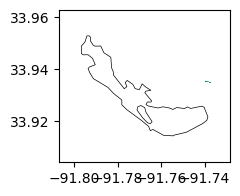

Max Sentinel raster already available for: 1132


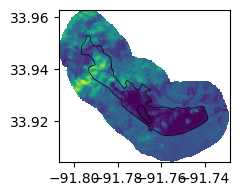

Max Landsat raster already available for: 1142


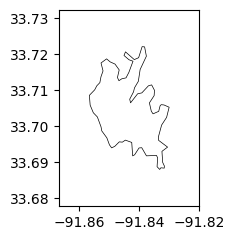

Max Sentinel raster already available for: 1142


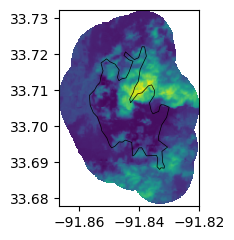

Max Landsat raster already available for: 1910


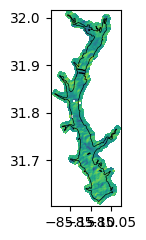

Max Sentinel raster already available for: 1910


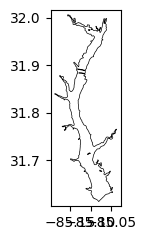

Max Landsat raster already available for: 1912


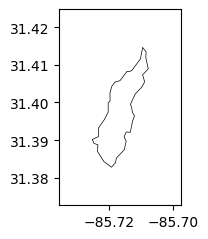

Max Sentinel raster already available for: 1912


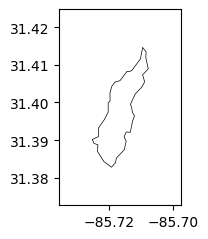

Max Landsat raster already available for: 1916


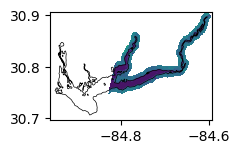

Max Sentinel raster already available for: 1916


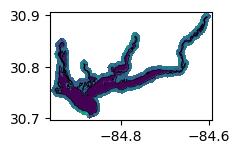

Max Landsat raster already available for: 1753


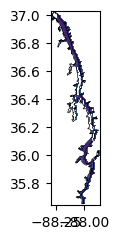

Max Sentinel raster already available for: 1753


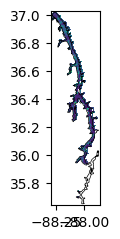

Max Landsat raster already available for: 1752


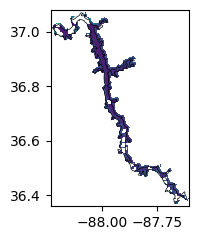

Max Sentinel raster already available for: 1752


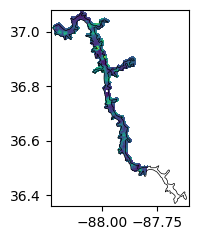

Max Landsat raster already available for: 1887


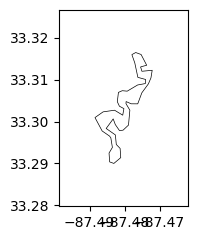

Max Sentinel raster already available for: 1887


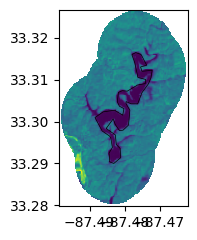

Max Landsat raster already available for: 1888


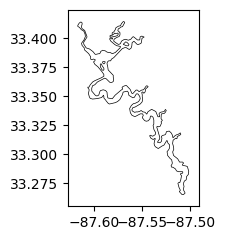

Max Sentinel raster already available for: 1888


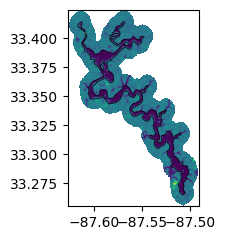

Max Landsat raster already available for: 1867


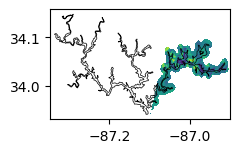

Max Sentinel raster already available for: 1867


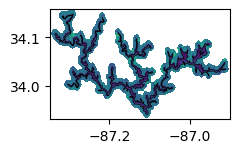

Max Landsat raster already available for: 1874


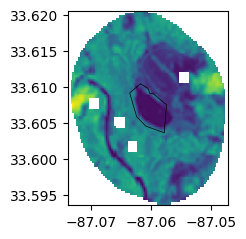

Max Sentinel raster already available for: 1874


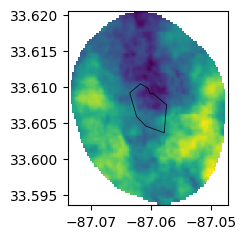

Max Landsat raster already available for: 1792


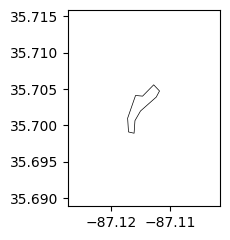

Max Sentinel raster already available for: 1792


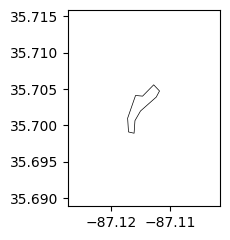

Max Landsat raster already available for: 1749


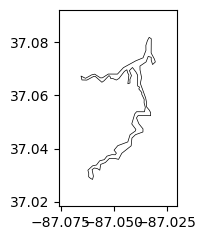

Max Sentinel raster already available for: 1749


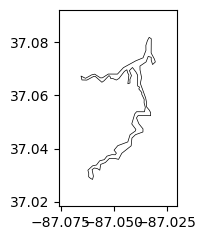

Max Landsat raster already available for: 1847


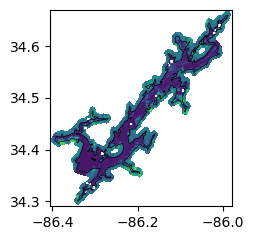

Max Sentinel raster already available for: 1847


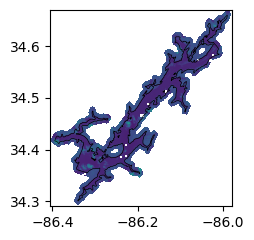

Max Landsat raster already available for: 1909


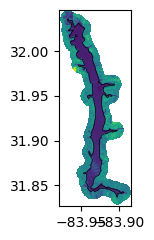

Max Sentinel raster already available for: 1909


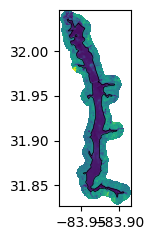

Max Landsat raster already available for: 1891


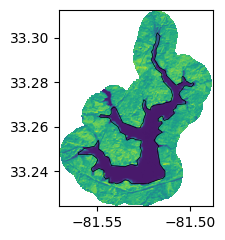

Max Sentinel raster already available for: 1891


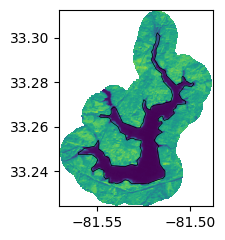

Max Landsat raster already available for: 1893


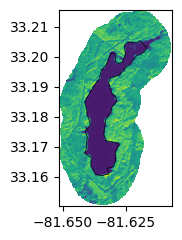

Max Sentinel raster already available for: 1893


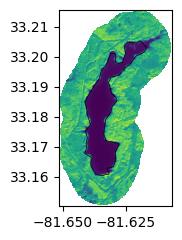

In [60]:
for res_gid in todo_res_gid:
    if os.path.exists(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/L30/B05_clipped_raster.tif'):
        print(f'Max Landsat raster already available for: {res_gid}')
        
        ras = rio.open(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/L30/B05_clipped_raster.tif')
        fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
        show(ras, ax = ax)
        grand[grand['GRAND_ID'].isin([res_gid])].plot(ax = ax, facecolor='none', ec = 'k', linewidth=0.5)
        plt.tight_layout()
        plt.show()
        
    if os.path.exists(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/S30/B05_clipped_raster.tif'):
        print(f'Max Sentinel raster already available for: {res_gid}')

        ras = rio.open(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/S30/B8A_clipped_raster.tif')
        fig, ax = plt.subplots(1,1,figsize=(2.5,2.5))
        show(ras, ax = ax)
        grand[grand['GRAND_ID'].isin([res_gid])].plot(ax = ax, facecolor='none', ec = 'k', linewidth=0.5)
        plt.tight_layout()
        plt.show()

In [61]:
len(todo_res_list.keys())

17

In [62]:
todo_res_list

{1132: ['15SXT'],
 1142: ['15SXT'],
 1910: ['16RFV', '16SFA'],
 1912: ['16RFV'],
 1916: ['16RFV', '16RGV'],
 1753: ['16SCE', '16SCF', '16SCG', '16SDE', '16SDF'],
 1752: ['16SCF', '16SCG', '16SDF', '16SDG'],
 1887: ['16SDB'],
 1888: ['16SDB', '16SDC'],
 1867: ['16SDC', '16SEC'],
 1874: ['16SDC'],
 1792: ['16SDE'],
 1749: ['16SDF', '16SDG'],
 1847: ['16SEC', '16SED'],
 1909: ['16SGA'],
 1891: ['17SMS'],
 1893: ['17SMS']}

In [63]:
todo_tiles = list(set().union(*todo_res_list.values()))
print(todo_tiles)

['15SXT', '16RFV', '16SDE', '16SED', '16SCF', '16SFA', '16SCE', '16RGV', '16SDB', '16SDF', '16SCG', '16SEC', '17SMS', '16SDC', '16SDG', '16SGA']


In [48]:
def generate_sh_file(filename, job_name, time, nodes, ntasks, mem, output_path, start_date, end_date, additional_param):
    content = f"""#!/bin/bash
                
##NECESSARY JOB SPECIFICATIONS
#SBATCH --job-name={job_name}       # Set the job name
#SBATCH --time={time}               # Set the wall clock limit
#SBATCH --nodes={nodes}                    # Request number of nodes
#SBATCH --ntasks-per-node={ntasks}         # Tasks per node
#SBATCH --mem={mem}                     # Memory request
#SBATCH --output={output_path}      # Send stdout/err to output file

##OPTIONAL JOB SPECIFICATIONS
##SBATCH --mail-type=ALL              # Send email on all job events
##SBATCH --mail-user=anshulya@tamu.edu    # Send all emails to email address

# First Executable Line
module load Anaconda3          # Load Anaconda module
source activate /scratch/user/anshulya/.conda/envs/hls_env
echo "Environment Activated"
module load WebProxy
pip install geopandas

python code/cluster_reservoir_area.py {start_date} {end_date} {additional_param}"""
    with open(filename, 'w') as file:
        file.write(content)
    print(f"File {filename} generated successfully.")

In [77]:
for i, y in enumerate(range(2016,2024)):
    generate_sh_file(
        filename=f"/scratch/user/anshulya/hls/cluster_area{i+1}.sh",
        job_name=f"cluster_area_{i+1}",
        time="15:00:00",
        nodes=1,
        ntasks=12,
        mem="32G",
        output_path=f"/scratch/user/anshulya/hls/jobs/log_files/cluster_area_{i+1}_CONUS.%j",
        start_date=f"01-01-{y}",
        end_date=f"06-30-{y}",
        additional_param=40
    )
    generate_sh_file(
        filename=f"/scratch/user/anshulya/hls/cluster_area{i+9}.sh",
        job_name=f"cluster_area_{i+9}",
        time="15:00:00",
        nodes=1,
        ntasks=12,
        mem="32G",
        output_path=f"/scratch/user/anshulya/hls/jobs/log_files/cluster_area_{i+9}_CONUS.%j",
        start_date=f"07-01-{y}",
        end_date=f"12-31-{y}",
        additional_param=40
    )

File /scratch/user/anshulya/hls/cluster_area1.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area9.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area2.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area10.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area3.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area11.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area4.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area12.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area5.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area13.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area6.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area14.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area7.sh generated successfully.
File /scratch/user/anshulya/hls/cluster_area15

## Delete Extra Tiles

In [64]:
okay_tiles = [x for x in current_tiles if x not in todo_tiles]
print('Safe to delete tiles: ', okay_tiles)

Safe to delete tiles:  []


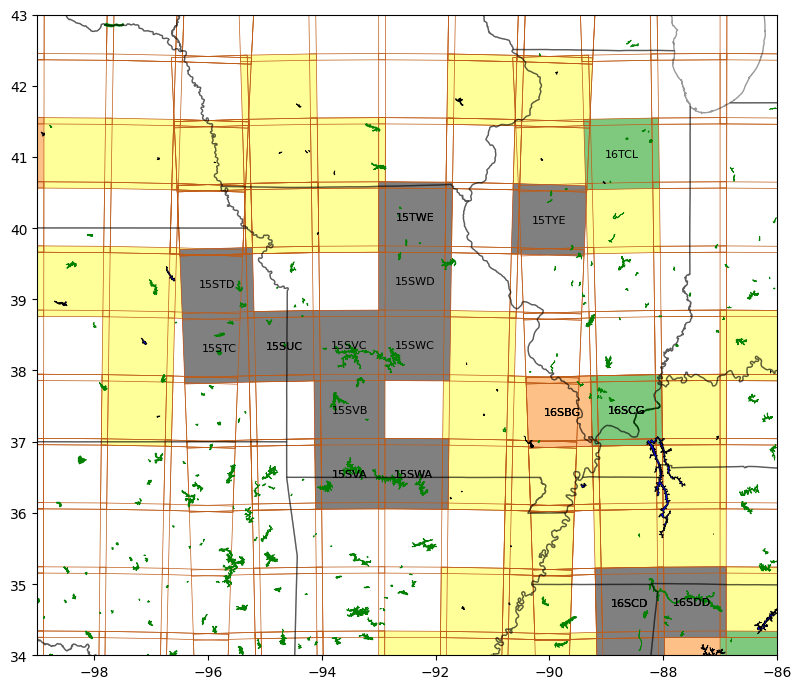

In [48]:
fig, ax = plt.subplots(1,1,figsize=(12,7))

s2_tiles[s2_tiles['Name'].isin(yellow_tiles)].plot(ax = ax, facecolor='#ffff99', ec = 'none', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(orange_tiles)].plot(ax = ax, facecolor='#fdc086', ec = 'none', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(green_tiles)].plot(ax = ax, facecolor='#7fc97f', ec = 'none', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(current_tiles)].plot(ax = ax, facecolor='#f0027f', ec = 'none', linewidth=0.5)
s2_tiles[s2_tiles['Name'].isin(okay_tiles)].plot(ax = ax, facecolor='gray', ec = 'none', linewidth=0.5)

s2_tiles.plot(ax = ax, facecolor='none', ec = '#bf5b17', linewidth=0.5)

grand[grand['GRAND_ID'].isin(todo_gid)].plot(ax = ax, facecolor='blue', ec = 'k', linewidth=0.5)
grand[grand['GRAND_ID'].isin(done_gid)].plot(ax = ax, facecolor='green', ec = 'g', linewidth=0.5)

conus.plot(ax = ax, facecolor='none', ec = 'k',alpha=0.4)

# Set the x and y limits
ax.set_xlim([x_min-2, x_max+2])
ax.set_ylim([y_min-2, y_max+2])

for _, row in s2_tiles[(s2_tiles['Name'].isin(orange_tiles))|(s2_tiles['Name'].isin(green_tiles))|(s2_tiles['Name'].isin(current_tiles))].iterrows():
    centroid = row['geometry'].centroid
    if x_min-2 <= centroid.x <= x_max+2 and y_min-2 <= centroid.y <= y_max+2:
        ax.text(centroid.x, centroid.y, row['Name'], fontsize=8, ha='center', va='center', color='black')

plt.tight_layout()
plt.show()

In [48]:
def count_years(date_list):
    year_count = {}
    for date in date_list:
        year = date[:4]  # Extract the first 4 characters as the year
        year_count[year] = year_count.get(year, 0) + 1
    
    # Sort the dictionary by keys (years) and return it
    sorted_year_count = dict(sorted(year_count.items()))
    return sorted_year_count

  0%|          | 0/33 [00:00<?, ?it/s]


NameError: name 'todo_res_list' is not defined

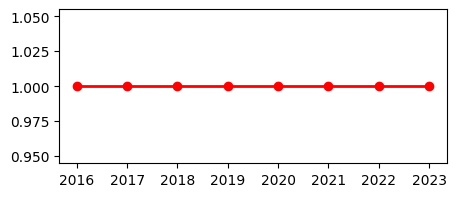

In [22]:
for r in tqdm(todo_res_gid):
    res_dates = os.listdir(f'/scratch/user/anshulya/hls/results/hls_classified/{r}')
    years = list(count_years(res_dates).keys())
    values = list(count_years(res_dates).values())

    plt.figure(figsize=(5,2))
    plt.plot(years, values, marker='o', linestyle='-', linewidth=2, color='r')
    tiles = todo_res_list[r]
    for t in tiles:
        tile_dates = os.listdir(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters')
        years = list(count_years(tile_dates).keys())
        values = list(count_years(tile_dates).values())
        plt.plot(years, values, marker='o', linestyle='-', linewidth=2, color='b')
    plt.title(r)
    plt.show()

In [66]:
for gid in todo_res_gid:
    directory_path = f'/scratch/user/anshulya/hls/results/hls_classified/{gid}'
    if not os.path.exists(directory_path):
        print('Yes')

Yes
Yes
Yes
Yes
Yes
Yes
Yes
Yes
Yes
Yes
Yes
Yes
Yes
Yes


In [18]:
todo_res_gid = [1795, 1854, 1863, 1825, 1797, 1802, 1871, 1787, 1788, 1816, 1799, 1838, 1801, 1877, 1839, 1873, 1897, 1872, 1807, 1793, 1882, 1817, 1851, 1819, 1837, 1840, 1785, 1815, 1858, 1830, 1832, 1820, 1805]

In [22]:
# for gid in tqdm(todo_res_gid):
#     directory_path = f'/scratch/user/anshulya/hls/results/hls_classified/{gid}'
#     print([x for x in os.listdir(directory_path) if '.zip' in x])

In [19]:
for gid in tqdm(todo_res_gid):
    directory_path = f'/scratch/user/anshulya/hls/results/hls_classified/{gid}'  # Change this to your actual path
    
    # A dictionary to hold files grouped by year
    files_by_year = defaultdict(list)
    
    # Iterate through files and group them by year
    for file_name in os.listdir(directory_path):
        if file_name.isdigit() and len(file_name) == 7:  # Check if it's a valid '%Y%j' string
            year = file_name[:4]  # Extract year part
            files_by_year[year].append(file_name)
    
    # Create zip files for each year and then delete the unzipped files or directories
    for year, files in files_by_year.items():
        zip_filename = f'{directory_path}/{year}.zip'
        
        # Create the zip file
        with zipfile.ZipFile(zip_filename, 'w') as zipf:
            for file_name in files:
                file_path = os.path.join(directory_path, file_name)
                if os.path.isfile(file_path):
                    zipf.write(file_path, file_name)  # Add file to the zip
                elif os.path.isdir(file_path):
                    # Zip the entire directory
                    for foldername, subfolders, filenames in os.walk(file_path):
                        for filename in filenames:
                            file_to_write = os.path.join(foldername, filename)
                            arcname = os.path.relpath(file_to_write, directory_path)
                            zipf.write(file_to_write, arcname)
        
        print(f"Created {zip_filename} with {len(files)} items.")
    
        # Delete the original files or directories after zipping
        for file_name in files:
            file_path = os.path.join(directory_path, file_name)
            try:
                if os.path.isfile(file_path):
                    os.remove(file_path)  # Delete file
                    # print(f"Deleted file {file_name}.")
                elif os.path.isdir(file_path):
                    shutil.rmtree(file_path)  # Delete directory and its contents
                    # print(f"Deleted directory {file_name}.")
            except OSError as e:
                print(f"Error deleting {file_name}: {e}")

  0%|          | 0/33 [00:00<?, ?it/s]

Created /scratch/user/anshulya/hls/results/hls_classified/1795/2018.zip with 49 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1795/2022.zip with 65 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1795/2021.zip with 46 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1795/2019.zip with 44 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1795/2023.zip with 49 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1795/2016.zip with 20 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1795/2017.zip with 27 items.


  3%|▎         | 1/33 [00:51<27:17, 51.18s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1795/2020.zip with 36 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1854/2023.zip with 77 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1854/2021.zip with 73 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1854/2022.zip with 77 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1854/2020.zip with 62 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1854/2017.zip with 41 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1854/2018.zip with 64 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1854/2016.zip with 31 items.


  6%|▌         | 2/33 [02:05<33:35, 65.02s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1854/2019.zip with 73 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1863/2023.zip with 138 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1863/2018.zip with 118 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1863/2021.zip with 127 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1863/2022.zip with 147 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1863/2020.zip with 116 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1863/2019.zip with 120 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1863/2016.zip with 59 items.


  9%|▉         | 3/33 [03:58<43:27, 86.91s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1863/2017.zip with 67 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1825/2018.zip with 45 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1825/2022.zip with 65 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1825/2021.zip with 46 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1825/2019.zip with 43 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1825/2023.zip with 52 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1825/2016.zip with 22 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1825/2017.zip with 26 items.


 12%|█▏        | 4/33 [04:36<32:36, 67.47s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1825/2020.zip with 33 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1797/2021.zip with 90 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1797/2022.zip with 121 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1797/2023.zip with 113 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1797/2017.zip with 55 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1797/2020.zip with 83 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1797/2016.zip with 48 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1797/2018.zip with 84 items.


 15%|█▌        | 5/33 [05:57<33:47, 72.42s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1797/2019.zip with 91 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1802/2018.zip with 100 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1802/2021.zip with 104 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1802/2022.zip with 112 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1802/2020.zip with 91 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1802/2023.zip with 102 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1802/2019.zip with 100 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1802/2016.zip with 37 items.


 18%|█▊        | 6/33 [07:18<33:52, 75.27s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1802/2017.zip with 52 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1871/2023.zip with 131 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1871/2018.zip with 118 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1871/2021.zip with 127 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1871/2022.zip with 140 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1871/2020.zip with 108 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1871/2019.zip with 119 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1871/2016.zip with 55 items.


 21%|██        | 7/33 [08:53<35:24, 81.72s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1871/2017.zip with 68 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1787/2023.zip with 139 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1787/2021.zip with 123 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1787/2022.zip with 143 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1787/2017.zip with 56 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1787/2020.zip with 120 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1787/2016.zip with 44 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1787/2018.zip with 113 items.


 24%|██▍       | 8/33 [10:22<35:01, 84.05s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1787/2019.zip with 115 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1788/2021.zip with 61 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1788/2022.zip with 68 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1788/2023.zip with 64 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1788/2020.zip with 59 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1788/2018.zip with 59 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1788/2019.zip with 62 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1788/2016.zip with 29 items.


 27%|██▋       | 9/33 [11:08<28:54, 72.29s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1788/2017.zip with 37 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1816/2018.zip with 73 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1816/2021.zip with 74 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1816/2023.zip with 79 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1816/2022.zip with 89 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1816/2019.zip with 70 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1816/2016.zip with 38 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1816/2020.zip with 65 items.


 30%|███       | 10/33 [12:05<25:52, 67.49s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1816/2017.zip with 49 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1799/2021.zip with 60 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1799/2022.zip with 63 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1799/2023.zip with 60 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1799/2020.zip with 59 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1799/2018.zip with 59 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1799/2019.zip with 61 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1799/2016.zip with 28 items.


 33%|███▎      | 11/33 [12:49<22:07, 60.33s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1799/2017.zip with 36 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1838/2018.zip with 96 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1838/2021.zip with 101 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1838/2022.zip with 114 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1838/2023.zip with 101 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1838/2019.zip with 91 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1838/2020.zip with 83 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1838/2016.zip with 44 items.


 36%|███▋      | 12/33 [14:04<22:39, 64.76s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1838/2017.zip with 53 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1801/2018.zip with 108 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1801/2021.zip with 114 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1801/2022.zip with 133 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1801/2020.zip with 104 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1801/2023.zip with 125 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1801/2019.zip with 114 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1801/2016.zip with 54 items.


 39%|███▉      | 13/33 [15:33<24:02, 72.10s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1801/2017.zip with 65 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1877/2023.zip with 111 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1877/2018.zip with 104 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1877/2021.zip with 113 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1877/2022.zip with 120 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1877/2020.zip with 92 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1877/2016.zip with 38 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1877/2019.zip with 103 items.


 42%|████▏     | 14/33 [16:55<23:44, 74.99s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1877/2017.zip with 54 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1839/2018.zip with 97 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1839/2021.zip with 99 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1839/2022.zip with 114 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1839/2023.zip with 102 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1839/2019.zip with 89 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1839/2020.zip with 85 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1839/2016.zip with 42 items.


 45%|████▌     | 15/33 [18:10<22:33, 75.18s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1839/2017.zip with 54 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1873/2023.zip with 131 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1873/2018.zip with 116 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1873/2021.zip with 127 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1873/2022.zip with 142 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1873/2020.zip with 107 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1873/2016.zip with 55 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1873/2019.zip with 119 items.


 48%|████▊     | 16/33 [19:58<24:01, 84.81s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1873/2017.zip with 69 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1897/2018.zip with 53 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1897/2022.zip with 75 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1897/2020.zip with 44 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1897/2021.zip with 54 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1897/2019.zip with 51 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1897/2016.zip with 27 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1897/2017.zip with 31 items.


 52%|█████▏    | 17/33 [20:44<19:31, 73.23s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1897/2023.zip with 59 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1872/2018.zip with 62 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1872/2022.zip with 91 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1872/2021.zip with 63 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1872/2023.zip with 75 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1872/2017.zip with 42 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1872/2019.zip with 56 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1872/2020.zip with 48 items.


 55%|█████▍    | 18/33 [21:41<17:06, 68.45s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1872/2016.zip with 36 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1807/2023.zip with 106 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1807/2018.zip with 102 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1807/2021.zip with 105 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1807/2022.zip with 112 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1807/2020.zip with 97 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1807/2019.zip with 103 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1807/2016.zip with 38 items.


 58%|█████▊    | 19/33 [22:59<16:35, 71.14s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1807/2017.zip with 53 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1793/2018.zip with 96 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1793/2021.zip with 94 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1793/2023.zip with 94 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1793/2022.zip with 107 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1793/2019.zip with 89 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1793/2020.zip with 83 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1793/2016.zip with 38 items.


 61%|██████    | 20/33 [24:08<15:16, 70.51s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1793/2017.zip with 56 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1882/2023.zip with 66 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1882/2021.zip with 65 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1882/2022.zip with 68 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1882/2016.zip with 29 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1882/2020.zip with 52 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1882/2018.zip with 58 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1882/2019.zip with 58 items.


 64%|██████▎   | 21/33 [24:54<12:37, 63.14s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1882/2017.zip with 39 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1817/2023.zip with 62 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1817/2021.zip with 61 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1817/2022.zip with 71 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1817/2020.zip with 60 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1817/2018.zip with 64 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1817/2016.zip with 31 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1817/2019.zip with 61 items.


 67%|██████▋   | 22/33 [25:40<10:39, 58.09s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1817/2017.zip with 36 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1851/2018.zip with 51 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1851/2022.zip with 68 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1851/2021.zip with 53 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1851/2019.zip with 46 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1851/2023.zip with 54 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1851/2016.zip with 24 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1851/2017.zip with 26 items.


 70%|██████▉   | 23/33 [26:25<09:02, 54.24s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1851/2020.zip with 40 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1819/2018.zip with 51 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1819/2022.zip with 68 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1819/2021.zip with 50 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1819/2019.zip with 47 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1819/2023.zip with 52 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1819/2016.zip with 22 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1819/2017.zip with 30 items.


 73%|███████▎  | 24/33 [27:02<07:20, 48.89s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1819/2020.zip with 39 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1837/2018.zip with 99 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1837/2021.zip with 101 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1837/2022.zip with 113 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1837/2023.zip with 101 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1837/2019.zip with 90 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1837/2020.zip with 86 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1837/2016.zip with 44 items.


 76%|███████▌  | 25/33 [28:13<07:23, 55.48s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1837/2017.zip with 54 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1840/2018.zip with 98 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1840/2021.zip with 100 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1840/2022.zip with 114 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1840/2023.zip with 102 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1840/2019.zip with 90 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1840/2020.zip with 86 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1840/2016.zip with 43 items.


 79%|███████▉  | 26/33 [29:22<06:58, 59.78s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1840/2017.zip with 54 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1785/2021.zip with 72 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1785/2022.zip with 94 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1785/2023.zip with 92 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1785/2017.zip with 35 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1785/2020.zip with 71 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1785/2016.zip with 29 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1785/2018.zip with 67 items.


 82%|████████▏ | 27/33 [30:15<05:46, 57.72s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1785/2019.zip with 67 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1815/2023.zip with 127 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1815/2018.zip with 116 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1815/2021.zip with 116 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1815/2022.zip with 141 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1815/2020.zip with 111 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1815/2019.zip with 116 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1815/2016.zip with 57 items.


 85%|████████▍ | 28/33 [31:41<05:30, 66.13s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1815/2017.zip with 67 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1858/2018.zip with 47 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1858/2022.zip with 69 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1858/2021.zip with 50 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1858/2019.zip with 44 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1858/2016.zip with 22 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1858/2017.zip with 30 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1858/2023.zip with 51 items.


 88%|████████▊ | 29/33 [32:18<03:49, 57.47s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1858/2020.zip with 37 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1830/2018.zip with 47 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1830/2022.zip with 66 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1830/2021.zip with 46 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1830/2019.zip with 42 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1830/2016.zip with 21 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1830/2017.zip with 27 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1830/2023.zip with 51 items.


 91%|█████████ | 30/33 [32:53<02:32, 50.78s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1830/2020.zip with 34 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1832/2018.zip with 47 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1832/2022.zip with 67 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1832/2021.zip with 47 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1832/2019.zip with 43 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1832/2023.zip with 51 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1832/2016.zip with 21 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1832/2017.zip with 25 items.


 94%|█████████▍| 31/33 [33:27<01:31, 45.57s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1832/2020.zip with 34 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1820/2018.zip with 51 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1820/2022.zip with 66 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1820/2021.zip with 51 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1820/2019.zip with 46 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1820/2023.zip with 53 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1820/2016.zip with 22 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1820/2017.zip with 30 items.


 97%|█████████▋| 32/33 [34:03<00:42, 42.85s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1820/2020.zip with 38 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1805/2018.zip with 50 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1805/2022.zip with 65 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1805/2021.zip with 49 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1805/2019.zip with 42 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1805/2016.zip with 19 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1805/2017.zip with 28 items.
Created /scratch/user/anshulya/hls/results/hls_classified/1805/2023.zip with 49 items.


100%|██████████| 33/33 [34:36<00:00, 62.93s/it]

Created /scratch/user/anshulya/hls/results/hls_classified/1805/2020.zip with 37 items.


  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:05<00:00,  1.51it/s]


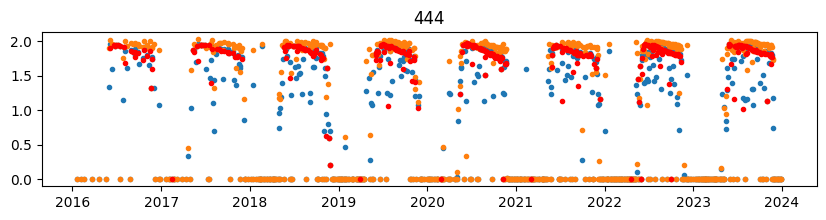

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:04<00:00,  1.82it/s]


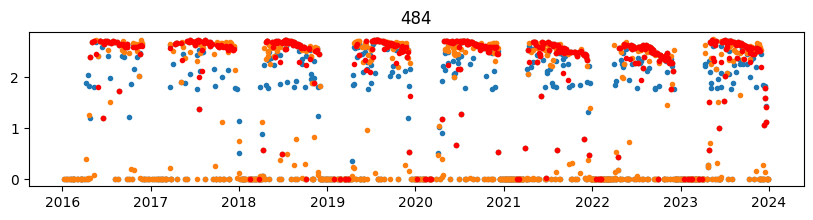

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  3.17it/s]


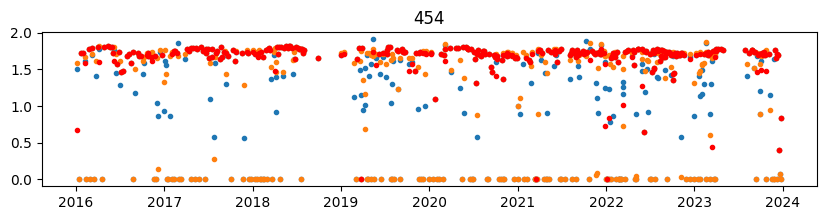

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  3.89it/s]


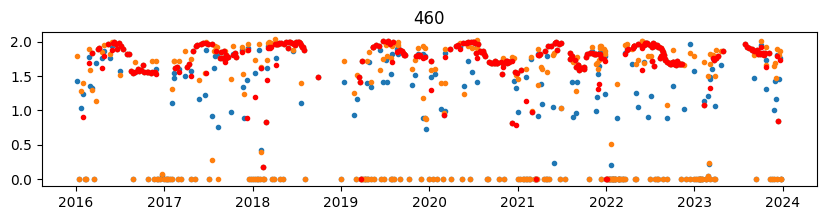

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:03<00:00,  2.42it/s]


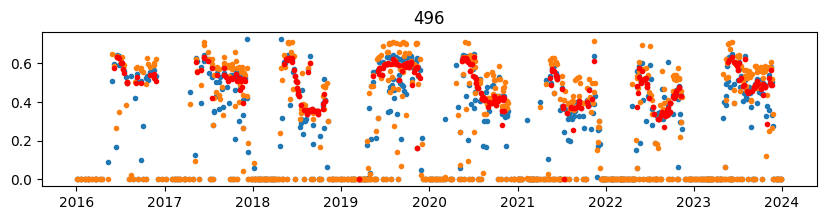

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:03<00:00,  2.33it/s]


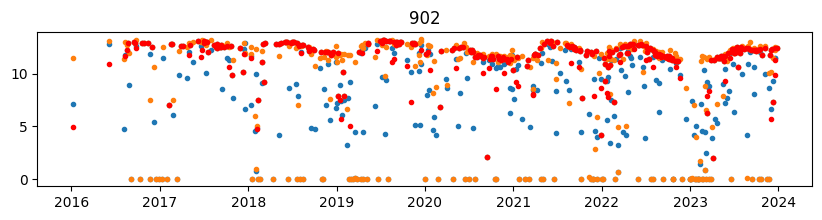

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  2.78it/s]


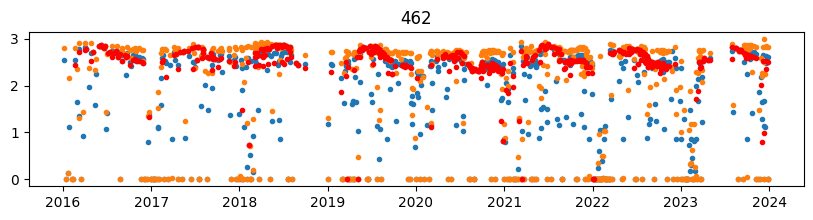

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:03<00:00,  2.65it/s]


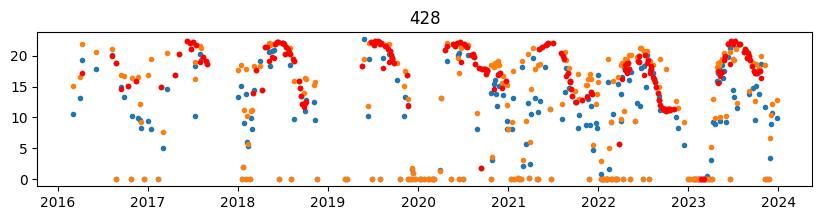

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  3.04it/s]


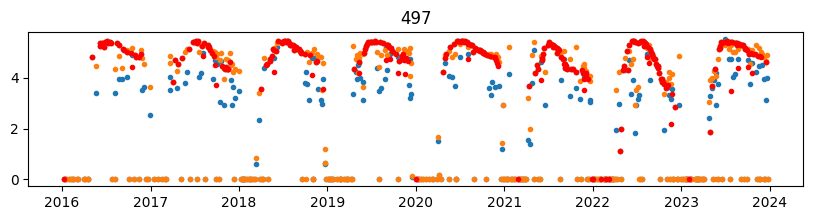

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  2.67it/s]


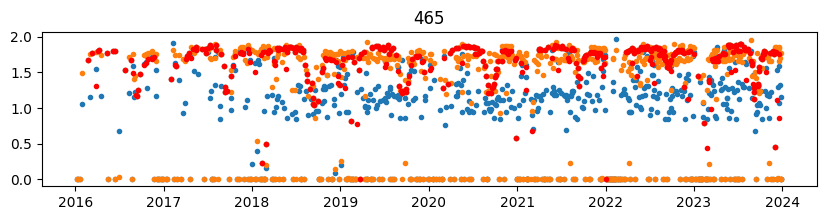

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  3.88it/s]


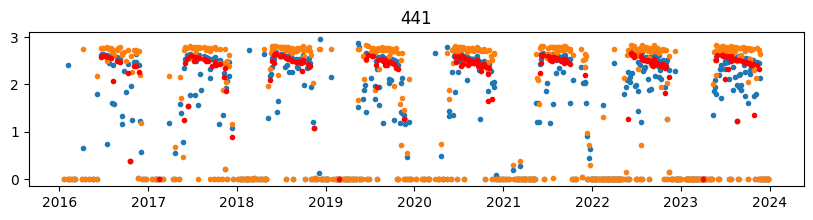

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  3.11it/s]


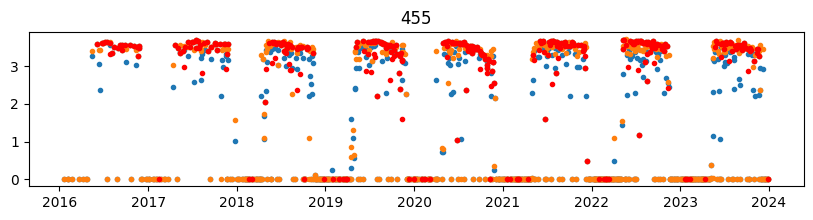

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  3.13it/s]


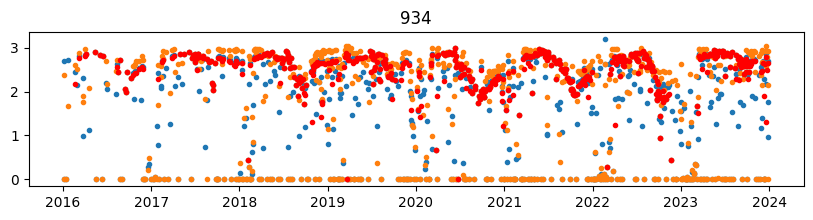

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:01<00:00,  4.76it/s]


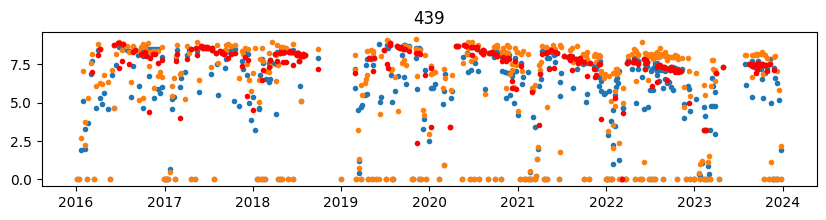

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:01<00:00,  5.71it/s]


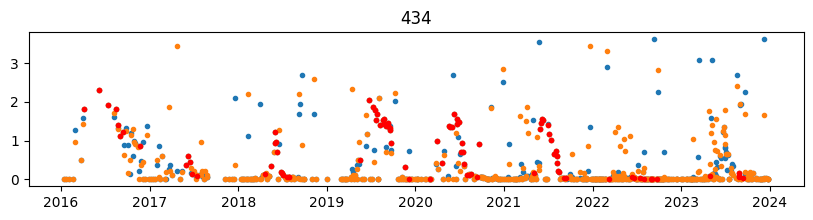

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:01<00:00,  4.12it/s]


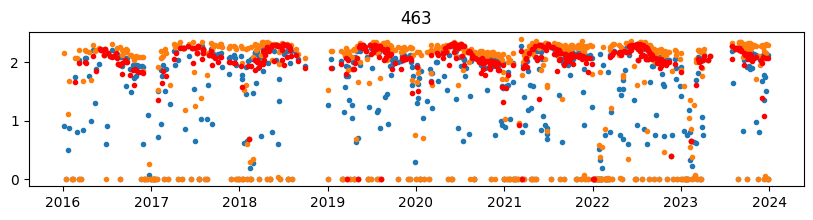

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  3.24it/s]


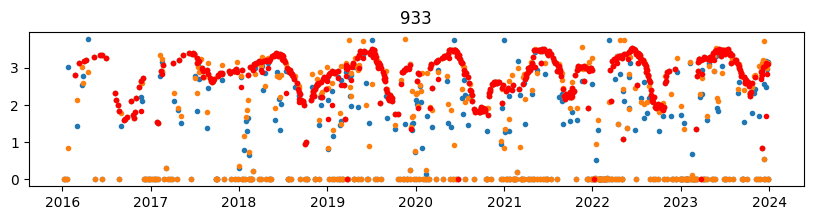

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:02<00:00,  3.21it/s]


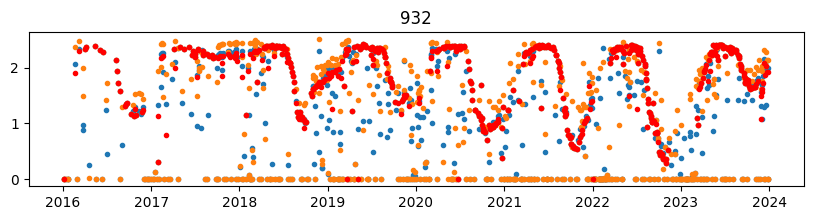

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:01<00:00,  6.83it/s]


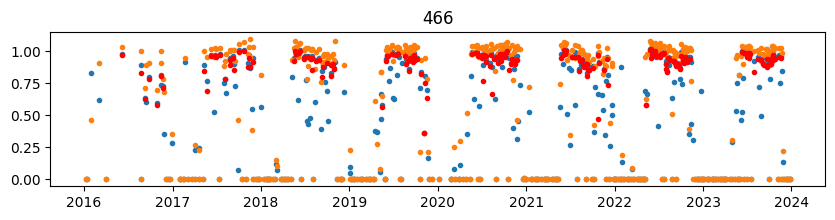

  0%|          | 0/8 [00:00<?, ?it/s]/tmp/job.1443354/ipykernel_1231048/3656515031.py:68: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df = pd.concat([df, pd.DataFrame([date_dict])])
100%|██████████| 8/8 [00:01<00:00,  4.14it/s]


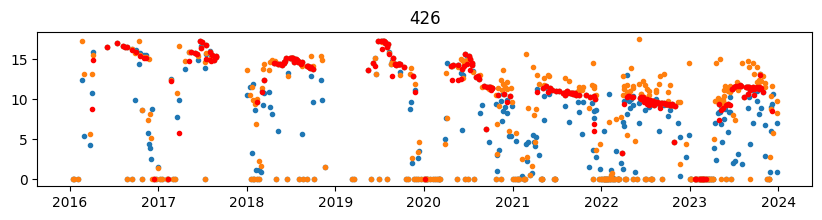

In [24]:
for res in todo_res_gid:

    columns = ['date', 'raw_area', 'enh1_area', 'enh2_area', 'cloud_cover', 'ice_cover']
    df = pd.DataFrame(columns=columns)
    
    for y in tqdm(range(2016,2024)):
        zip_file_path = f'/scratch/user/anshulya/hls/results/hls_classified/{res}/{y}.zip'

        # Open the zip file using 'zipfile.ZipFile'
        with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
            # List all files in the zip archive
            file_names = zip_ref.namelist()
            # print("Files in the zip archive:", y, len(file_names)/3)

            dates = list(dict.fromkeys([f.split('/')[0] for f in file_names])) # removing duplicate filenames

            for d in dates:
                date_dict = {'date':d}
                with zip_ref.open(f'{d}/terrain.npz') as file:
                    terr = np.load(io.BytesIO(file.read()))
                    data = terr['data']
                    indices = terr['indices']
                    indptr = terr['indptr']
                    shape = terr['shape']
                    sparse_matrix = csr_matrix((data, indices, indptr), shape=shape)
                    dense_matrix = sparse_matrix.toarray()
                    
                    ta = dense_matrix[(dense_matrix==1)].shape[0]*900/10**6
                    cca = dense_matrix[(dense_matrix==2)].shape[0]*900/10**6
                    ica = dense_matrix[(dense_matrix==3)].shape[0]*900/10**6
                    
                with zip_ref.open(f'{d}/enh1.npz') as file:
                    terr = np.load(io.BytesIO(file.read()))
                    data = terr['data']
                    indices = terr['indices']
                    indptr = terr['indptr']
                    shape = terr['shape']
                    sparse_matrix = csr_matrix((data, indices, indptr), shape=shape)
                    dense_matrix = sparse_matrix.toarray()
                    
                    enh1 = dense_matrix[(dense_matrix==1)].shape[0]*900/10**6

                with zip_ref.open(f'{d}/enh2.npz') as file:
                    terr = np.load(io.BytesIO(file.read()))
                    data = terr['data']
                    indices = terr['indices']
                    indptr = terr['indptr']
                    shape = terr['shape']
                    sparse_matrix = csr_matrix((data, indices, indptr), shape=shape)
                    dense_matrix = sparse_matrix.toarray()
                    
                    enh2 = dense_matrix[(dense_matrix==1)].shape[0]*900/10**6
                    
                date_dict['raw_area'] = ta
                date_dict['enh1_area'] = enh1
                date_dict['enh2_area'] = enh2
                
                if ta + cca == 0:
                    date_dict['cloud_cover'] = 0
                else:
                    date_dict['cloud_cover'] = cca/(ta + cca)
                    
                if ta + ica == 0:
                    date_dict['ice_cover'] = 0
                else:
                    date_dict['ice_cover'] = ica/(ta + ica)

                df = pd.concat([df, pd.DataFrame([date_dict])])
    df['datetime'] = pd.to_datetime(df['date'], format='%Y%j')
    df_ = df[df['cloud_cover']<0.2]
    plt.figure(figsize=(10,2))
    plt.plot(df['datetime'],df['enh1_area'],'.')
    plt.plot(df['datetime'],df['enh2_area'],'.')
    plt.plot(df_['datetime'],df_['raw_area'],'r.')
    plt.title(res)
    plt.show()
    df.to_csv(f'/scratch/user/anshulya/hls/results/new/{res}.csv')

In [49]:
max_date_df

,res_gid,l30_date,s30_date
0,1777,2023087,2023087
1,1822,2023087,2021254
2,1756,2023087,2023087
3,7318,2023087,2023087
4,1884,2018322,2018322
5,1885,2018322,2018322
6,1886,2018322,2018322
7,1783,2018322,2018322
8,1892,2018322,2018322
9,1894,2018322,2018322


In [54]:
for res_gid in todo_res_gid:
    if not os.path.exists(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/L30/B05_clipped_raster.tif'):
        print(f'Landsat not available for: {res_gid}')
    if not os.path.exists(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/S30/B05_clipped_raster.tif'):
        print(f'Sentinel not available for: {res_gid}')

Landsat not available for: 1853
Sentinel not available for: 1853
Landsat not available for: 1857
Sentinel not available for: 1857
Landsat not available for: 1866
Sentinel not available for: 1866
Landsat not available for: 1826
Sentinel not available for: 1826
Landsat not available for: 1842
Sentinel not available for: 1842
Landsat not available for: 1844
Sentinel not available for: 1844
Landsat not available for: 1852
Sentinel not available for: 1852
Landsat not available for: 1776
Sentinel not available for: 1776
Landsat not available for: 1804
Sentinel not available for: 1804
Landsat not available for: 1879
Sentinel not available for: 1879
Landsat not available for: 1890
Sentinel not available for: 1890


In [57]:
print(todo_)

[1777, 1822, 1756, 7318, 1884, 1885, 1886, 1783, 1892, 1894, 1898, 1781, 1861, 1821, 1853, 1857, 1866, 1826, 1842, 1844, 1852, 1776, 1804, 1879, 1890]


In [55]:
len(todo_res_gid)

25

In [56]:
todo_ = []
for res in todo_res_gid:
    if not os.path.exists(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}'):
        todo_.append(res)

In [58]:
# for res_gid in todo_res_list.keys():
for res_gid in todo_:
# for res_gid in [829]:
    s30_date = max_date_df.loc[max_date_df['res_gid']==res_gid,'s30_date'].values[0]
    l30_date = max_date_df.loc[max_date_df['res_gid']==res_gid,'l30_date'].values[0]
    
    tiles = todo_res_list[res_gid]
    print(res_gid, tiles)
    
    s30_rasters_to_merge = []
    l30_rasters_to_merge = []
    
    for t in tiles:
        s30_rasters_to_merge.append(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{s30_date}/S30')
        l30_rasters_to_merge.append(f'/scratch/user/anshulya/hls/data/cluster/{t}/unmerged_rasters/{l30_date}/L30')

    print(len(s30_rasters_to_merge),len(l30_rasters_to_merge))
    
    # Define bands to be downloaded
    l30_bands = ['B01', 'B03', 'B05', 'B06', 'B04', 'Fmask', 'B07',
            'B10', 'B02', 'B11','SAA','SZA']
    s30_bands = ['B10', 'B07', 'B09', 'B04', 'B03', 'B11', 'B06',
            'B12','B02', 'B8A', 'B08', 'B01', 'Fmask','B05','SAA','SZA']

    save_path = f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}'
    res = grand.loc[grand['GRAND_ID']==res_gid]
    res.geometry = res.geometry.buffer(0.01)
    
    #L30 merge
    for dirpath in l30_rasters_to_merge:
        reproject_unmerged_rasters(dirpath)
    print('Merging rasters ... ')
    merge_max_rasters(res_gid, l30_bands, l30_rasters_to_merge, save_path, 'L30')

    print('Clipping rasters ... ')
    for f in tqdm(os.listdir(f'{save_path}/L30/')):
        ras = rio.open(f'{save_path}/L30/{f}')
        cr_name = f.split('_')[0] + '_clipped_raster.tif'
        clip_raster(ras, res, f'{save_path}/L30/{cr_name}' )
        ras.close()
        os.remove(f'{save_path}/L30/{f}')
    print('----------------------')

    #S30 merge
    for dirpath in s30_rasters_to_merge:
        reproject_unmerged_rasters(dirpath)
    print('Merging rasters ... ')
    merge_max_rasters(res_gid, s30_bands, s30_rasters_to_merge, save_path, 'S30')

    print('Clipping rasters ... ')
    for f in tqdm(os.listdir(f'{save_path}/S30/')):
        ras = rio.open(f'{save_path}/S30/{f}')
        cr_name = f.split('_')[0] + '_clipped_raster.tif'
        clip_raster(ras, res, f'{save_path}/S30/{cr_name}' )
        ras.close()
        os.remove(f'{save_path}/S30/{f}')
    print('----------------------')
    

1777 ['16SFE', '16SFF']
2 2


/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


start of reprojections


100%|██████████| 12/12 [00:27<00:00,  2.28s/it]


start of reprojections


100%|██████████| 12/12 [00:19<00:00,  1.60s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:09<00:00,  1.31it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:02<00:00, 10.28it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:25<00:00,  1.57s/it]


start of reprojections


100%|██████████| 16/16 [00:26<00:00,  1.65s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:07<00:00,  2.04it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:02<00:00, 12.19it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1822 ['16SFE', '16SGE']
2 2
start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.65it/s]


start of reprojections


100%|██████████| 12/12 [00:19<00:00,  1.59s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:05<00:00,  2.15it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:03<00:00,  7.97it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:25<00:00,  1.57s/it]


start of reprojections


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:07<00:00,  2.00it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:03<00:00,  8.35it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1756 ['16SFF']
1 1
start of reprojections


100%|██████████| 12/12 [00:06<00:00,  1.81it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:08<00:00,  1.43it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:02<00:00,  9.97it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:08<00:00,  1.95it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:02<00:00,  5.86it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:03<00:00, 10.01it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
7318 ['16SFF']
1 1
start of reprojections


100%|██████████| 12/12 [00:03<00:00,  3.28it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:02<00:00,  5.57it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:01<00:00, 15.92it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:03<00:00,  5.32it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:02<00:00, 15.64it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1884 ['16SGC', '17SKS', '17SKT']
3 3
start of reprojections


100%|██████████| 12/12 [00:18<00:00,  1.57s/it]


start of reprojections


100%|██████████| 12/12 [00:18<00:00,  1.55s/it]


start of reprojections


100%|██████████| 12/12 [00:18<00:00,  1.54s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:09<00:00,  1.29it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:01<00:00, 21.68it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:26<00:00,  1.63s/it]


start of reprojections


100%|██████████| 16/16 [00:25<00:00,  1.60s/it]


start of reprojections


100%|██████████| 16/16 [00:30<00:00,  1.90s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:11<00:00,  1.34it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:01<00:00, 23.19it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1885 ['16SGC']
1 1
start of reprojections


100%|██████████| 12/12 [00:05<00:00,  2.15it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:02<00:00,  5.57it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:00<00:00, 27.28it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:05<00:00,  2.76it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:03<00:00,  5.22it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:01<00:00, 22.91it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1886 ['16SGC', '17SKS', '17SKT']
3 3
start of reprojections


100%|██████████| 12/12 [00:03<00:00,  3.02it/s]


start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.81it/s]


start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.75it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:08<00:00,  1.41it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:01<00:00, 20.56it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:06<00:00,  2.57it/s]


start of reprojections


100%|██████████| 16/16 [00:06<00:00,  2.60it/s]


start of reprojections


100%|██████████| 16/16 [00:05<00:00,  2.79it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:11<00:00,  1.37it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:01<00:00, 18.90it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1783 ['16SGE', '17SKV']
2 2
start of reprojections


100%|██████████| 12/12 [00:18<00:00,  1.58s/it]


start of reprojections


100%|██████████| 12/12 [00:18<00:00,  1.53s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:05<00:00,  2.23it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:01<00:00, 16.11it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:27<00:00,  1.74s/it]


start of reprojections


100%|██████████| 16/16 [00:25<00:00,  1.60s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:07<00:00,  2.07it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:02<00:00, 14.30it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1892 ['17SKS']
1 1
start of reprojections


100%|██████████| 12/12 [00:05<00:00,  2.32it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:02<00:00,  5.30it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:01<00:00, 22.44it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:06<00:00,  2.44it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:02<00:00,  5.41it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:01<00:00, 25.36it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1894 ['17SKS', '17SKT', '17SLT']
3 3
start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.56it/s]


start of reprojections


100%|██████████| 12/12 [00:11<00:00,  1.04it/s]


start of reprojections


100%|██████████| 12/12 [00:20<00:00,  1.75s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:09<00:00,  1.29it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:01<00:00, 12.99it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:14<00:00,  1.08it/s]


start of reprojections


100%|██████████| 16/16 [00:09<00:00,  1.65it/s]


start of reprojections


100%|██████████| 16/16 [00:24<00:00,  1.51s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:13<00:00,  1.21it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:02<00:00, 14.61it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1898 ['17SKS']
1 1
start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.46it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:02<00:00,  5.29it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:00<00:00, 25.11it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:07<00:00,  2.28it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:03<00:00,  4.82it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:01<00:00, 21.23it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1781 ['17SKV']
1 1
start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.96it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:03<00:00,  3.92it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:01<00:00, 16.20it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:06<00:00,  2.48it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:03<00:00,  4.39it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:02<00:00, 15.47it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1861 ['17SLT', '17SLU', '17SMT', '17SMU']
4 4
start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.75it/s]


start of reprojections


100%|██████████| 12/12 [00:18<00:00,  1.51s/it]


start of reprojections


100%|██████████| 12/12 [00:17<00:00,  1.43s/it]


start of reprojections


100%|██████████| 12/12 [00:17<00:00,  1.42s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:11<00:00,  1.07it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:01<00:00, 12.78it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:06<00:00,  2.40it/s]


start of reprojections


100%|██████████| 16/16 [00:25<00:00,  1.56s/it]


start of reprojections


100%|██████████| 16/16 [00:24<00:00,  1.50s/it]


start of reprojections


100%|██████████| 16/16 [00:32<00:00,  2.02s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:15<00:00,  1.05it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:02<00:00, 14.34it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1821 ['17SLU', '17SMU']
2 2
start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.52it/s]


start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.75it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:06<00:00,  1.92it/s]


Clipping rasters ... 


100%|██████████| 24/24 [00:01<00:00, 20.87it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:06<00:00,  2.57it/s]


start of reprojections


100%|██████████| 16/16 [00:06<00:00,  2.32it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:07<00:00,  2.07it/s]


Clipping rasters ... 


100%|██████████| 32/32 [00:01<00:00, 25.70it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1853 ['17SMT', '17SMU']
2 2
start of reprojections


100%|██████████| 12/12 [00:03<00:00,  3.23it/s]


start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.81it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:05<00:00,  2.33it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 35.12it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:05<00:00,  2.82it/s]


start of reprojections


100%|██████████| 16/16 [00:07<00:00,  2.14it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:15<00:00,  1.00it/s]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 33.74it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1857 ['17SMT', '17SMU']
2 2
start of reprojections


100%|██████████| 12/12 [00:03<00:00,  3.25it/s]


start of reprojections


100%|██████████| 12/12 [00:15<00:00,  1.32s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:08<00:00,  1.40it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 32.60it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:06<00:00,  2.52it/s]


start of reprojections


100%|██████████| 16/16 [01:12<00:00,  4.56s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:23<00:00,  1.45s/it]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 34.06it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1866 ['17SMT']
1 1
start of reprojections


100%|██████████| 12/12 [00:25<00:00,  2.16s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:01<00:00,  6.07it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 25.55it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:44<00:00,  2.77s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:03<00:00,  4.49it/s]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 24.43it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1826 ['17SMU']
1 1
start of reprojections


100%|██████████| 12/12 [00:04<00:00,  2.84it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:02<00:00,  5.07it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 29.59it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:29<00:00,  1.85s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:21<00:00,  1.35s/it]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 27.21it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1842 ['17SMU']
1 1
start of reprojections


100%|██████████| 12/12 [00:19<00:00,  1.62s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:05<00:00,  2.20it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 49.25it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:09<00:00,  1.68it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:02<00:00,  5.40it/s]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 49.51it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1844 ['17SMU']
1 1
start of reprojections


100%|██████████| 12/12 [00:08<00:00,  1.36it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:02<00:00,  5.03it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 44.14it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:16<00:00,  1.06s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:02<00:00,  5.37it/s]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 43.22it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1852 ['17SMU', '17SNT']
2 2
start of reprojections


100%|██████████| 12/12 [00:19<00:00,  1.67s/it]


start of reprojections


100%|██████████| 12/12 [00:43<00:00,  3.61s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:44<00:00,  3.72s/it]


Clipping rasters ... 


100%|██████████| 12/12 [00:01<00:00,  7.67it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:24<00:00,  1.52s/it]


start of reprojections


100%|██████████| 16/16 [00:25<00:00,  1.58s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:10<00:00,  1.60it/s]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 18.75it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1776 ['17SMV']
1 1
start of reprojections


100%|██████████| 12/12 [00:25<00:00,  2.11s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:02<00:00,  4.47it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 49.48it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:27<00:00,  1.70s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:08<00:00,  1.79it/s]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 48.25it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1804 ['17SMV']
1 1
start of reprojections


100%|██████████| 12/12 [00:09<00:00,  1.23it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:04<00:00,  2.81it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 29.37it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:05<00:00,  2.69it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:03<00:00,  4.91it/s]


Clipping rasters ... 


100%|██████████| 16/16 [00:01<00:00,  8.05it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1879 ['17SNT']
1 1
start of reprojections


100%|██████████| 12/12 [00:18<00:00,  1.53s/it]


Merging rasters ... 


100%|██████████| 12/12 [00:03<00:00,  3.39it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 25.41it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:24<00:00,  1.54s/it]


Merging rasters ... 


100%|██████████| 16/16 [00:05<00:00,  3.19it/s]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 29.33it/s]
/tmp/job.1508468/ipykernel_1504543/268740282.py:27: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


----------------------
1890 ['17SNT']
1 1
start of reprojections


100%|██████████| 12/12 [00:05<00:00,  2.24it/s]


Merging rasters ... 


100%|██████████| 12/12 [00:02<00:00,  5.16it/s]


Clipping rasters ... 


100%|██████████| 12/12 [00:00<00:00, 41.16it/s]


----------------------
start of reprojections


100%|██████████| 16/16 [00:05<00:00,  2.96it/s]


Merging rasters ... 


100%|██████████| 16/16 [00:09<00:00,  1.72it/s]


Clipping rasters ... 


100%|██████████| 16/16 [00:00<00:00, 44.71it/s]

----------------------


In [ ]:
max_date_df

(1005, 901) (1005, 901)


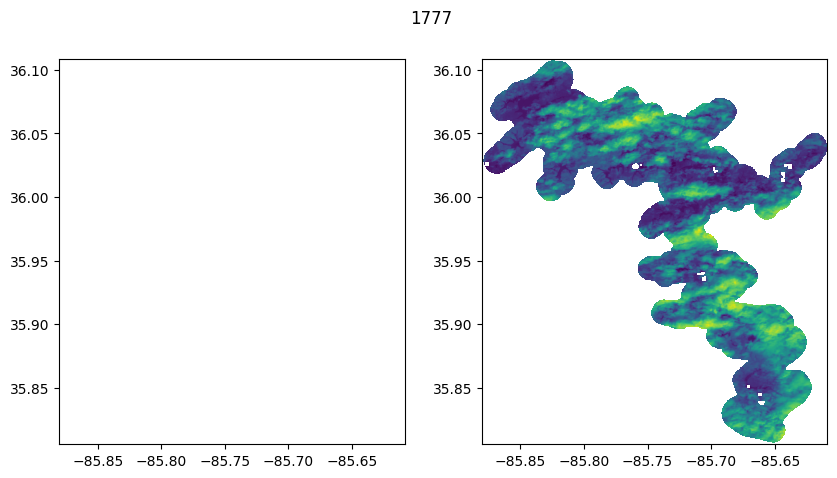

(1740, 1575) (1740, 1575)


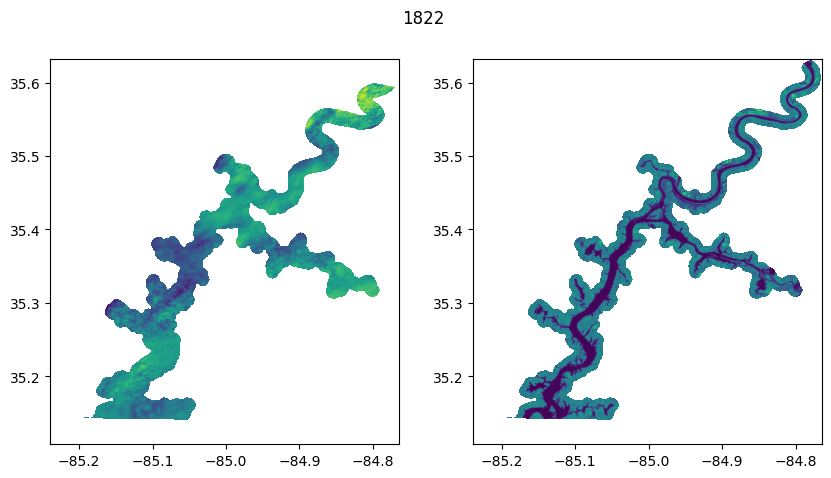

(908, 1789) (908, 1789)


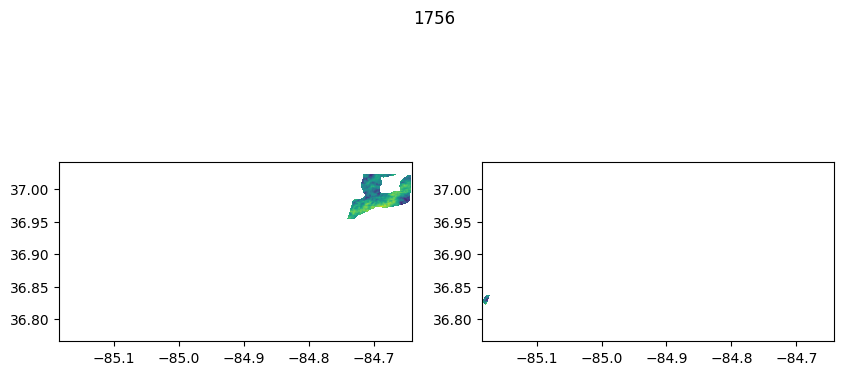

(928, 1069) (928, 1069)


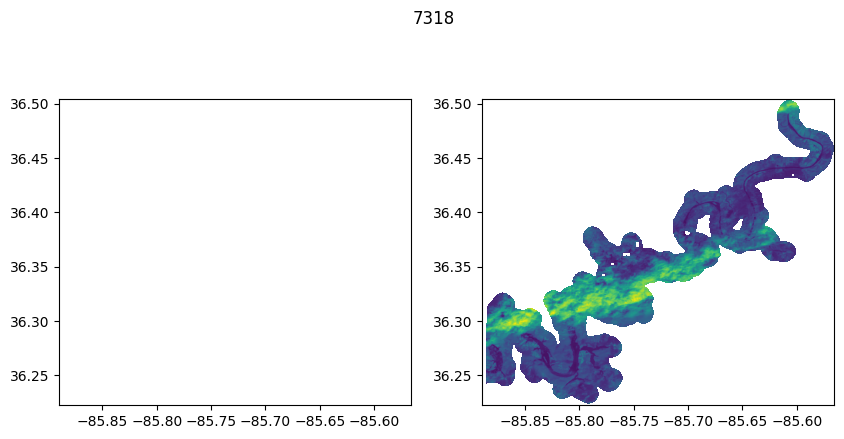

(182, 155) (182, 155)


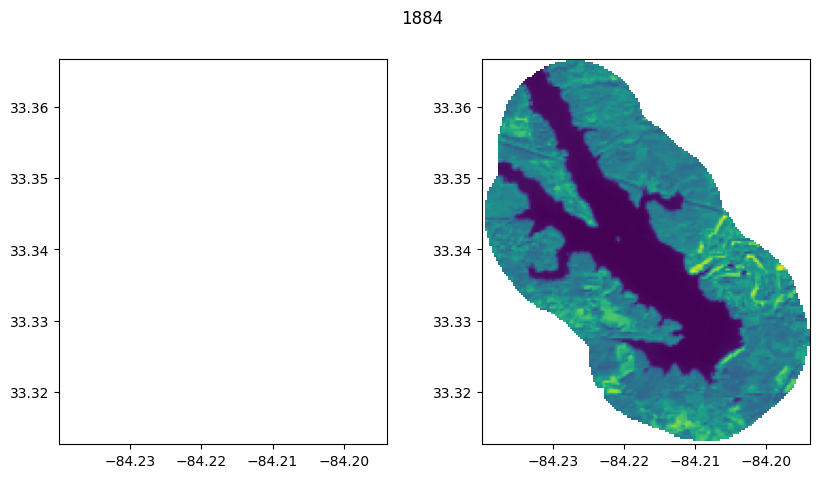

(186, 170) (186, 170)


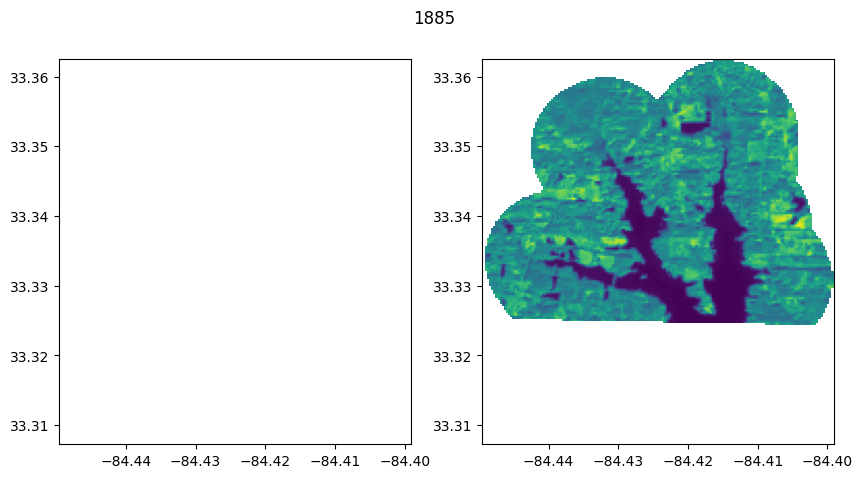

(353, 269) (353, 269)


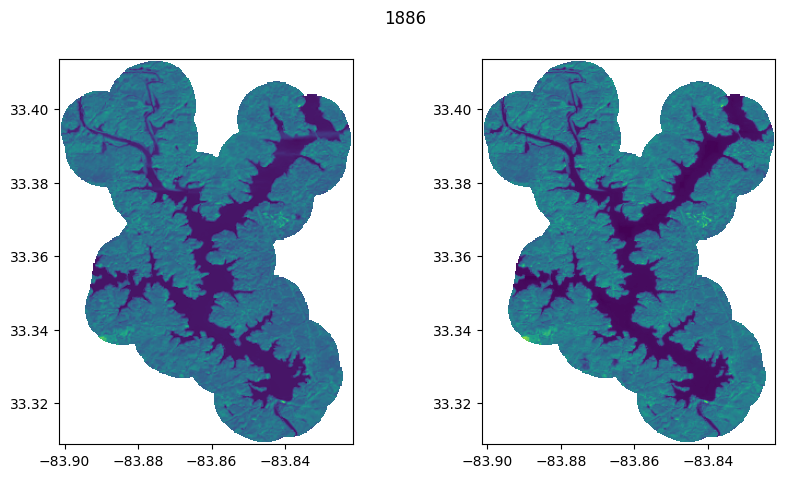

(827, 682) (827, 682)


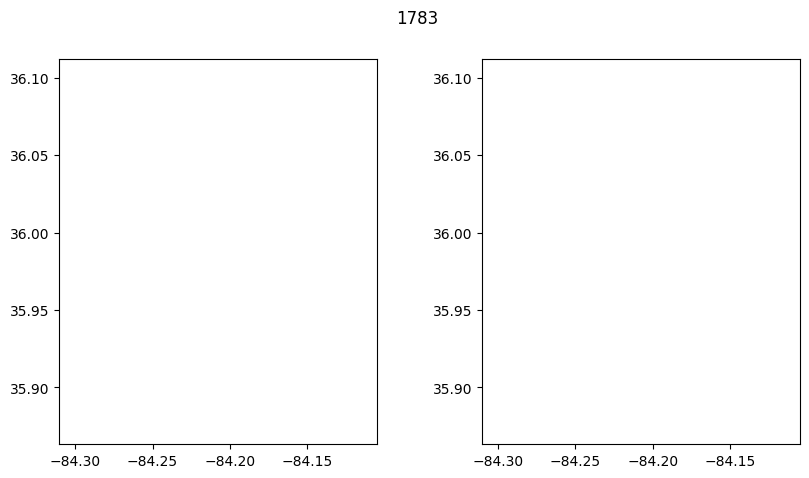

(172, 158) (172, 158)


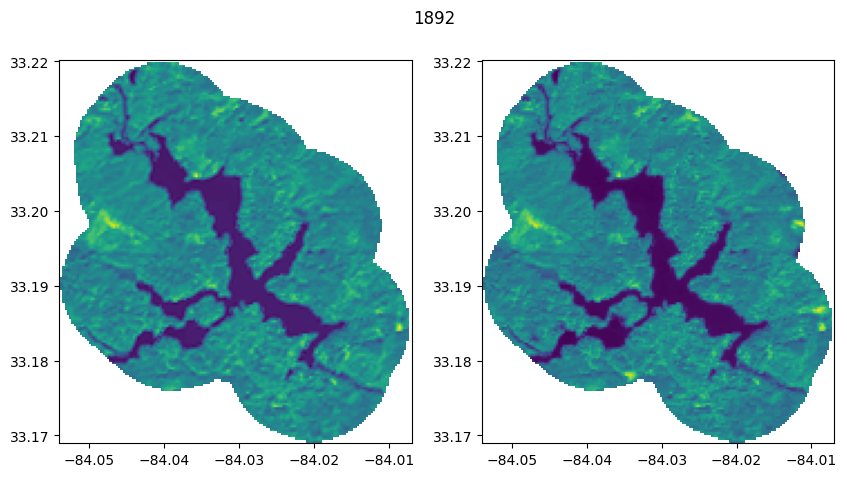

(777, 683) (777, 683)


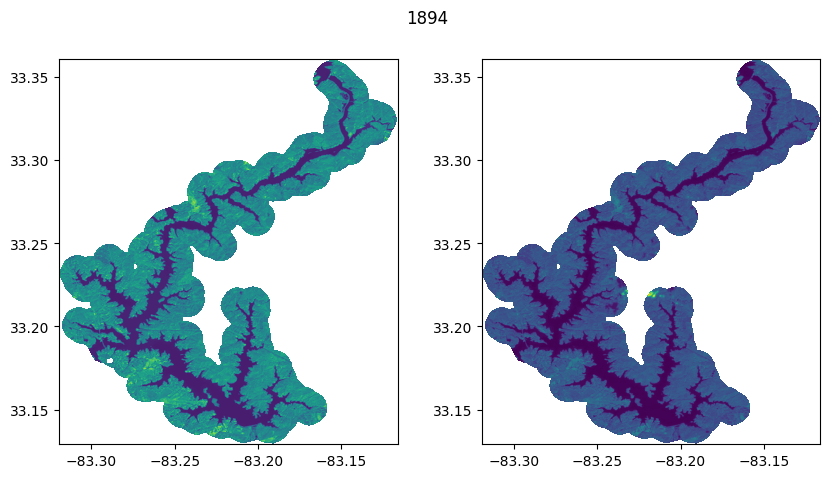

(195, 302) (195, 302)


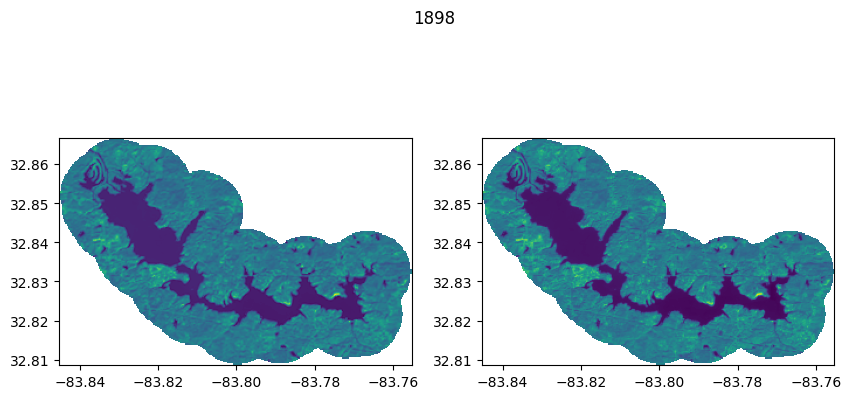

(668, 1078) (668, 1078)


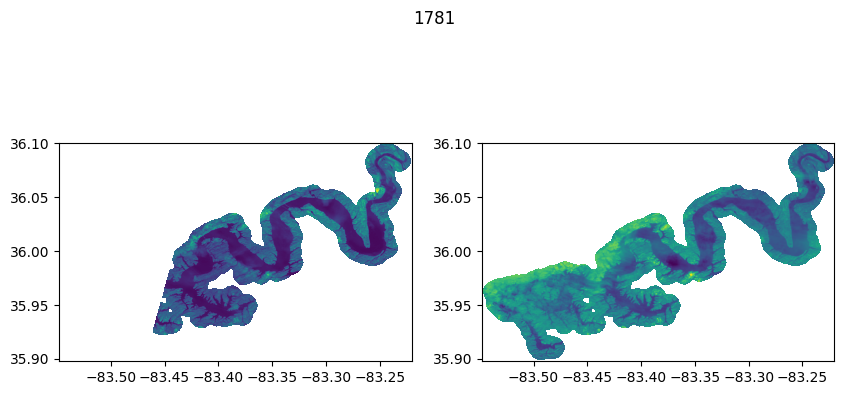

(690, 739) (690, 739)


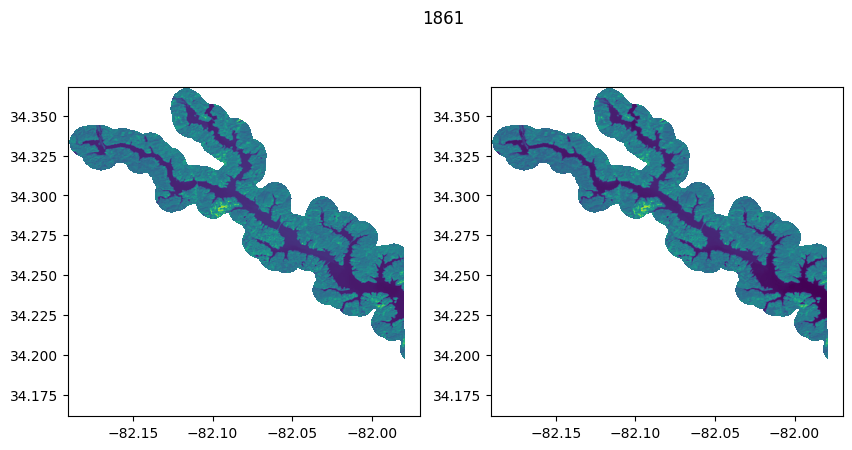

(143, 398) (143, 398)


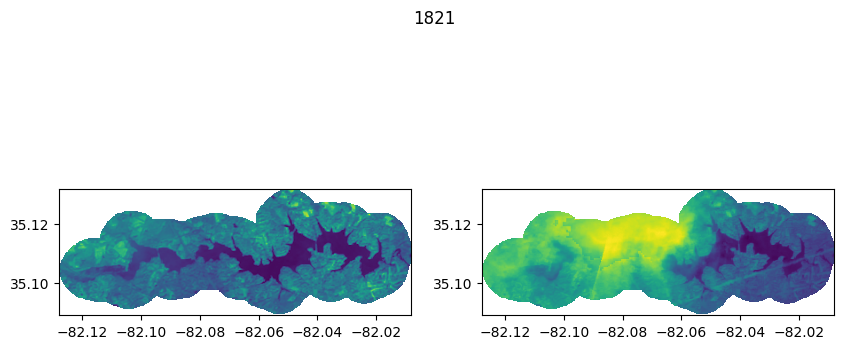

In [78]:
for res_gid in todo_res_list.keys():
    ras1 = rio.open(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/L30/B05_clipped_raster.tif')
    ras2 = rio.open(f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/S30/B8A_clipped_raster.tif')

    print(ras1.read(1).shape, ras2.read(1).shape)
    
    fig, ax = plt.subplots(1,2,figsize=(10,5))
    show(ras1, ax=ax[0])
    show(ras2, ax=ax[1])
    # grand[grand['GRAND_ID']==res_gid].plot(ax=ax[0], ec='k', fc='none')
    # grand[grand['GRAND_ID']==res_gid].plot(ax=ax[1], ec='k', fc='none')
    plt.suptitle(res_gid)
    plt.show()

## Classify Reservoirs

In [22]:
## Merge downloaded rasters
def merge_rasters(dirpaths, bands, save_path, sat):
    
    for b in tqdm(bands):
        bandpaths = []
        for dirpath in dirpaths:
            bandpaths.append([os.path.join(dirpath, bname) for bname in os.listdir(dirpath) if b in bname][0])
        # print(bandpaths)
        rasters = [rio.open(raster_path) for raster_path in bandpaths]
    
        # Merge the rasters into a single dataset
        b1_merged, b1_merged_transform = merge(rasters)
    
        # Update the metadata of the merged dataset
        b1_merged_meta = rasters[0].meta.copy()
        b1_merged_meta.update({
            'height': b1_merged.shape[1],
            'width': b1_merged.shape[2],
            'transform': b1_merged_transform
        })
        
        if not os.path.exists(os.path.join(save_path, sat)):
            os.makedirs(os.path.join(save_path, sat))
        
        # Create a new raster file to store the stitched data
        output_path = os.path.join(save_path, sat, b +'_stitched_raster.tif')
        # print(output_path)
        with rio.open(output_path, 'w', **b1_merged_meta) as dst:
            dst.write(b1_merged)
        
        # Close all the input rasters
        for raster in rasters:
            raster.close()


In [23]:
def terrain_shadow(dem, azimuth, zenith):
  # Convert azimuth and zenith angles to radians
  azimuth_rad = math.radians(azimuth)
  zenith_rad = math.radians(zenith)

  # Compute the slope and aspect
  dx, dy = np.gradient(dem)
  slope = np.arctan(np.sqrt(dx**2 + dy**2))
  aspect = np.arctan2(-dy, dx)

  # Compute the cosine of the incident angle
  cos_theta_i = np.cos(zenith_rad) * np.cos(slope) + np.sin(zenith_rad) * np.sin(slope) * np.cos(azimuth_rad - aspect)

  # Calculate the terrain shadow mask
  shadow_mask = cos_theta_i < 0

  return shadow_mask

In [24]:
def find_elbow(data):
  """
  Find the elbow point in a dataset.
  
  Parameters:
  - data: A list or numpy array of y-values.
  
  Returns:
  - index of the elbow point.
  """
  # Create a vector from the first data point to the last data point
  first_point = [0, data[0]]
  last_point = [len(data) - 1, data[-1]]
  line_vector = np.subtract(last_point, first_point)
  
  # Normalize the line vector
  line_vector_norm = line_vector / np.sqrt(sum(line_vector**2))
  
  # Find the point that is farthest from the line
  max_distance = -1
  elbow_index = 0
  for i, value in enumerate(data):
    point = [i, value]
    distance = np.abs(np.cross(line_vector_norm, np.subtract(first_point, point)))
    if distance > max_distance:
      max_distance = distance
      elbow_index = i
            
  return elbow_index

In [25]:
def half_image_correction(larger_raster_path, smaller_raster_path, padded_raster_path):
  """
  Pads the smaller raster to match the size of the larger raster.
  
  Parameters:
  - larger_raster_path: Path to the larger raster file.
  - smaller_raster_path: Path to the smaller raster file.
  - padded_raster_path: Path to save the padded raster.
  """
  
  with rio.open(larger_raster_path) as larger_raster:
    with rio.open(smaller_raster_path) as smaller_raster:
        
      # Extract pixel resolution from the raster's transform
      pixel_resolution_x = abs(smaller_raster.transform[0])
      pixel_resolution_y = abs(smaller_raster.transform[4])

      # Calculate the difference in extents
      left_diff = int((smaller_raster.bounds.left - larger_raster.bounds.left) / pixel_resolution_x)
      right_diff = int((larger_raster.bounds.right - smaller_raster.bounds.right) / pixel_resolution_x)
      top_diff = int((larger_raster.bounds.top - smaller_raster.bounds.top) / pixel_resolution_y)
      bottom_diff = int((smaller_raster.bounds.bottom - larger_raster.bounds.bottom) / pixel_resolution_y)
      
      # Read the smaller raster data
      smaller_data = smaller_raster.read(1)
      
      # Pad the smaller raster data
      padded_data = np.pad(smaller_data, ((top_diff, bottom_diff), (left_diff, right_diff)), 'constant', constant_values=-9999)
      
      # Create a new raster with the padded data and the same metadata as the larger raster
      with rio.open(padded_raster_path, 'w', **larger_raster.meta) as dst:
        dst.write(padded_data, 1)

def get_bit(number, bit_position):
  return (number >> bit_position) & 1

def matrix_get_bit(matrix, bit_position):
  matrix = matrix.astype(int)  # Ensure matrix elements are integers
  vec_get_bit = np.vectorize(get_bit)
  return vec_get_bit(matrix, bit_position)

In [26]:
def resample_jrc_raster(hls_path, jrc, filename):
  # Open the reference raster
  with rio.open(hls_path) as src:
    # Get the metadata for the reference raster
    profile = src.profile
    transform = src.transform

    # Create a new empty raster with the same shape and metadata as the reference raster
    data = np.empty(shape=(src.height, src.width), dtype=np.float32)
    new_profile = profile.copy()
    new_profile.update(dtype=data.dtype)

    # Create a transform for the new raster using the same resolution as the reference raster
    new_transform = Affine(transform.a, transform.b, transform.c,
                          transform.d, transform.e, transform.f)

    # Open the source raster to be used for updating the empty raster
    with jrc as src2:
      # Update each pixel in the new raster with the nearest neighbor value from the source raster
      rio.warp.reproject(source=rio.band(src2, 1), destination=data,
                              src_transform=src2.transform, src_crs=src2.crs,
                              dst_transform=new_transform, dst_crs=src.crs,
                              resampling=rio.warp.Resampling.nearest)

    # Write the updated raster to a new file
    with rio.open(filename, 'w', **new_profile) as dst:
      dst.write(data, 1)
      return filename

In [27]:
def classify_reservoir(res_gid, clip_path, sat):
    try:
        if sat == 'L30':
            bands = ['B01', 'B02', 'B03', 'B04', 'B05','B06','B07','B10','B11']
            clf = joblib.load(os.path.join('/scratch/user/anshulya/hls/data/models/rf_models', 'lake_rf_new_L30_ice.pkl'))
        else:
            bands = ['B01', 'B02', 'B03', 'B04', 'B05','B06','B07','B08','B8A','B09','B10', 'B11', 'B12']
            clf = joblib.load(os.path.join('/scratch/user/anshulya/hls/data/models/rf_models', 'lake_rf_new_S30_ice.pkl'))
        
        print('Processing: ',clip_path)
        
        if sat == 'S30':
            max_file_name = f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/S30/B05_clipped_raster.tif'
            max_x, max_y = rio.open(max_file_name).read(1).shape
        else:
            max_file_name = f'/scratch/user/anshulya/hls/data/max_rasters/{res_gid}/L30/B05_clipped_raster.tif'
            max_x, max_y = rio.open(max_file_name).read(1).shape
        
        ext_bands = bands + ['Fmask']  
        for b in ext_bands:
            ras = rio.open(os.path.join(clip_path,sat,b+'_stitched_raster.tif')).read(1)
            if ras.shape[0]<max_x or ras.shape[1]<max_y:
                half_image_correction(max_file_name,
                os.path.join(clip_path,sat,b+'_stitched_raster.tif'),
                os.path.join(clip_path,sat,b+'_stitched_raster.tif'))
            else:
                print('Full image band: ',b)
        
        # Check if image has substantial data
        ras = rio.open(os.path.join(clip_path,sat,'B01_stitched_raster.tif')).read(1)
        print(ras[ras==-9999].flatten().shape[0]/ras.flatten().shape[0])
        if ras[ras==-9999].flatten().shape[0]/ras.flatten().shape[0]>0.98:
            print('mostly empty raster')
            print(clip_path)
            print('---------------------------------------------------------')
            return None, None, None
        else:
            flag = 1
            print('Starting classification')
            for b in tqdm(bands):
                data = rio.open(os.path.join(clip_path,sat,b+'_stitched_raster.tif')).read(1).astype('float')*0.0001
                if flag:
                    input_array = np.array(data)
                    flag = 0
                else:
                    input_array = np.dstack((input_array, np.array(data)))
            print(input_array.shape)
        
        super_df = pd.DataFrame(input_array.reshape((-1, input_array.shape[-1])), columns=bands)
        test_df = super_df[(super_df != -0.9999).all(axis=1)]
        
        if sat == 'S30':
            # NDSI calculation for Sentinel-2 (Green and SWIR1)
            denominator_ndsi = test_df['B03'] + test_df['B11']
            test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
            # Set values beyond the range of -1 to 1 as -10
            test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
        
            # NDVI (Red and NIR)
            denominator_ndvi = test_df['B08'] + test_df['B04']
            test_df['ndvi'] = np.where(denominator_ndvi != 0, (test_df['B08'] - test_df['B04']) / denominator_ndvi, 0)
            # Set values beyond the range of -1 to 1 as -10
            test_df['ndvi'] = np.where((test_df['ndvi'] > 1) | (test_df['ndvi'] < -1), -10, test_df['ndvi'])
        
            # NDMI (NIR and SWIR1)
            denominator_ndmi = test_df['B08'] + test_df['B11']
            test_df['ndmi'] = np.where(denominator_ndmi != 0, (test_df['B08'] - test_df['B11']) / denominator_ndmi, 0)
            # Set values beyond the range of -1 to 1 as -10
            test_df['ndmi'] = np.where((test_df['ndmi'] > 1) | (test_df['ndmi'] < -1), -10, test_df['ndmi'])
        
            # NDWI (Green and NIR)
            denominator = test_df['B03'] + test_df['B08']
            test_df['ndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B08']) / denominator, 0)
        
            # MNDWI calculation (Green and SWIR2)
            denominator = test_df['B03'] + test_df['B12']
            test_df['mndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B12']) / denominator, 0)
            # Set values beyond the range of -1 to 1 as -10
            test_df['mndwi'] = np.where((test_df['mndwi'] > 1) | (test_df['mndwi'] < -1), -10, test_df['mndwi'])
        
            # AWEI without shadow
            test_df['awei_ns'] = 4 * (test_df['B03'] - test_df['B11']) - (0.25 * test_df['B08'] + 2.75 * test_df['B12'])
        
            # AWEI with shadow (assuming 'Blue' corresponds to Band 2)
            test_df['awei_sh'] = test_df['B02'] + 2.5 * test_df['B03'] - 1.5 * (test_df['B08'] + test_df['B11']) - 0.25 * test_df['B12']
        
        elif sat == 'L30':
            
            ## NDSI calculation for Landsat (Green and SWIR1)
            denominator_ndsi = test_df['B03'] + test_df['B06']
            test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
        
            ## Calculation of NDVI (Red and NIR) for comparison
            denominator_ndvi = test_df['B05'] + test_df['B04']
            test_df['ndvi'] = np.where(denominator_ndvi != 0, (test_df['B05'] - test_df['B04']) / denominator_ndvi, 0)
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['ndvi'] = np.where((test_df['ndvi'] > 1) | (test_df['ndvi'] < -1), -1, test_df['ndvi'])
        
            ## Calculation of other indices (e.g., Normalized Difference Moisture Index - NDMI)
            denominator_ndmi = test_df['B05'] + test_df['B06']
            test_df['ndmi'] = np.where(denominator_ndmi != 0, (test_df['B05'] - test_df['B06']) / denominator_ndmi, 0)
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['ndmi'] = np.where((test_df['ndmi'] > 1) | (test_df['ndmi'] < -1), -1, test_df['ndmi'])
        
            #L30 NDWI
            denominator = test_df['B03'] + test_df['B05']
            test_df['ndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B05']) / denominator, 0)
        
            #L30 MNDWI calculation
            denominator = test_df['B03'] + test_df['B07']
            test_df['mndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B07']) / denominator, 0)
        
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['ndwi'] = np.where((test_df['ndwi'] > 1) | (test_df['ndwi'] < -1), -1,test_df['ndwi'])
        
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['mndwi'] = np.where((test_df['mndwi'] > 1) | (test_df['mndwi'] < -1), -1, test_df['mndwi'])
        
            # AWEI without shadow
            test_df['awei_ns'] = 4 * (test_df['B03'] - test_df['B06']) - (0.25 * test_df['B05'] + 2.75 * test_df['B07'])
        
            # AWEI with shadow (assuming 'Blue' corresponds to Band 2)
            test_df['awei_sh'] = test_df['B02'] + 2.5 * test_df['B03'] - 1.5 * (test_df['B05'] + test_df['B06']) - 0.25 * test_df['B07']
        X_pred = test_df
        
        t1 = datetime.now()
        
        predictions = clf.predict(X_pred)
        print('prediction took {} time'.format(datetime.now()-t1))
        print('Classification done!!')
        print('---------------------------------------------------------')
        
        valid_rows_mask = (super_df != -0.9999).all(axis=1)
        super_df['predictions'] = 0
        super_df.loc[valid_rows_mask, 'predictions'] = predictions
        predictions = super_df['predictions'].values
        final_img = np.array(predictions.reshape(input_array.shape[:2])).astype('int')
        
        plt.figure(figsize=(10,10))
        plt.imshow(final_img)
        
        ## Terrain Correction
        ##------------------------------------
        
        az_data = np.array(rio.open(os.path.join(clip_path,sat,'SAA_stitched_raster.tif')).read(1).astype('float'))
        az_data[az_data==65535]=np.nan
        azimuth = np.nanmean(az_data)*0.01
        
        zen_data = np.array(rio.open(os.path.join(clip_path,sat,'SZA_stitched_raster.tif')).read(1).astype('float'))
        zen_data[zen_data==65535]=np.nan
        zenith = np.nanmean(zen_data)*0.01
        
        print('Solar azimuth angle: {}\tSolar zenith angle {}'.format(azimuth, zenith))
        
        im_name = [f for f in os.listdir(os.path.join('/scratch/user/anshulya/hls/data/auxiliary/srtm_data')) if f.startswith(str(res_gid)+'_')][0]
        
        dem_ras = rio.open(os.path.join('/scratch/user/anshulya/hls/data/auxiliary/srtm_data',im_name))
        resample_jrc_raster(os.path.join(clip_path,sat,'B01_stitched_raster.tif'), dem_ras, os.path.join(clip_path,sat,'dem.tif'))
        dem_ras = rio.open(os.path.join(clip_path,sat,'dem.tif'))
        dem = dem_ras.read(1)
        
        print('Shape of the classified image is {} and DEM is {}'.format(final_img.shape, dem.shape))
        
        # Compute the terrain shadow mask
        shadow_mask = terrain_shadow(dem, azimuth, zenith)
        sm = 1 - shadow_mask.astype(int)
        
        im_name = [f for f in os.listdir(os.path.join('/scratch/user/anshulya/hls/data/auxiliary/jrc_data')) if f.startswith(str(res_gid)+'_')][0]
        
        # Input the JRC data
        jrc_ras = rio.open(os.path.join('/scratch/user/anshulya/hls/data/auxiliary/jrc_data',im_name))
        resample_jrc_raster(os.path.join(clip_path,sat, 'B01_stitched_raster.tif'), jrc_ras, os.path.join(clip_path,sat,'jrc.tif'))
        jrc_ras = rio.open(os.path.join(clip_path,sat,'jrc.tif'))
        jrc_data = jrc_ras.read(1)
        print('Shape of the JRC image is {}'.format(jrc_data.shape))
        
        ## Calculate the cloud cover
        ref_img = rio.open(os.path.join(clip_path,sat,'B01_stitched_raster.tif')).read(1).astype('float')*0.0001
        
        X = final_img.astype(float)
        X[(ref_img==-9999*0.0001)] = 2
        
        fmask = rio.open(os.path.join(clip_path,sat,'Fmask_stitched_raster.tif')).read(1).astype('int')
        cloud_mask = matrix_get_bit(fmask, 1)
        cloud_shadow = matrix_get_bit(fmask, 3)
        water_mask = matrix_get_bit(fmask, 5)
        ice_mask = matrix_get_bit(fmask, 4)
        
        raw_cloud = X.copy()
        raw_cloud[(water_mask==1)] = 1
        raw_cloud[(cloud_mask==1)&(X!=1)] = 2
        raw_cloud[(cloud_shadow==1)] = 2
        raw_cloud[(ice_mask==1)|(X==3)] = 3
        raw_cloud[(ref_img==-9999*0.0001)] = -1
        
        i_frac = ice_mask[(ice_mask==1)&(X==3)&(jrc_data>0)].shape[0]/jrc_data[jrc_data>0].shape[0]
        print('Ice fraction is: {:.2f}%'.format(i_frac*100))
        
        if X[X==1].shape[0]==0:
            print('No water found! Probably very cloudy!!')
            return final_img, final_img, final_img
        else:
            w_frac = (raw_cloud[raw_cloud==1]).shape[0]/(X[X==1]).shape[0]
            print('Water ratio (Fmask:our classification) is: {:.2f}'.format(w_frac))
            
            X[(sm==0)&(X==1)] = 2
            X[(jrc_data==0)] = 0
        
            terr_img = X.copy()
            terr_area = X[X==1].shape[0]*900/10**6
            print('Current raw area after terrain correction is {} km2'.format(X[X==1].shape[0]*900/10**6))
        
            b = jrc_data[jrc_data>0].shape[0]
            a = X[(X==2)&(jrc_data>0)].shape[0]
            cl_cov = a/b*100
            print('Cloud cover in % over reservoir: {:.2f}'.format(cl_cov))
        
            fig, ax = plt.subplots(1,2,figsize=(6,3))
            ax[0].imshow(final_img)
            ax[0].set_xlabel('Raw Classified Image')
            ax[1].imshow(X)
            ax[1].set_xlabel('Image after terrain correction')
            plt.show()
        
            if i_frac>0.9 and cl_cov<10:
                print('Ice fraction is more than 90%! Area estimation not performed')
                return terr_img, terr_img, terr_img
                
            if cl_cov < 5:
                print('Cloud cover less than 5 %. No enhancement required!!')
                bin_value = 0
                enh_area1 = terr_area
                enh_area2 = terr_area
                return terr_img, terr_img, terr_img
            else:
                a = 0
                b = 30
                Y = np.zeros(X.shape)
                Y[X==1] = b
                Y[X==0] = a
                Y[X==2] = 100
                # Create a mask for vertical transitions between a and b
                vertical_mask = np.where(((Y == a) & (np.roll(Y, shift=-1, axis=1) == b)) |
                                    ((Y == b) & (np.roll(Y, shift=-1, axis=1) == a)), 255, 0).astype(np.uint8)
                
                # Create a mask for horizontal transitions between a and b
                horizontal_mask = np.where(((Y == a) & (np.roll(Y, shift=-1, axis=0) == b)) |
                                      ((Y == b) & (np.roll(Y, shift=-1, axis=0) == a)), 255, 0).astype(np.uint8)
                
                # Combine the masks
                combined_mask = np.maximum(vertical_mask, horizontal_mask)
                
                # Apply Canny edge detection
                edges = cv2.Canny(combined_mask.astype(np.uint8), 20, 40)
                
                # Compute the histogram
                hist, bins = np.histogram(jrc_data[(edges>0)&(X!=0)].flatten(), bins=100, density=True)
                
                # Compute the CDF
                cdf = np.cumsum(hist) * (bins[1] - bins[0])  # Multiply by bin width to ensure the CDF goes to 1
                
                # # Plot the histogram and CDF
                plt.figure(figsize=(6, 3))
                
                plt.subplot(1, 2, 1)
                plt.bar(bins[:-1], hist, width=bins[1] - bins[0])
                plt.title('Histogram (PDF)')
                
                plt.subplot(1, 2, 2)
                plt.plot(bins[:-1], cdf, marker='o')
                plt.title('CDF')
                plt.axhline(y=0.8,color='red')
                plt.axvline(x=find_elbow(cdf),color='green')
                plt.ylim(0, 1)
                
                plt.tight_layout()
                plt.show()
                
                # Find the bin value corresponding to the first CDF value just greater than 0.8
                index = np.where(cdf >= 0.8)[0][0]
                bin_value = bins[index]
                thr = int(bin_value)
                
                print(f"The bin value corresponding to the first CDF value just greater than 0.8 is: {bin_value}")
                
                Y = X.copy()
                if i_frac>0.1:
                    Y[(jrc_data>=int(bin_value))&(X<=2)]=1
                else:
                    Y[(jrc_data>=int(bin_value))]=1
                print('Area after enhancement from thresholding is {} km2'.format(Y[Y==1].shape[0]*900/10**6))
                enh_area1 = Y[Y==1].shape[0]*900/10**6
                
                plt.imshow(Y)
                plt.xlabel('Thresholding enhancement')
                plt.show()
        
                print('Elbow index: ',find_elbow(cdf))
        
                elbow_point = find_elbow(cdf)
                
                # Compute the rate of change
                rate_of_change = np.diff(cdf)
                
                # Calculate average rate of change before and after the elbow point
                avg_rate_before = np.mean(rate_of_change[:elbow_point])
                avg_rate_after = np.mean(rate_of_change[elbow_point:])
                
                # Generate the "hockeyness" index
                hockeyness_index = avg_rate_after - avg_rate_before
                
                print(f"Hockeyness Index: {hockeyness_index}")
                
                # if hockeyness_index >0.0:
                bin_value = find_elbow(cdf)
                
                if i_frac>0.1:
                    X[(jrc_data>=int(bin_value))&(X<=2)] = 1
                else:
                    X[(jrc_data>=int(bin_value))] = 1
                
                enh_area2 = X[X==1].shape[0]*900/10**6
                print('Area after elbow enhancement is {} km2'.format(X[X==1].shape[0]*900/10**6))
                
                plt.imshow(X)
                plt.xlabel('Elbow enhancement')
                plt.show()
                return terr_img, Y, X
    except KeyboardInterrupt:
        print('Process interrupted by user.')
        return None, None, None
    except BaseException as error:
        print('An exception occurred: {}'.format(error))
        traceback.print_exc()
        print('----------------------------------------------------------------------------------')
        return None, None, None

In [30]:
incomplete_res = [828, 831, 786, 795, 853, 857, 878, 883, 892, 1501, 1480, 1493, 1511, 1512]

In [31]:
day_res = [1000, 100, 828]
[x for x in day_res if x in incomplete_res]

[828]

In [32]:
def process_reservoirs_for_day(day, todo_tiles, todo_res_list, grand):
    day_tiles = []

    # Check which tiles exist for the given day
    for tile in todo_tiles:
        if os.path.exists(f'/scratch/user/anshulya/hls/data/cluster/{tile}/unmerged_rasters/{day}'):
            day_tiles.append(tile)

    day_res = [res for res in todo_res_list.keys() if any(tile in day_tiles for tile in todo_res_list[res])]
    day_res = [x for x in day_res if x in incomplete_res]

    # Loop over reservoirs
    for res_gid in day_res:
        print('Processing starting for reservoir: ', res_gid)
        merge_path = f'/scratch/user/anshulya/hls/data/raw/{res_gid}/merged_rasters/{day}'
        clip_path = f'/scratch/user/anshulya/hls/data/raw/{res_gid}/clipped_rasters/{day}'

        res = grand.loc[grand['GRAND_ID'] == res_gid]
        res.geometry = res.geometry.buffer(0.01)

        tiles = [t for t in todo_res_list[res_gid] if t in day_tiles]

        # Process for each satellite (L30, S30)
        for sat in ['L30', 'S30']:
            all_exist = all(Path(f'/scratch/user/anshulya/hls/data/cluster/{tile}/unmerged_rasters/{day}/{sat}').exists() for tile in tiles)
            if not all_exist:
                continue

            if sat == 'L30':
                bands = ['B01', 'B03', 'B05', 'B06', 'B04', 'Fmask', 'B07',
                         'B10', 'B02', 'B11', 'SAA', 'SZA']
            else:
                bands = ['B10', 'B07', 'B09', 'B04', 'B03', 'B11', 'B06',
                         'B12', 'B02', 'B8A', 'B08', 'B01', 'Fmask', 'B05', 'SAA', 'SZA']

            dirpaths = [f'/scratch/user/anshulya/hls/data/cluster/{tile}/unmerged_rasters/{day}/{sat}' for tile in tiles]
            merge_rasters(dirpaths, bands, merge_path, sat)

            if not os.path.exists(os.path.join(clip_path, sat)):
                os.makedirs(os.path.join(clip_path, sat))

            # Clip rasters
            for f in tqdm(os.listdir(f'{merge_path}/{sat}/')):
                ras = rio.open(f'{merge_path}/{sat}/{f}')
                cr_name = f.split('_')[0] + '_stitched_raster.tif'
                if not os.path.exists(f'{clip_path}/{sat}/{cr_name}'):
                    clip_raster(ras, res, f'{clip_path}/{sat}/{cr_name}')

            # Classify reservoir
            A, B, C = classify_reservoir(res_gid, clip_path, sat)
            if A is not None:
                results_dir = os.path.join('/scratch/user/anshulya/hls/results/hls_classified', str(res_gid), str(day))
                if not os.path.exists(results_dir):
                    os.makedirs(results_dir)

                # Save the results as sparse matrices
                sparse.save_npz(os.path.join(results_dir, 'terrain.npz'), sparse.csr_matrix(A))
                sparse.save_npz(os.path.join(results_dir, 'enh1.npz'), sparse.csr_matrix(B))
                sparse.save_npz(os.path.join(results_dir, 'enh2.npz'), sparse.csr_matrix(C))

        # Clean up the directories after processing
        shutil.rmtree(merge_path)
        shutil.rmtree(clip_path)

In [29]:
# Define the range of days you want to process
start_day = 2016001
end_day = 2017001

100%|██████████| 378/378 [00:00<00:00, 11516.95it/s]


463 270
851 ['14TPR' '14TQR']
851 ['14TPR']
745 ['14TQT' '14UQU' '15TUN' '15UUP']
745 ['14UQU', '15UUP']
746 ['14TPT' '14TQT']
746 ['14TPT']
859 ['15TVK' '15TVL']
859 ['15TVK']
742 ['15TVN' '15UVP']
742 ['15UVP']
752 ['15TVN' '15TWN']
752 ['15TWN']
823 ['15TXL' '15TXM']
823 ['15TXM']
860 ['15TXK' '15TXL']
860 ['15TXK']
1493 ['16TCP' '16TCQ']
1493 ['16TCQ']
1449 ['16TCR' '16TCS' '16TDR' '16TDS']
1449 ['16TDR', '16TDS']
1465 ['16TCR' '16TDR']
1465 ['16TDR']
1466 ['16TCR' '16TDR']
1466 ['16TDR']
1444 ['16TCS' '16TDS']
1444 ['16TDS']
Reservoirs to be processed:  79
Processing starting for reservoir:  828


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
100%|██████████| 12/12 [00:01<00:00, 10.05it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016001


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016001
---------------------------------------------------------
Processing starting for reservoir:  786


100%|██████████| 12/12 [00:00<00:00, 60.68it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/786/clipped_rasters/2016001
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/786/clipped_rasters/2016001
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  795


100%|██████████| 12/12 [00:00<00:00, 64.98it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/795/clipped_rasters/2016001
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/795/clipped_rasters/2016001
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  878


100%|██████████| 16/16 [00:00<00:00, 69.52it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/878/clipped_rasters/2016003
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.18076109936575052
Starting classification


100%|██████████| 13/13 [00:00<00:00, 437.22it/s]

(110, 258, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.372959 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 236.91938724453843	Solar zenith angle 156.15946018322762
Shape of the classified image is (110, 258) and DEM is (110, 258)
Shape of the JRC image is (110, 258)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  883


100%|██████████| 16/16 [00:00<00:00, 40.75it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/883/clipped_rasters/2016003
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/883/clipped_rasters/2016003
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  892


100%|██████████| 16/16 [00:00<00:00, 60.28it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/892/clipped_rasters/2016003


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/892/clipped_rasters/2016003
---------------------------------------------------------
Processing starting for reservoir:  1501


100%|██████████| 16/16 [00:00<00:00, 45.17it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1501/clipped_rasters/2016003
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/1501/clipped_rasters/2016003
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1480


100%|██████████| 16/16 [00:00<00:00, 48.35it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1480/clipped_rasters/2016003
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/1480/clipped_rasters/2016003
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  828


100%|██████████| 16/16 [00:00<00:00, 52.50it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016006
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016006
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  831


100%|██████████| 16/16 [00:00<00:00, 64.83it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/831/clipped_rasters/2016006
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/831/clipped_rasters/2016006
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  853


100%|██████████| 16/16 [00:00<00:00, 66.63it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/853/clipped_rasters/2016006
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.3296359711159086
Starting classification


100%|██████████| 13/13 [00:00<00:00, 425.95it/s]

(133, 202, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.175175 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 292.72383756420754	Solar zenith angle 229.0796638874414
Shape of the classified image is (133, 202) and DEM is (133, 202)
Shape of the JRC image is (133, 202)
Ice fraction is: 3.78%
Water ratio (Fmask:our classification) is: 0.51
Current raw area after terrain correction is 0.0108 km2
Cloud cover in % over reservoir: 91.84


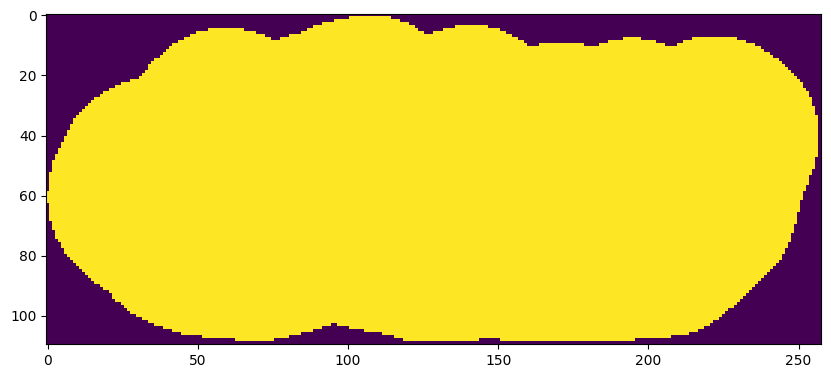

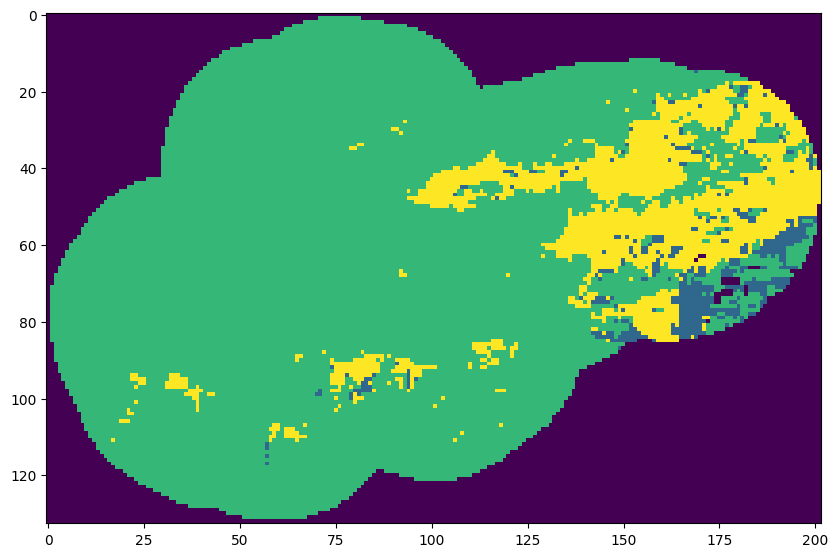

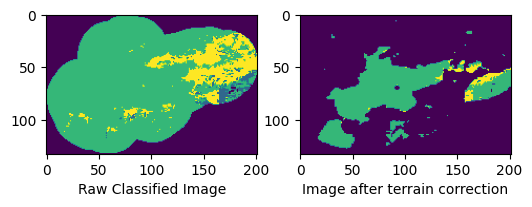

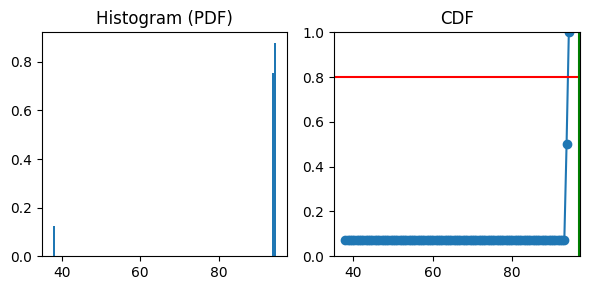

The bin value corresponding to the first CDF value just greater than 0.8 is: 94.43000030517578
Area after enhancement from thresholding is 2.6694 km2


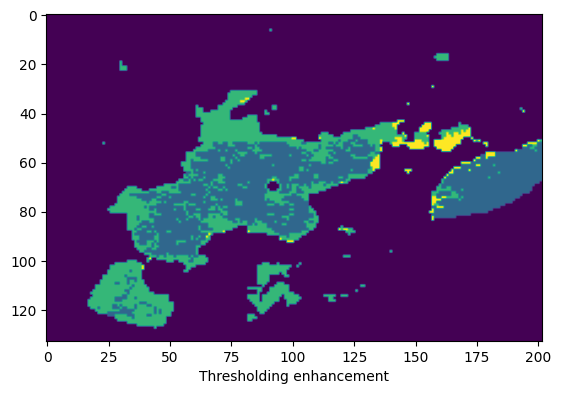

Elbow index:  97
Hockeyness Index: 0.4642857142857143
Area after elbow enhancement is 0.0108 km2


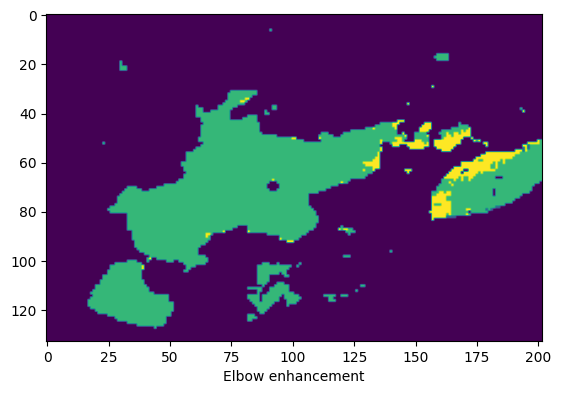

/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  857


100%|██████████| 16/16 [00:00<00:00, 63.68it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/857/clipped_rasters/2016006
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.277689566352634
Starting classification


100%|██████████| 13/13 [00:00<00:00, 407.59it/s]

(141, 201, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.162599 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 272.84476059419217	Solar zenith angle 204.21125366077413
Shape of the classified image is (141, 201) and DEM is (141, 201)
Shape of the JRC image is (141, 201)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1511


100%|██████████| 16/16 [00:00<00:00, 56.19it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1511/clipped_rasters/2016007
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.544655059038797
Starting classification


100%|██████████| 13/13 [00:00<00:00, 212.66it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWith

(393, 445, 13)
prediction took 0:00:00.611557 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 376.4671541298568	Solar zenith angle 333.3591042685193
Shape of the classified image is (393, 445) and DEM is (393, 445)
Shape of the JRC image is (393, 445)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1512


100%|██████████| 16/16 [00:00<00:00, 62.95it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1512/clipped_rasters/2016007
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.39666666666666667
Starting classification


100%|██████████| 13/13 [00:00<00:00, 329.97it/s]

(300, 232, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.326279 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 318.47520833333334	Solar zenith angle 261.10182270114944
Shape of the classified image is (300, 232) and DEM is (300, 232)
Shape of the JRC image is (300, 232)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1493


100%|██████████| 16/16 [00:00<00:00, 19.58it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1493/clipped_rasters/2016007
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.6664939669902432
Starting classification


100%|██████████| 13/13 [00:00<00:00, 16.79it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithC

(1324, 1952, 13)


/tmp/job.1346467/ipykernel_184889/1309891865.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['awei_sh'] = test_df['B02'] + 2.5 * test_df['B03'] - 1.5 * (test_df['B08'] + test_df['B11']) - 0.25 * test_df['B12']


prediction took 0:00:06.474244 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 417.65493604823934	Solar zenith angle 384.4468791208026
Shape of the classified image is (1324, 1952) and DEM is (1324, 1952)
Shape of the JRC image is (1324, 1952)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  828


 17%|█▋        | 2/12 [00:12<01:01,  6.17s/it]
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Error processing day: '/scratch/user/anshulya/hls/data/cluster/14TQR/unmerged_rasters/2016010/L30/HLS.L30.T14TQR.2016010T171103.v2.0.B05.tif' not recognized as a supported file format.
Processing starting for reservoir:  828


100%|██████████| 12/12 [00:00<00:00, 50.19it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016012
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016012
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  831


100%|██████████| 12/12 [00:00<00:00, 64.96it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/831/clipped_rasters/2016012
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/831/clipped_rasters/2016012
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/si

Processing starting for reservoir:  786
Error processing day: [Errno 2] No such file or directory: '/scratch/user/anshulya/hls/data/raw/786/merged_rasters/2016012'
Processing starting for reservoir:  878


100%|██████████| 12/12 [00:00<00:00, 66.45it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/878/clipped_rasters/2016014
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/878/clipped_rasters/2016014
---------------------------------------------------------
Processing starting for reservoir:  883


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
100%|██████████| 12/12 [00:00<00:00, 45.48it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/883/clipped_rasters/2016014


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/883/clipped_rasters/2016014
---------------------------------------------------------
Processing starting for reservoir:  892


100%|██████████| 12/12 [00:00<00:00, 65.20it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/892/clipped_rasters/2016014
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.28366240805265197
Starting classification


100%|██████████| 9/9 [00:00<00:00, 450.33it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(205, 126, 9)
prediction took 0:00:00.160719 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 271.6219953542393	Solar zenith angle 205.97305110336816
Shape of the classified image is (205, 126) and DEM is (205, 126)
Shape of the JRC image is (205, 126)
Ice fraction is: 0.00%
Water ratio (Fmask:our classification) is: 1.00
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 99.21


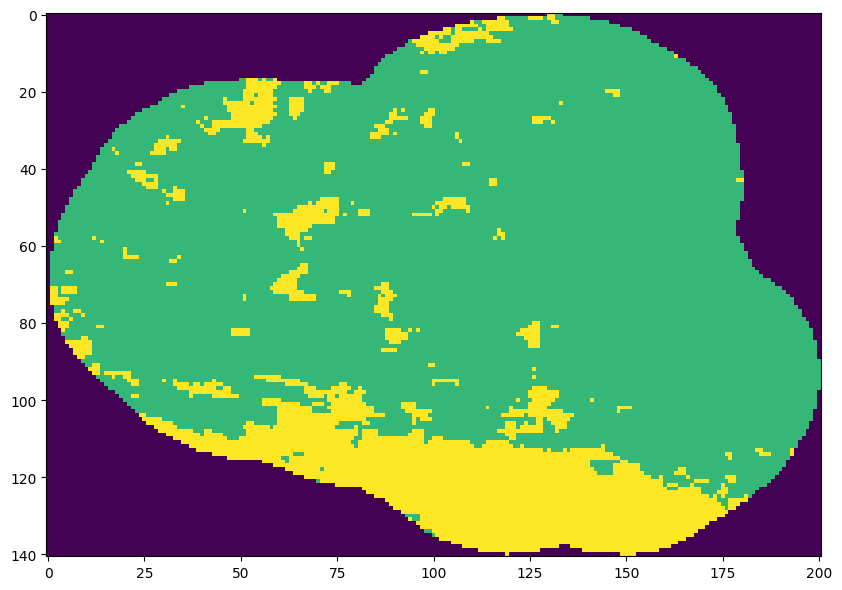

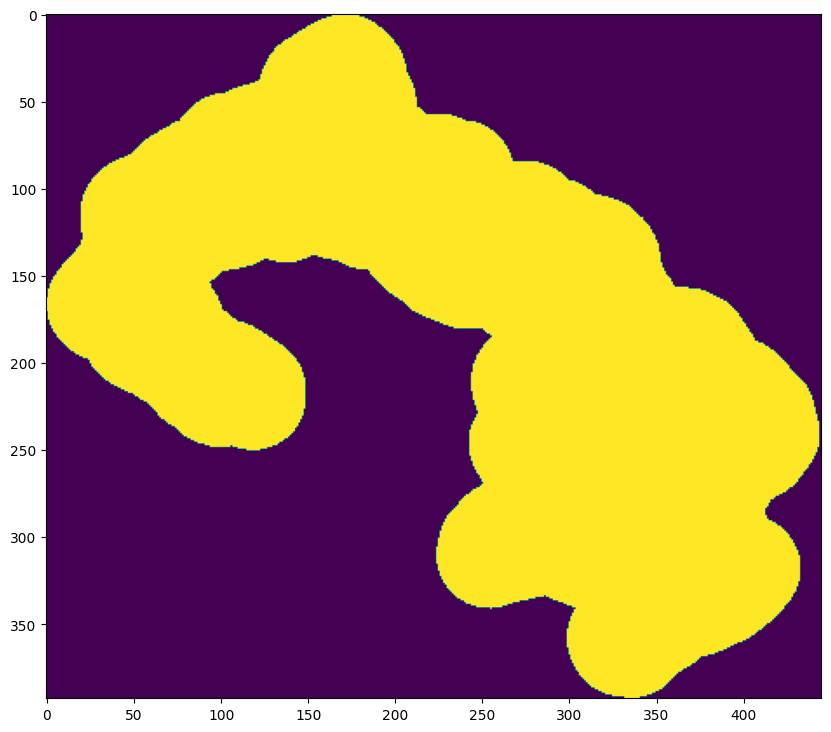

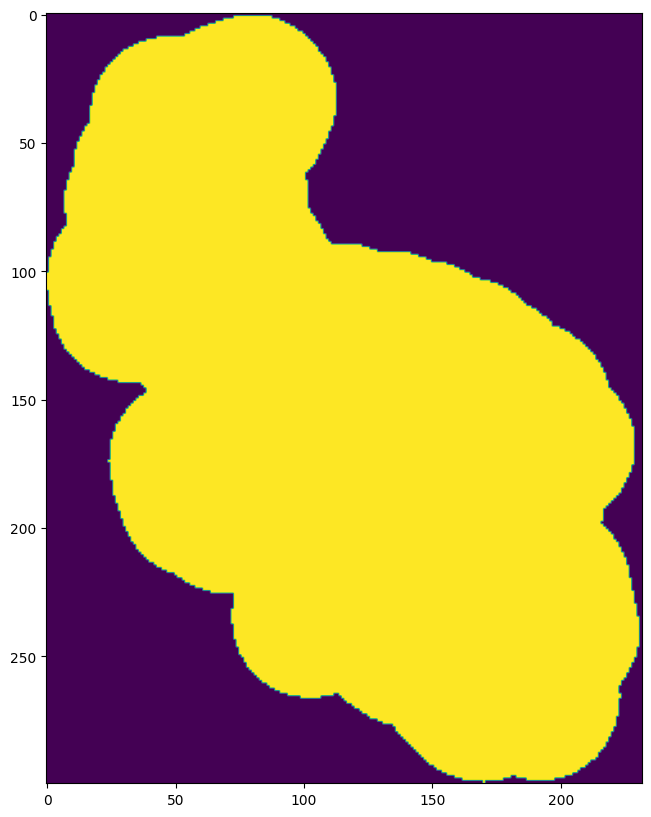

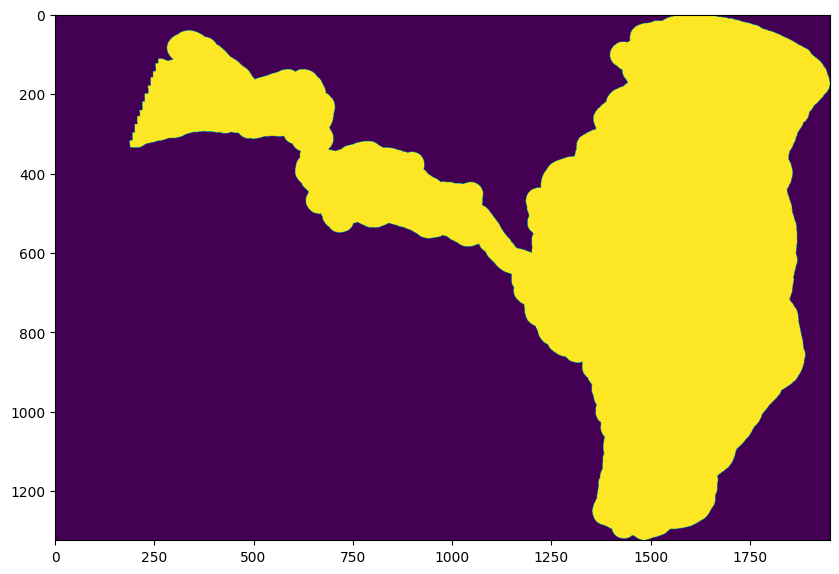

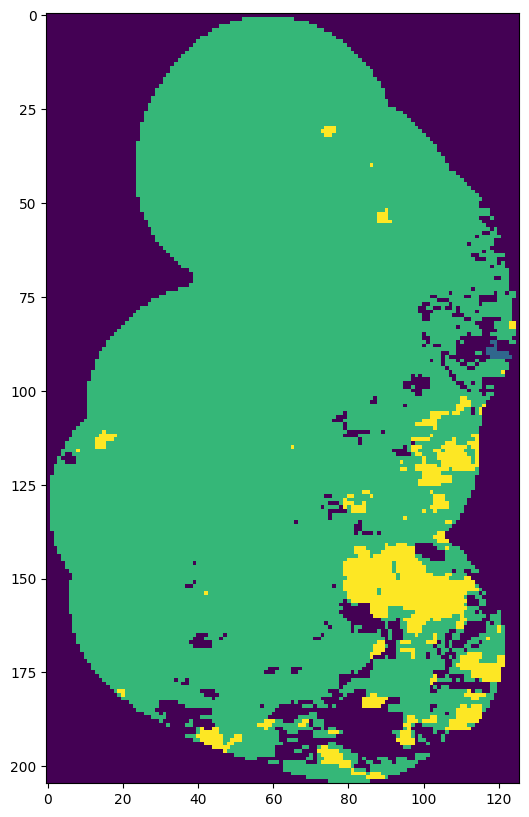

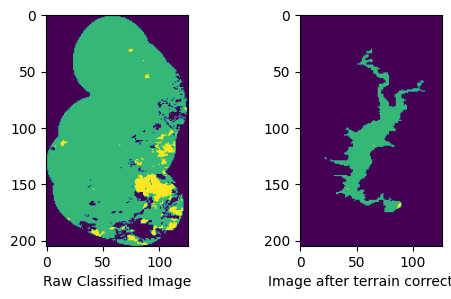

/scratch/user/anshulya/.conda/envs/hls_env/lib/python3.11/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


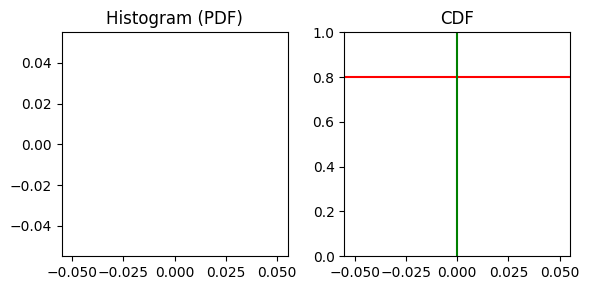

Traceback (most recent call last):
  File "/tmp/job.1346467/ipykernel_184889/1309891865.py", line 282, in classify_reservoir
    index = np.where(cdf >= 0.8)[0][0]
            ~~~~~~~~~~~~~~~~~~~~~~~^^^
IndexError: index 0 is out of bounds for axis 0 with size 0
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


An exception occurred: index 0 is out of bounds for axis 0 with size 0
----------------------------------------------------------------------------------
Processing starting for reservoir:  1501


100%|██████████| 12/12 [00:00<00:00, 40.67it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1501/clipped_rasters/2016014
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.8632957086603706
Starting classification


100%|██████████| 9/9 [00:00<00:00, 162.69it/s]

(673, 503, 9)



/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCopyWarning: 
A value is trying to be set on a co

prediction took 0:00:00.335623 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 500.2425203607479	Solar zenith angle 487.5017511572467
Shape of the classified image is (673, 503) and DEM is (673, 503)
Shape of the JRC image is (673, 503)


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Ice fraction is: 0.00%
No water found! Probably very cloudy!!
Processing starting for reservoir:  828


100%|██████████| 16/16 [00:00<00:00, 48.27it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016016
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.5411005434782609
Starting classification


100%|██████████| 13/13 [00:00<00:00, 216.26it/s]

(480, 368, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.664688 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 375.05212403759054	Solar zenith angle 332.04746223958335
Shape of the classified image is (480, 368) and DEM is (480, 368)
Shape of the JRC image is (480, 368)
Ice fraction is: 22.33%
Water ratio (Fmask:our classification) is: 0.00
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 76.77


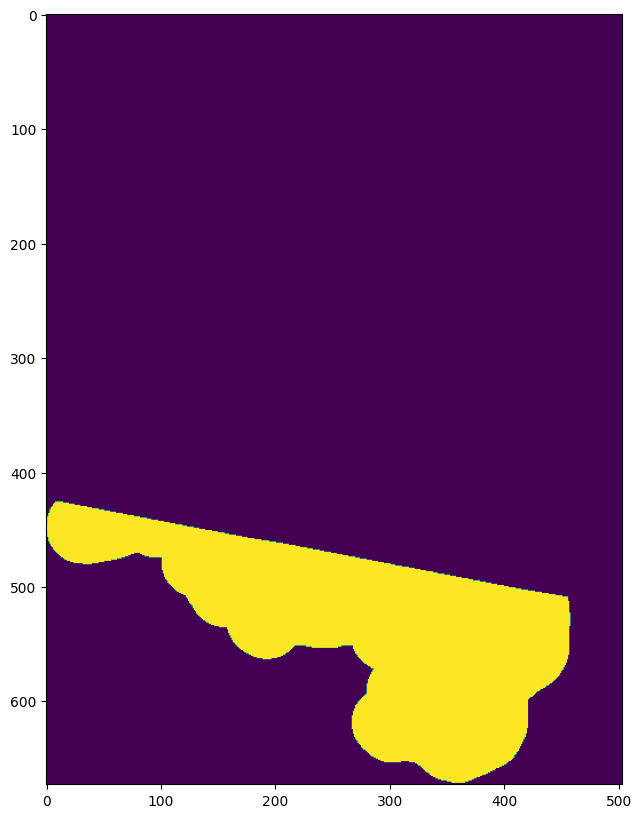

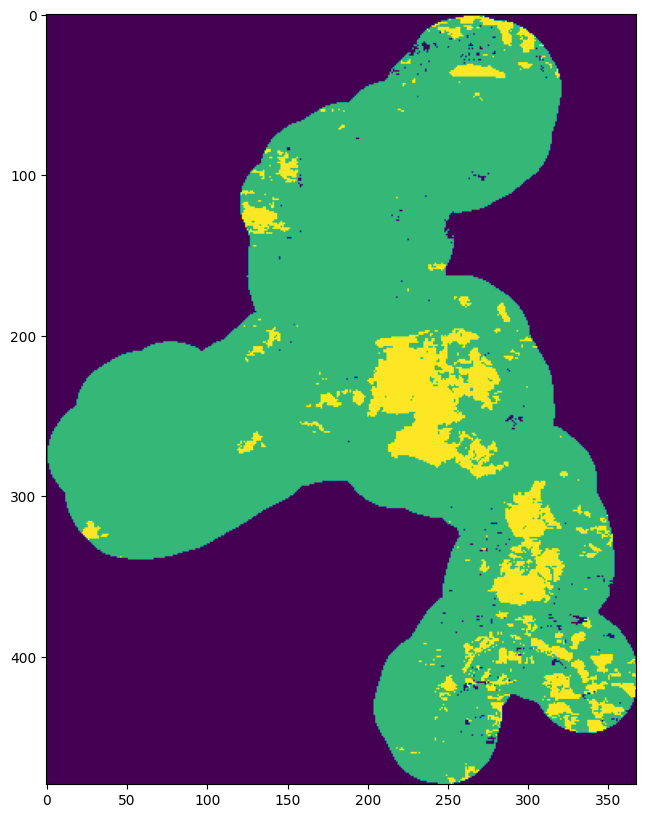

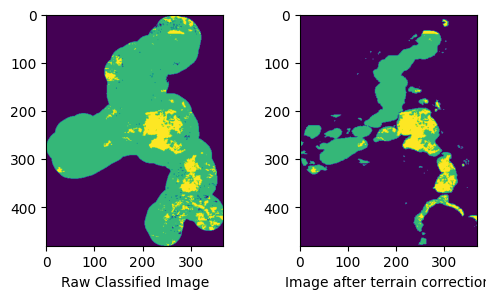

/scratch/user/anshulya/.conda/envs/hls_env/lib/python3.11/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


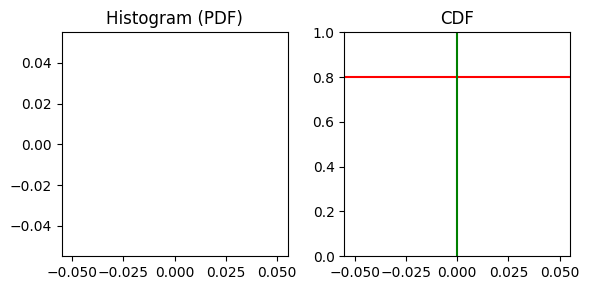

An exception occurred: index 0 is out of bounds for axis 0 with size 0
----------------------------------------------------------------------------------


Traceback (most recent call last):
  File "/tmp/job.1346467/ipykernel_184889/1309891865.py", line 282, in classify_reservoir
    index = np.where(cdf >= 0.8)[0][0]
            ~~~~~~~~~~~~~~~~~~~~~~~^^^
IndexError: index 0 is out of bounds for axis 0 with size 0
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  831


100%|██████████| 16/16 [00:00<00:00, 64.95it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/831/clipped_rasters/2016016
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.34987113402061853
Starting classification


100%|██████████| 13/13 [00:00<00:00, 398.42it/s]

(144, 291, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.231331 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 299.80337008400153	Solar zenith angle 238.9741165521191
Shape of the classified image is (144, 291) and DEM is (144, 291)
Shape of the JRC image is (144, 291)
Ice fraction is: 16.60%
Water ratio (Fmask:our classification) is: 0.00
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 83.38


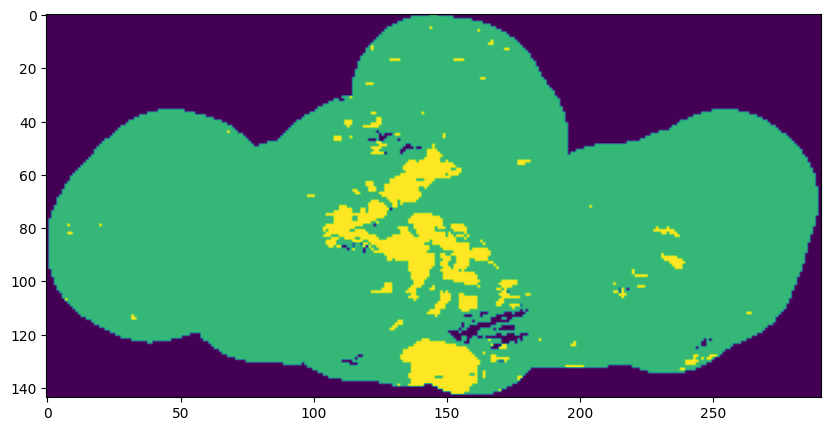

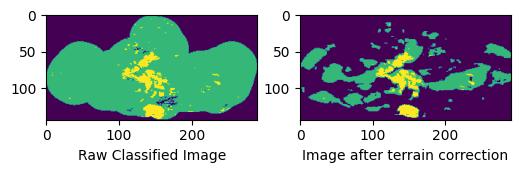

/scratch/user/anshulya/.conda/envs/hls_env/lib/python3.11/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


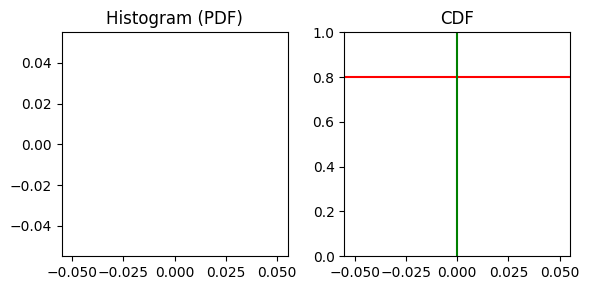

Traceback (most recent call last):
  File "/tmp/job.1346467/ipykernel_184889/1309891865.py", line 282, in classify_reservoir
    index = np.where(cdf >= 0.8)[0][0]
            ~~~~~~~~~~~~~~~~~~~~~~~^^^
IndexError: index 0 is out of bounds for axis 0 with size 0
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


An exception occurred: index 0 is out of bounds for axis 0 with size 0
----------------------------------------------------------------------------------
Processing starting for reservoir:  786


100%|██████████| 16/16 [00:00<00:00, 53.89it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/786/clipped_rasters/2016016
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.3758015491714874
Starting classification


100%|██████████| 13/13 [00:00<00:00, 368.11it/s]

(329, 155, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.290524 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 310.26589508775373	Solar zenith angle 252.04419256789882
Shape of the classified image is (329, 155) and DEM is (329, 155)
Shape of the JRC image is (329, 155)
Ice fraction is: 13.17%
Water ratio (Fmask:our classification) is: 0.33
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 2.72


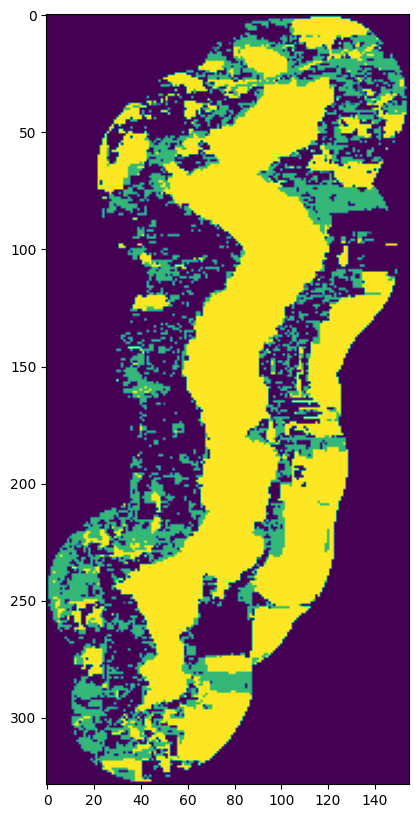

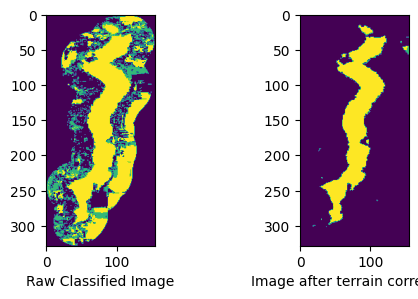

Cloud cover less than 5 %. No enhancement required!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  795


100%|██████████| 16/16 [00:00<00:00, 63.99it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/795/clipped_rasters/2016016
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.7373509933774834
Starting classification


100%|██████████| 13/13 [00:00<00:00, 418.49it/s]

(151, 200, 13)
prediction took 0:00:00.080366 time
Classification done!!
---------------------------------------------------------



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

Solar azimuth angle: 254.40646059602648	Solar zenith angle 183.33256920529803
Shape of the classified image is (151, 200) and DEM is (151, 200)
Shape of the JRC image is (151, 200)
Ice fraction is: 0.83%
Water ratio (Fmask:our classification) is: 1.00
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 86.44


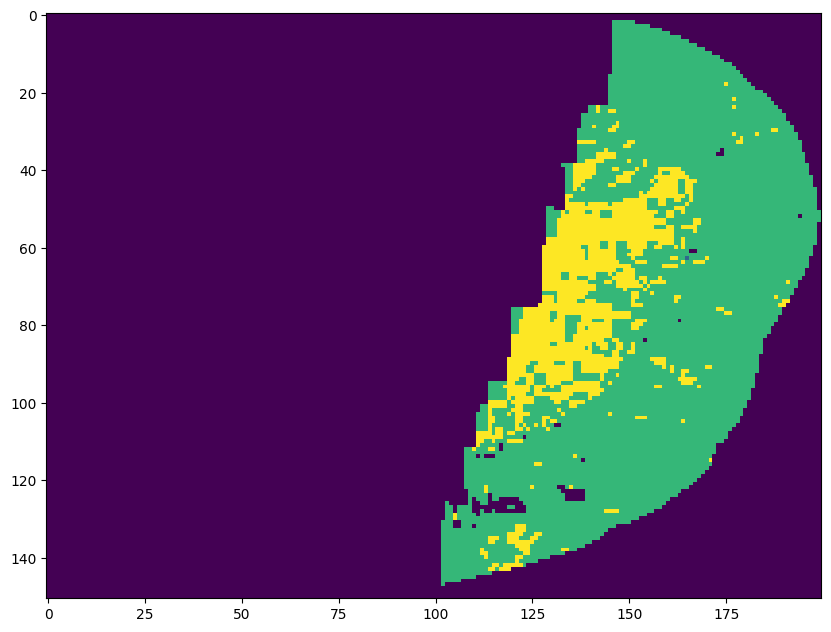

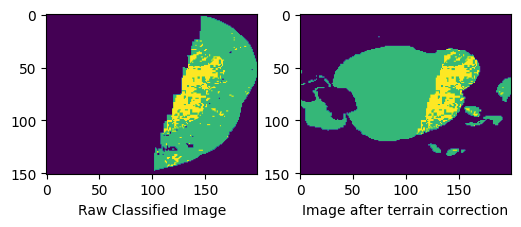

/scratch/user/anshulya/.conda/envs/hls_env/lib/python3.11/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


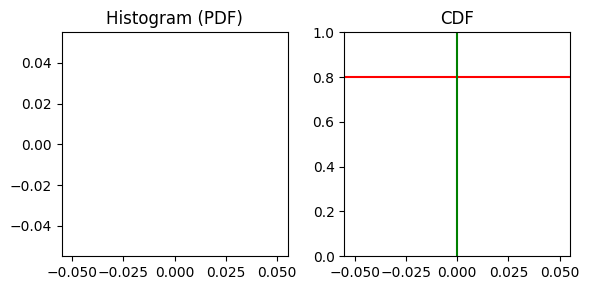

Traceback (most recent call last):
  File "/tmp/job.1346467/ipykernel_184889/1309891865.py", line 282, in classify_reservoir
    index = np.where(cdf >= 0.8)[0][0]
            ~~~~~~~~~~~~~~~~~~~~~~~^^^
IndexError: index 0 is out of bounds for axis 0 with size 0
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


An exception occurred: index 0 is out of bounds for axis 0 with size 0
----------------------------------------------------------------------------------
Processing starting for reservoir:  853


100%|██████████| 16/16 [00:00<00:00, 64.58it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/853/clipped_rasters/2016016
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.3422913719943423
Starting classification


100%|██████████| 13/13 [00:00<00:00, 425.89it/s]

(133, 202, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.200215 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 291.8308475396412	Solar zenith angle 228.19763269560042
Shape of the classified image is (133, 202) and DEM is (133, 202)
Shape of the JRC image is (133, 202)
Ice fraction is: 38.61%
Water ratio (Fmask:our classification) is: 0.14
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 20.68


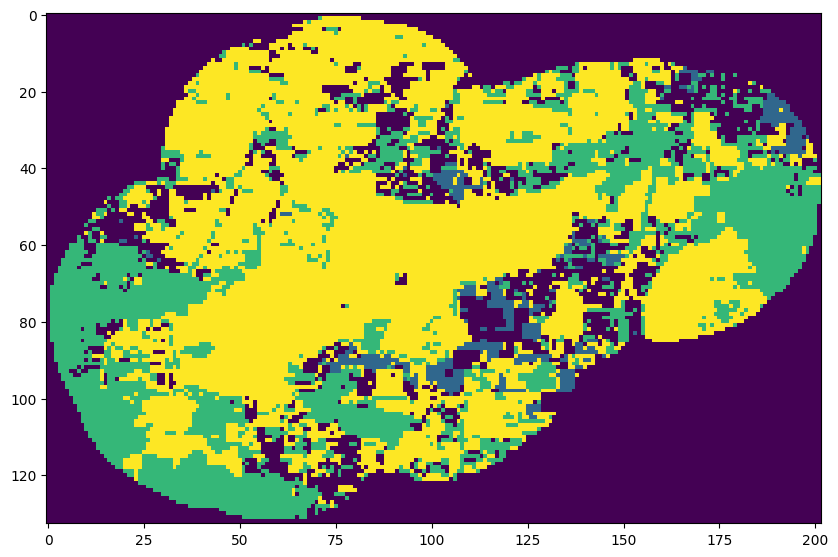

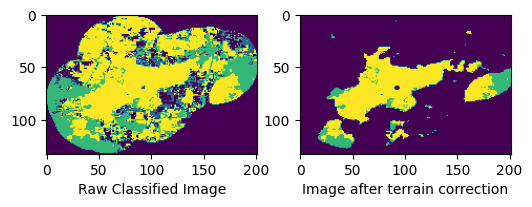

/scratch/user/anshulya/.conda/envs/hls_env/lib/python3.11/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


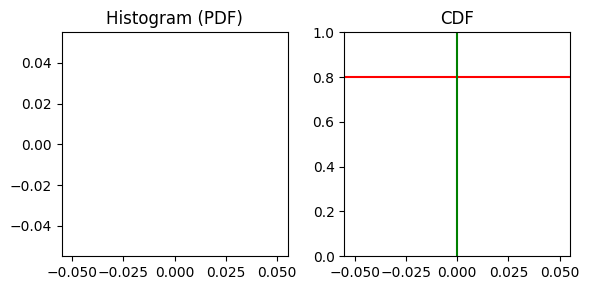

Traceback (most recent call last):
  File "/tmp/job.1346467/ipykernel_184889/1309891865.py", line 282, in classify_reservoir
    index = np.where(cdf >= 0.8)[0][0]
            ~~~~~~~~~~~~~~~~~~~~~~~^^^
IndexError: index 0 is out of bounds for axis 0 with size 0
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


An exception occurred: index 0 is out of bounds for axis 0 with size 0
----------------------------------------------------------------------------------
Processing starting for reservoir:  857


100%|██████████| 16/16 [00:00<00:00, 64.20it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/857/clipped_rasters/2016016
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.277689566352634
Starting classification


100%|██████████| 13/13 [00:00<00:00, 442.19it/s]

(141, 201, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.176240 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 271.88408771744116	Solar zenith angle 203.25780388835963
Shape of the classified image is (141, 201) and DEM is (141, 201)
Shape of the JRC image is (141, 201)
Ice fraction is: 96.19%
Water ratio (Fmask:our classification) is: 0.02
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 3.50


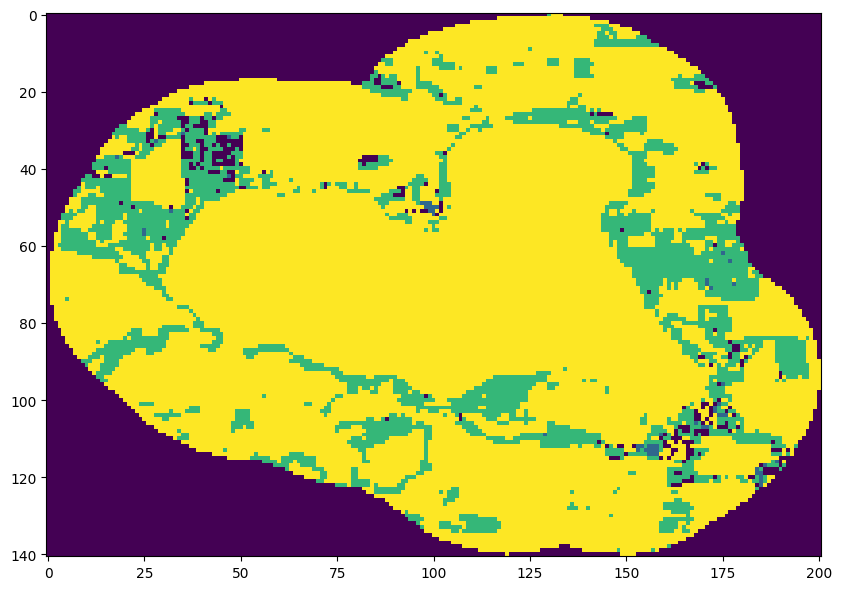

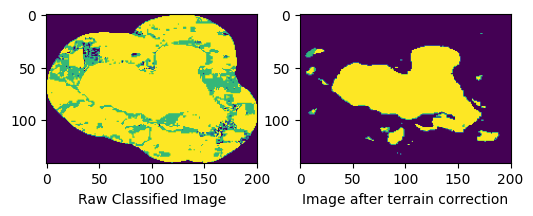

/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Ice fraction is more than 90%! Area estimation not performed
Processing starting for reservoir:  1511


100%|██████████| 12/12 [00:00<00:00, 54.74it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1511/clipped_rasters/2016016
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.6877147840009149
Starting classification


100%|██████████| 9/9 [00:00<00:00, 264.24it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(393, 445, 9)
prediction took 0:00:00.440214 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 391.75075089344426	Solar zenith angle 354.9962971095291
Shape of the classified image is (393, 445) and DEM is (393, 445)
Shape of the JRC image is (393, 445)
Ice fraction is: 14.81%
Water ratio (Fmask:our classification) is: 0.44
Current raw area after terrain correction is 0.108 km2
Cloud cover in % over reservoir: 71.74


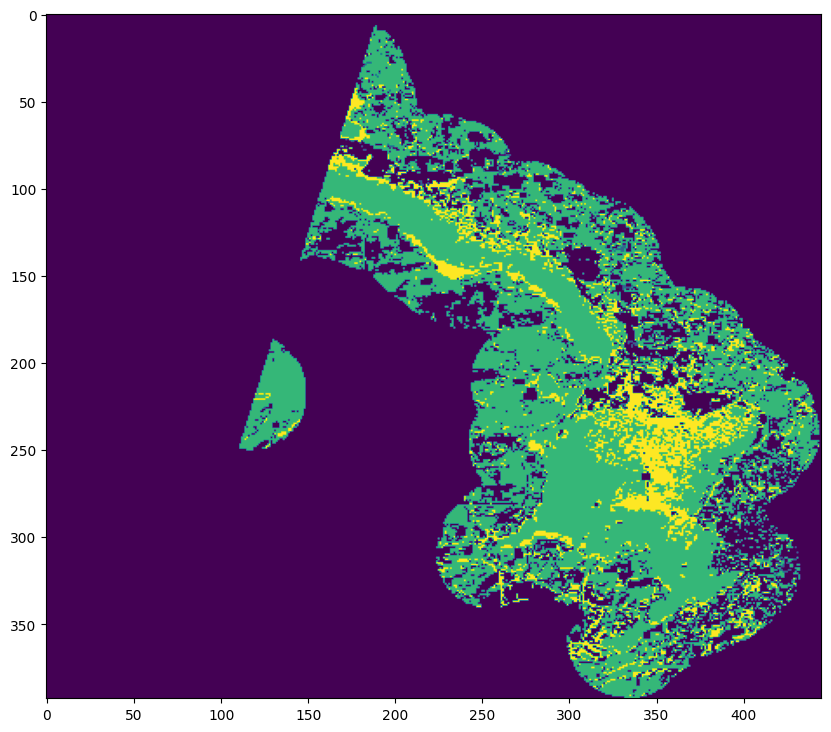

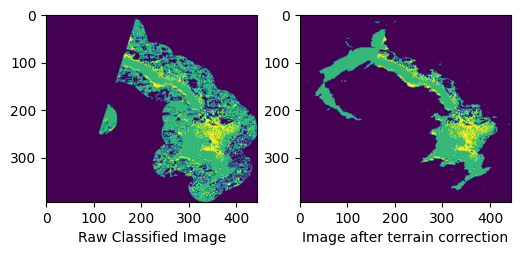

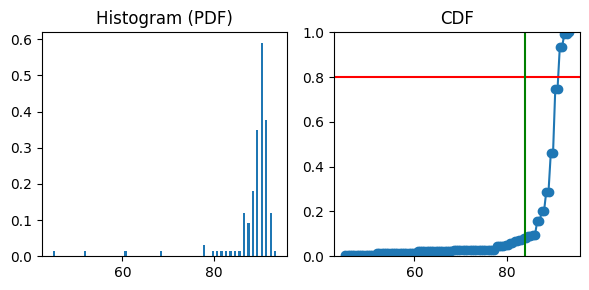

The bin value corresponding to the first CDF value just greater than 0.8 is: 91.55000305175781
Area after enhancement from thresholding is 6.6816 km2


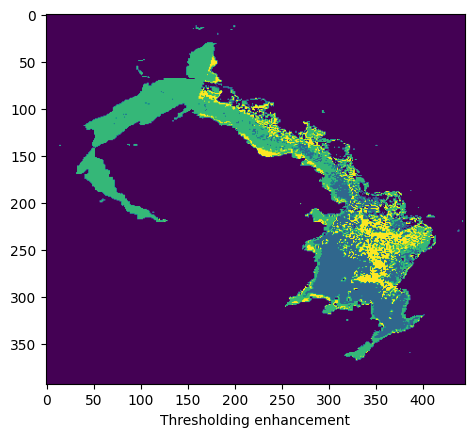

Elbow index:  84
Hockeyness Index: 0.05918895445319885
Area after elbow enhancement is 15.3621 km2


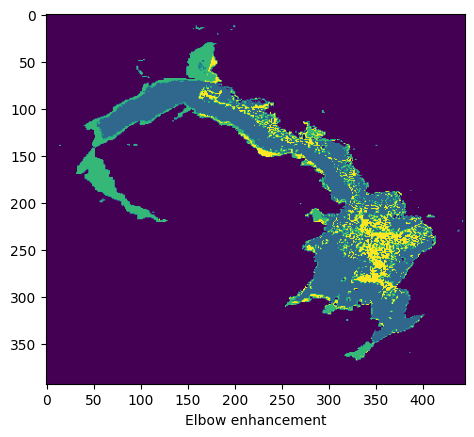

/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1512


100%|██████████| 12/12 [00:00<00:00, 58.22it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1512/clipped_rasters/2016016
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.41836206896551725
Starting classification


100%|██████████| 9/9 [00:00<00:00, 369.22it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(300, 232, 9)
prediction took 0:00:00.344895 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 315.2645665229885	Solar zenith angle 261.03936393678157
Shape of the classified image is (300, 232) and DEM is (300, 232)
Shape of the JRC image is (300, 232)
Ice fraction is: 29.87%
Water ratio (Fmask:our classification) is: 0.66
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 55.10


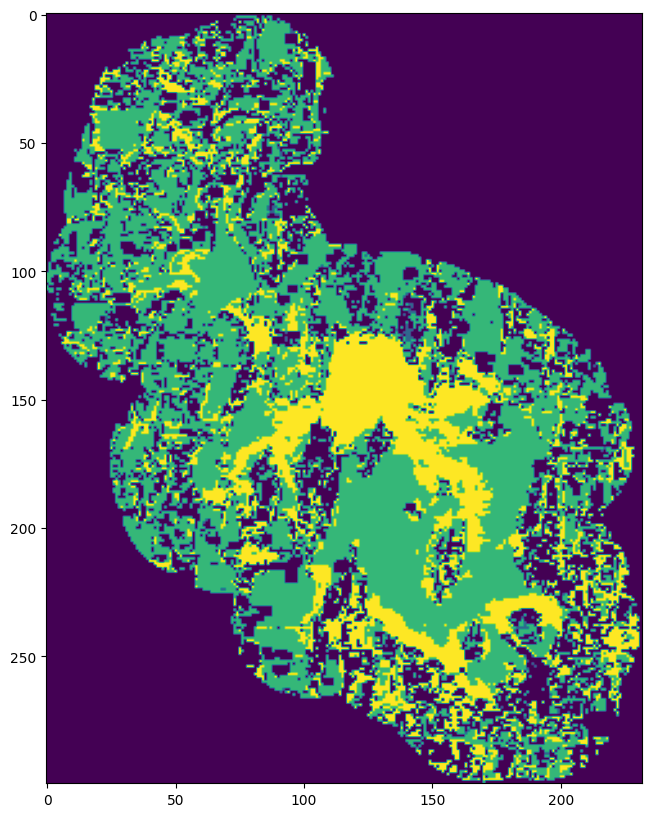

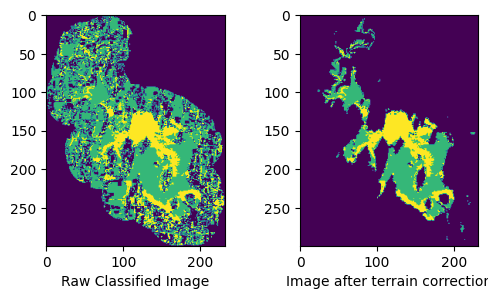

/scratch/user/anshulya/.conda/envs/hls_env/lib/python3.11/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


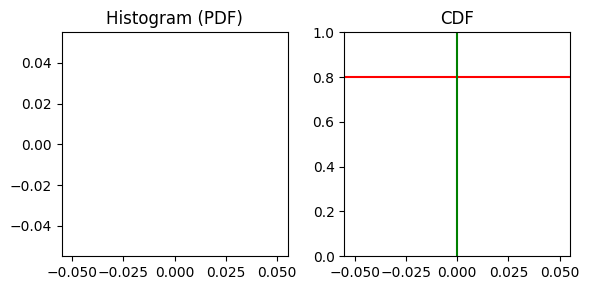

Traceback (most recent call last):
  File "/tmp/job.1346467/ipykernel_184889/1309891865.py", line 282, in classify_reservoir
    index = np.where(cdf >= 0.8)[0][0]
            ~~~~~~~~~~~~~~~~~~~~~~~^^^
IndexError: index 0 is out of bounds for axis 0 with size 0
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


An exception occurred: index 0 is out of bounds for axis 0 with size 0
----------------------------------------------------------------------------------
Processing starting for reservoir:  1493


100%|██████████| 12/12 [00:00<00:00, 18.24it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1493/clipped_rasters/2016016
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.7156700386310733
Starting classification


100%|██████████| 9/9 [00:00<00:00, 23.03it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCopy

(1324, 1952, 9)
prediction took 0:00:06.307709 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 438.90044968596777	Solar zenith angle 412.67878395696107
Shape of the classified image is (1324, 1952) and DEM is (1324, 1952)
Shape of the JRC image is (1324, 1952)
Ice fraction is: 36.52%
Water ratio (Fmask:our classification) is: 0.56
Current raw area after terrain correction is 1.2933 km2
Cloud cover in % over reservoir: 48.95


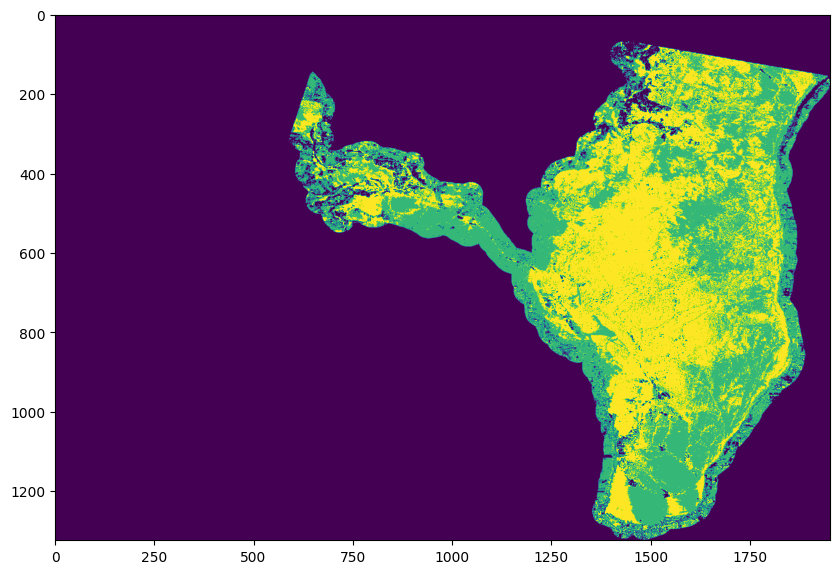

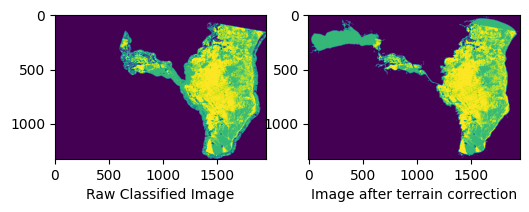

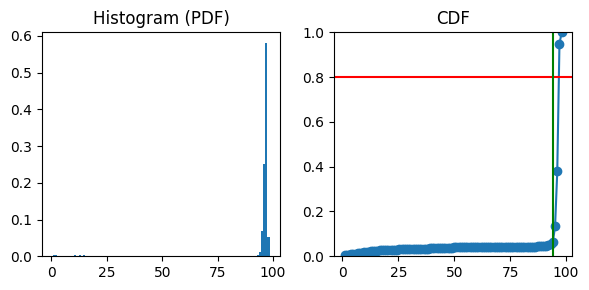

The bin value corresponding to the first CDF value just greater than 0.8 is: 97.04000091552734
Area after enhancement from thresholding is 250.1109 km2


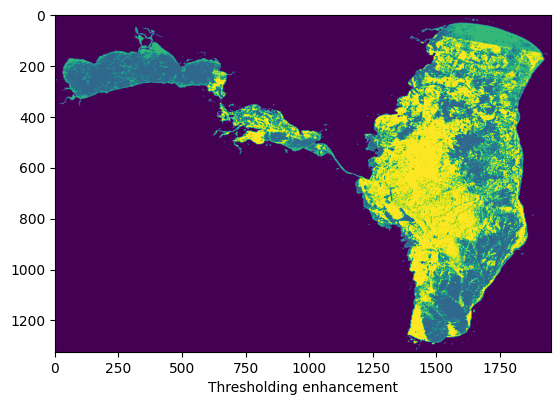

Elbow index:  94
Hockeyness Index: 0.18878866990719836
Area after elbow enhancement is 302.6286 km2


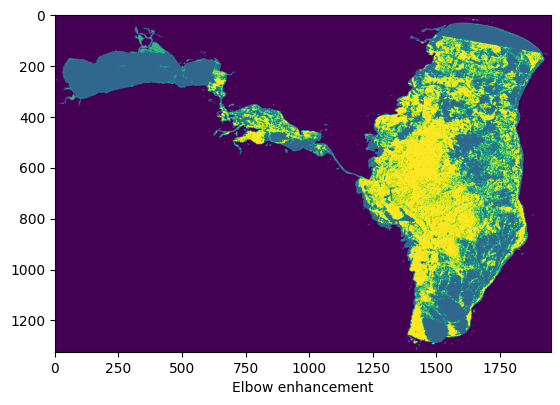

/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  828


100%|██████████| 12/12 [00:00<00:00, 59.34it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016017
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016017
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  786


100%|██████████| 12/12 [00:00<00:00, 60.83it/s]
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing:  /scratch/user/anshulya/hls/data/raw/786/clipped_rasters/2016017
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/786/clipped_rasters/2016017
---------------------------------------------------------
Processing starting for reservoir:  795


100%|██████████| 12/12 [00:00<00:00, 64.53it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/795/clipped_rasters/2016017
1.0
mostly empty raster
/scratch/user/anshulya/hls/data/raw/795/clipped_rasters/2016017
---------------------------------------------------------


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/si

Processing starting for reservoir:  828
Error processing day: [Errno 2] No such file or directory: '/scratch/user/anshulya/hls/data/raw/828/merged_rasters/2016019'
Processing starting for reservoir:  878


100%|██████████| 16/16 [00:00<00:00, 70.24it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/878/clipped_rasters/2016020
0.1882663847780127
Starting classification


100%|██████████| 13/13 [00:00<00:00, 423.71it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWith

(110, 258, 13)
prediction took 0:00:00.200115 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 232.23817485159202	Solar zenith angle 153.6370023385501
Shape of the classified image is (110, 258) and DEM is (110, 258)
Shape of the JRC image is (110, 258)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  883


100%|██████████| 16/16 [00:00<00:00, 36.00it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/883/clipped_rasters/2016020
0.7569082352941177
Starting classification


100%|██████████| 13/13 [00:00<00:00, 110.93it/s]

(680, 625, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.839406 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 428.58094216453526	Solar zenith angle 397.63513746262015
Shape of the classified image is (680, 625) and DEM is (680, 625)
Shape of the JRC image is (680, 625)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1480


100%|██████████| 16/16 [00:00<00:00, 55.82it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1480/clipped_rasters/2016020
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.5261297883249103
Starting classification


100%|██████████| 13/13 [00:00<00:00, 220.52it/s]

(369, 444, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.645903 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 369.1472651920213	Solar zenith angle 323.75220842794016
Shape of the classified image is (369, 444) and DEM is (369, 444)
Shape of the JRC image is (369, 444)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!
Processing starting for reservoir:  1511


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
100%|██████████| 16/16 [00:00<00:00, 55.28it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1511/clipped_rasters/2016020
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.544655059038797
Starting classification


100%|██████████| 13/13 [00:00<00:00, 227.37it/s]

(393, 445, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.593024 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 376.7858955885296	Solar zenith angle 332.23940332218314
Shape of the classified image is (393, 445) and DEM is (393, 445)
Shape of the JRC image is (393, 445)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1512


100%|██████████| 16/16 [00:00<00:00, 59.51it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1512/clipped_rasters/2016020
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.39666666666666667
Starting classification


100%|██████████| 13/13 [00:00<00:00, 356.12it/s]

(300, 232, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.325425 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 318.9050204022988	Solar zenith angle 259.6200745689655
Shape of the classified image is (300, 232) and DEM is (300, 232)
Shape of the JRC image is (300, 232)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!
Processing starting for reservoir:  1493


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
100%|██████████| 16/16 [00:00<00:00, 18.39it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1493/clipped_rasters/2016020
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.6506344875191917
Starting classification


100%|██████████| 13/13 [00:00<00:00, 16.93it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithC

(1324, 1952, 13)


/tmp/job.1346467/ipykernel_184889/1309891865.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['awei_ns'] = 4 * (test_df['B03'] - test_df['B11']) - (0.25 * test_df['B08'] + 2.75 * test_df['B12'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:85: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['awei_sh'] = test_df['B02'] + 2.5 * test_df['B03'] - 1.5 * (test_df['B08'] + test_df['B11']) - 0.25 * test_df['B12']


prediction took 0:00:07.833271 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 417.90764453376505	Solar zenith angle 383.58598113407584
Shape of the classified image is (1324, 1952) and DEM is (1324, 1952)
Shape of the JRC image is (1324, 1952)
Ice fraction is: 25.63%
Water ratio (Fmask:our classification) is: 0.11
Current raw area after terrain correction is 62.1882 km2
Cloud cover in % over reservoir: 46.01


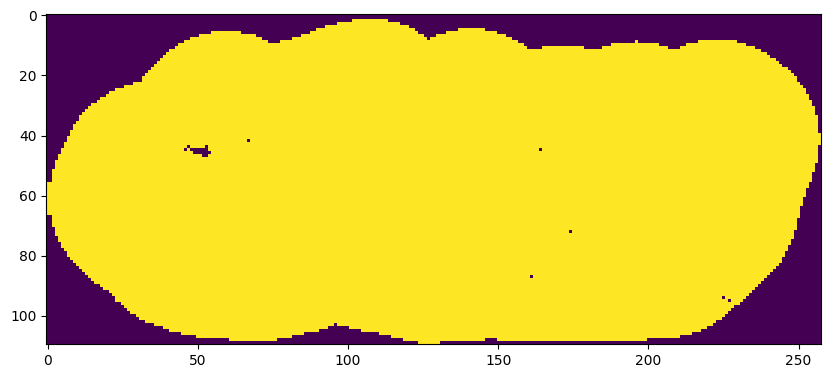

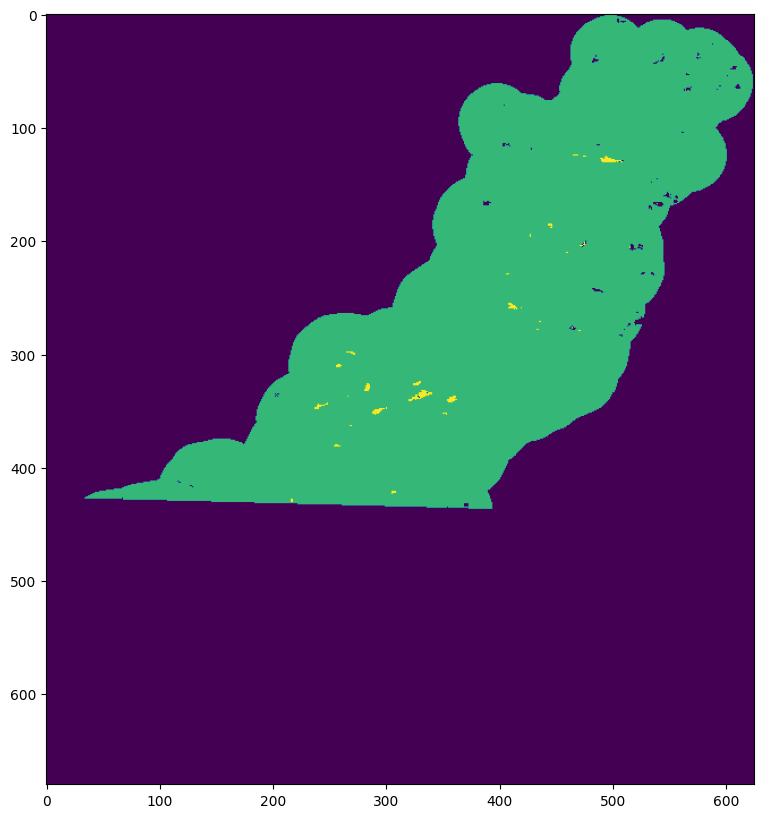

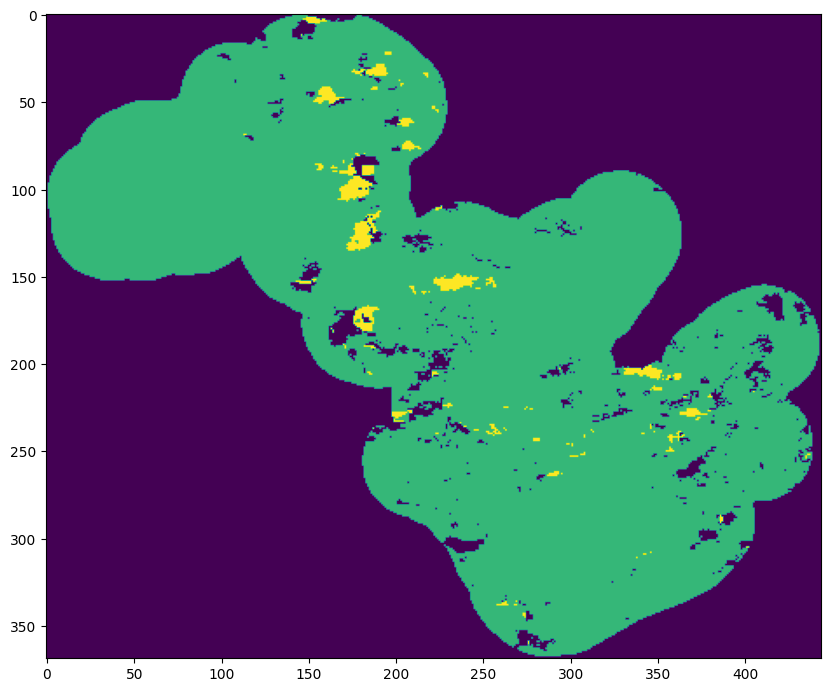

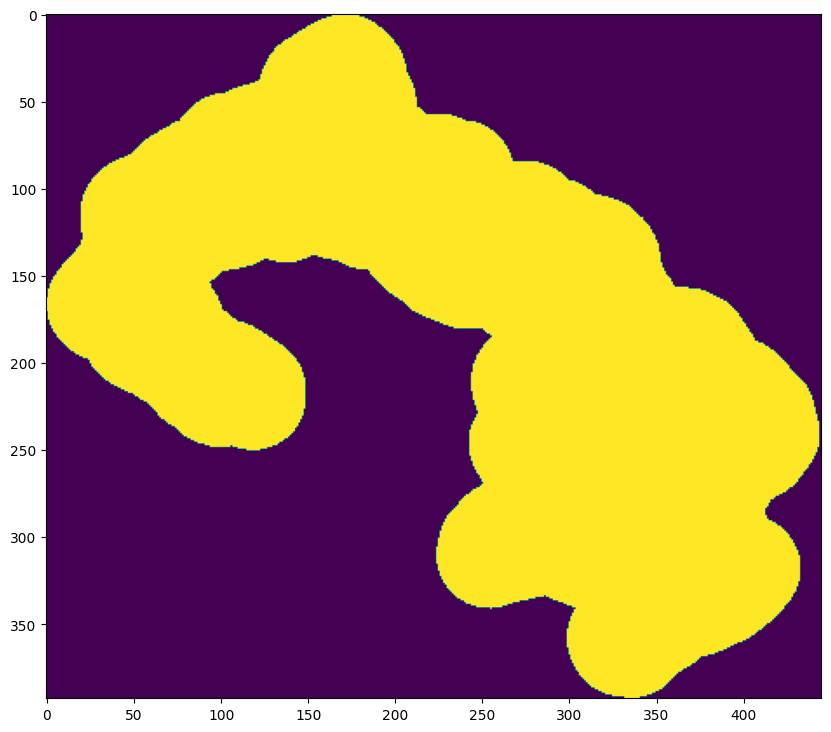

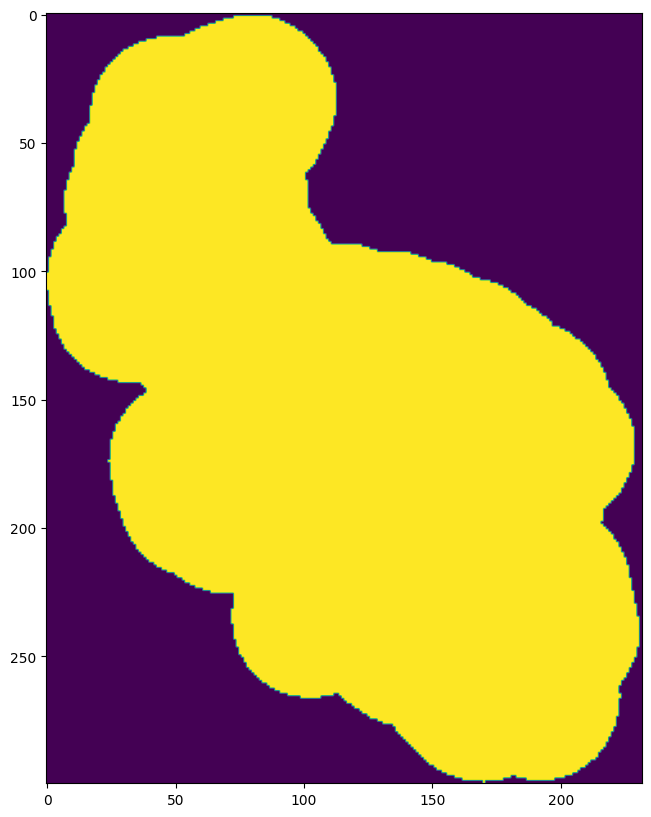

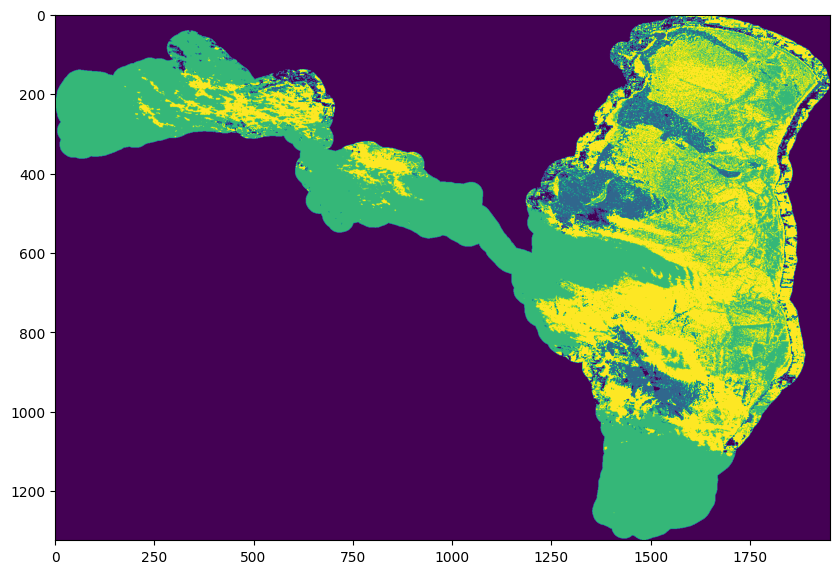

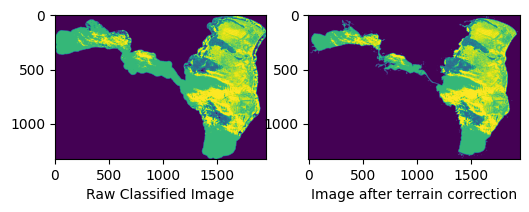

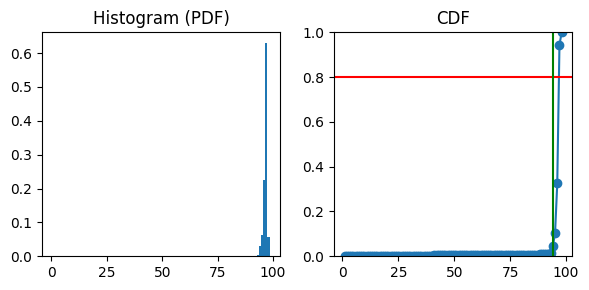

The bin value corresponding to the first CDF value just greater than 0.8 is: 97.04000091552734
Area after enhancement from thresholding is 293.2821 km2


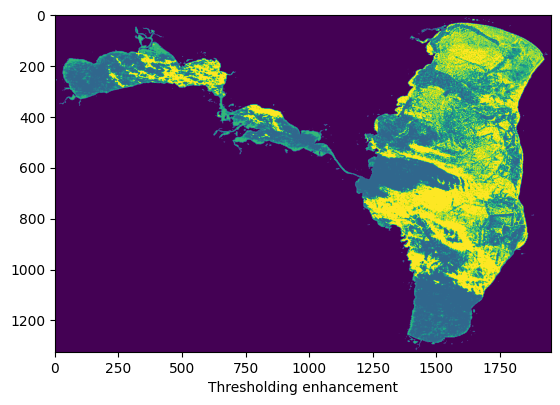

Elbow index:  94
Hockeyness Index: 0.1968036756414187
Area after elbow enhancement is 332.7048 km2


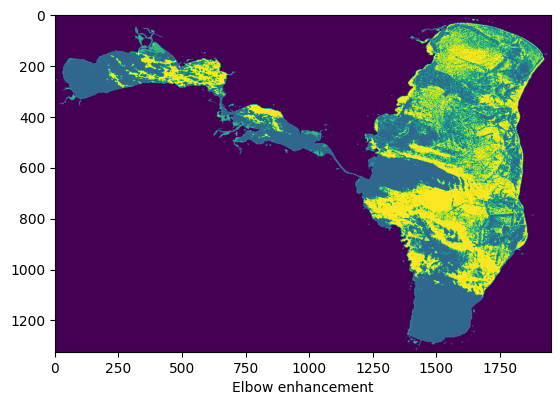

/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  878


100%|██████████| 12/12 [00:00<00:00, 71.37it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/878/clipped_rasters/2016023
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.18601127554615926
Starting classification


100%|██████████| 9/9 [00:00<00:00, 459.11it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(110, 258, 9)
prediction took 0:00:00.194530 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 228.579859055673	Solar zenith angle 155.2623527131783
Shape of the classified image is (110, 258) and DEM is (110, 258)
Shape of the JRC image is (110, 258)
Ice fraction is: 0.00%
Water ratio (Fmask:our classification) is: 1.00
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 96.13


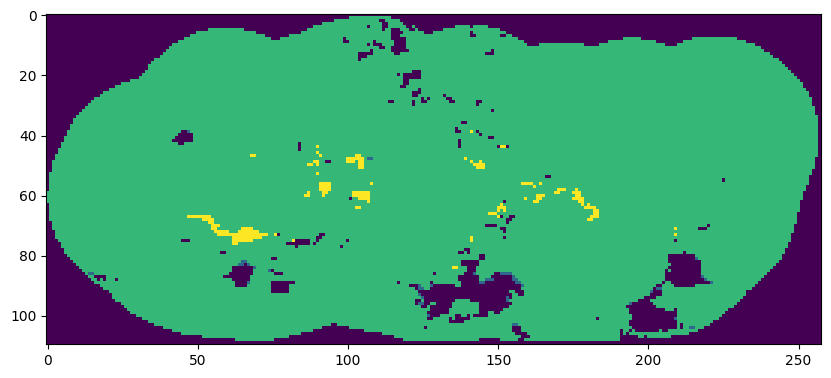

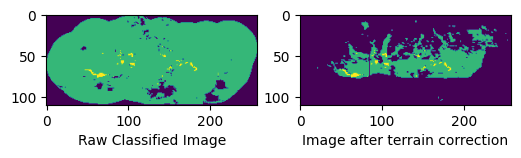

/scratch/user/anshulya/.conda/envs/hls_env/lib/python3.11/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


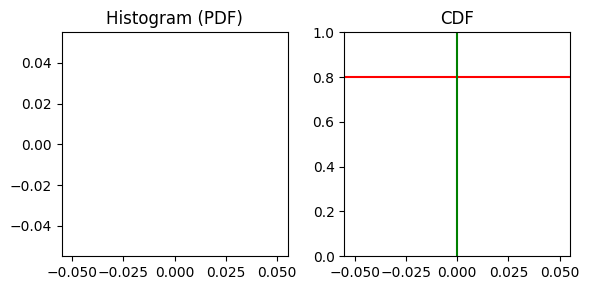

Traceback (most recent call last):
  File "/tmp/job.1346467/ipykernel_184889/1309891865.py", line 282, in classify_reservoir
    index = np.where(cdf >= 0.8)[0][0]
            ~~~~~~~~~~~~~~~~~~~~~~~^^^
IndexError: index 0 is out of bounds for axis 0 with size 0
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


An exception occurred: index 0 is out of bounds for axis 0 with size 0
----------------------------------------------------------------------------------
Processing starting for reservoir:  883


100%|██████████| 12/12 [00:00<00:00, 43.22it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/883/clipped_rasters/2016023
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.5865058823529412
Starting classification


100%|██████████| 9/9 [00:00<00:00, 135.96it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(680, 625, 9)
prediction took 0:00:01.333895 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 387.3484155058824	Solar zenith angle 349.51209157647054
Shape of the classified image is (680, 625) and DEM is (680, 625)
Shape of the JRC image is (680, 625)
Ice fraction is: 42.06%
Water ratio (Fmask:our classification) is: 0.27
Current raw area after terrain correction is 0.5922 km2
Cloud cover in % over reservoir: 32.59


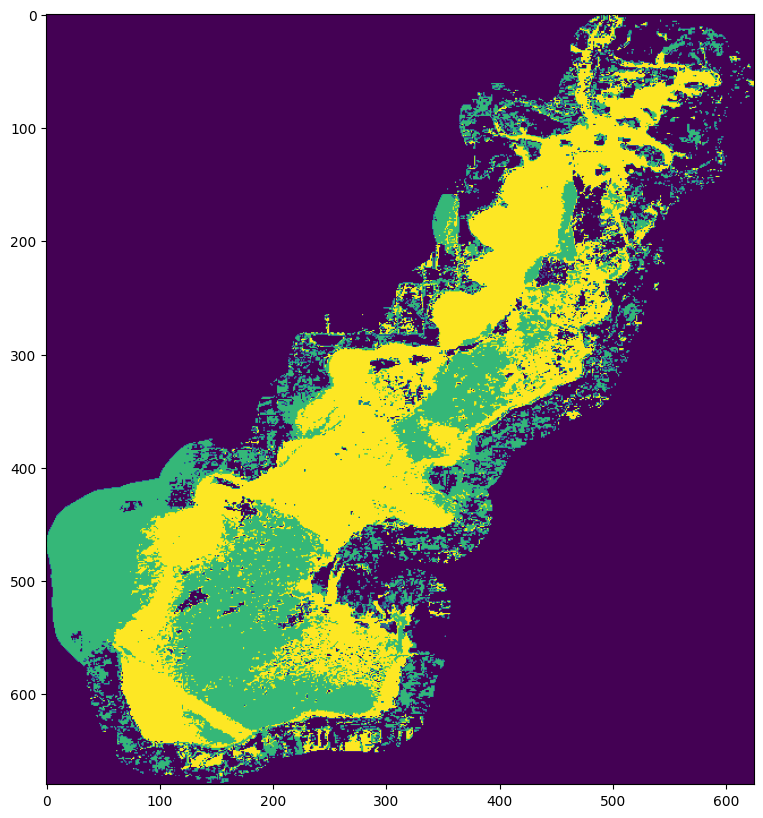

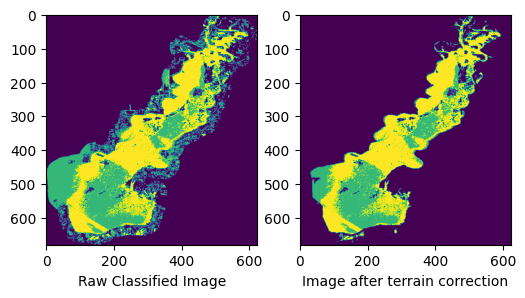

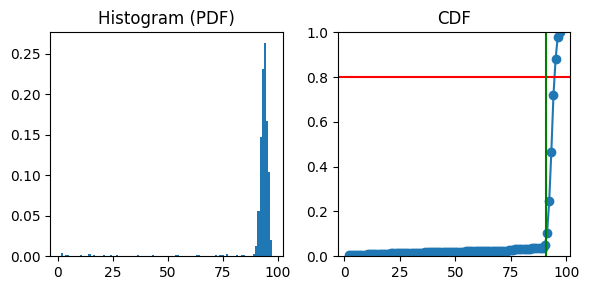

The bin value corresponding to the first CDF value just greater than 0.8 is: 95.12000274658203
Area after enhancement from thresholding is 22.3677 km2


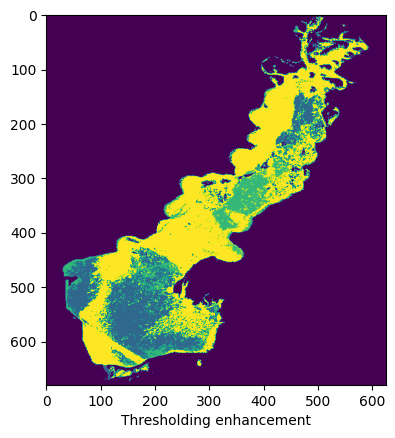

Elbow index:  91
Hockeyness Index: 0.11989891912841975
Area after elbow enhancement is 34.326 km2


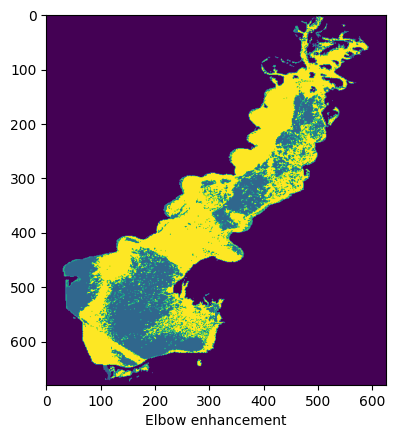

/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  892


100%|██████████| 12/12 [00:00<00:00, 64.45it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/892/clipped_rasters/2016023
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.3559039876113047
Starting classification


100%|██████████| 9/9 [00:00<00:00, 437.74it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(205, 126, 9)
prediction took 0:00:00.162327 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 269.64409368950834	Solar zenith angle 205.13898373983739
Shape of the classified image is (205, 126) and DEM is (205, 126)
Shape of the JRC image is (205, 126)
Ice fraction is: 19.55%
Water ratio (Fmask:our classification) is: 0.34
Current raw area after terrain correction is 0.0 km2
Cloud cover in % over reservoir: 15.11


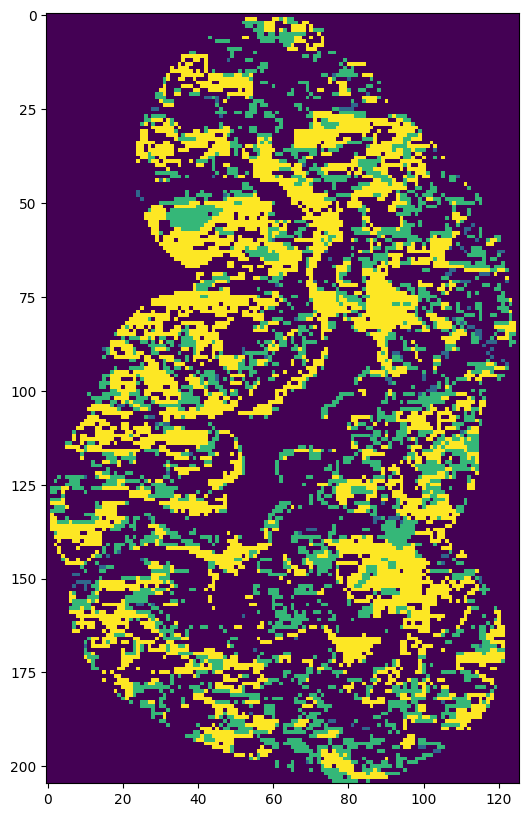

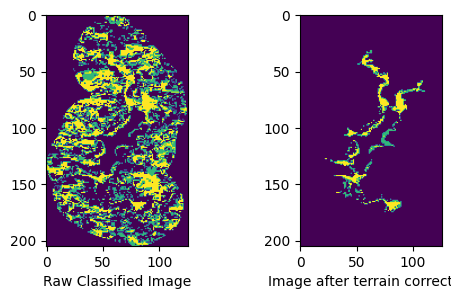

/scratch/user/anshulya/.conda/envs/hls_env/lib/python3.11/site-packages/numpy/lib/histograms.py:885: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


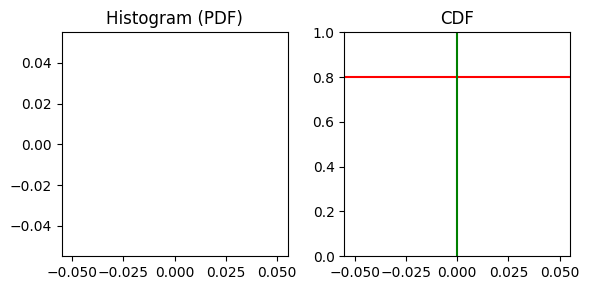

Traceback (most recent call last):
  File "/tmp/job.1346467/ipykernel_184889/1309891865.py", line 282, in classify_reservoir
    index = np.where(cdf >= 0.8)[0][0]
            ~~~~~~~~~~~~~~~~~~~~~~~^^^
IndexError: index 0 is out of bounds for axis 0 with size 0
/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


An exception occurred: index 0 is out of bounds for axis 0 with size 0
----------------------------------------------------------------------------------
Processing starting for reservoir:  1501


100%|██████████| 12/12 [00:00<00:00, 42.77it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1501/clipped_rasters/2016023
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.5850956667129467
Starting classification


100%|██████████| 9/9 [00:00<00:00, 162.16it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(673, 503, 9)
prediction took 0:00:01.056047 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 386.4578310523191	Solar zenith angle 348.3728944608722
Shape of the classified image is (673, 503) and DEM is (673, 503)
Shape of the JRC image is (673, 503)
Ice fraction is: 37.83%
Water ratio (Fmask:our classification) is: 0.61
Current raw area after terrain correction is 0.6615 km2
Cloud cover in % over reservoir: 20.41


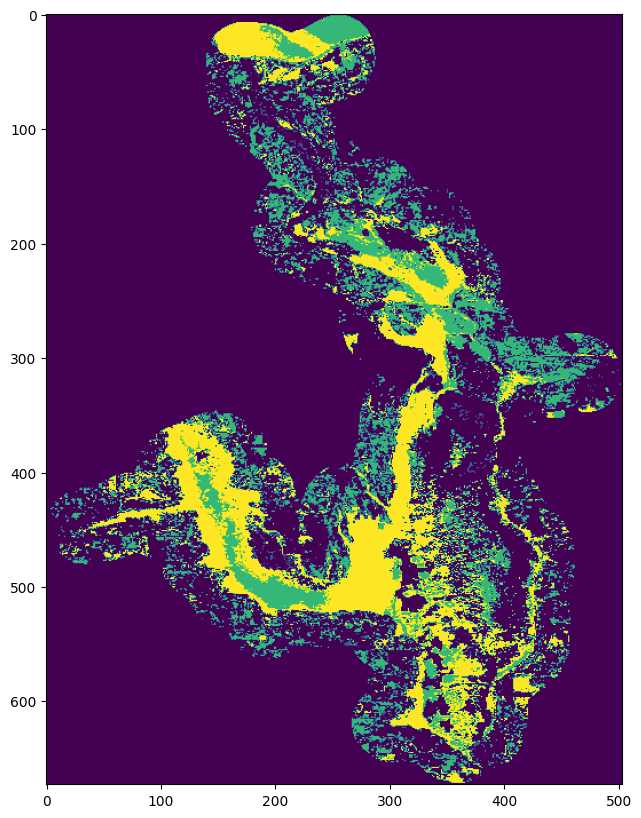

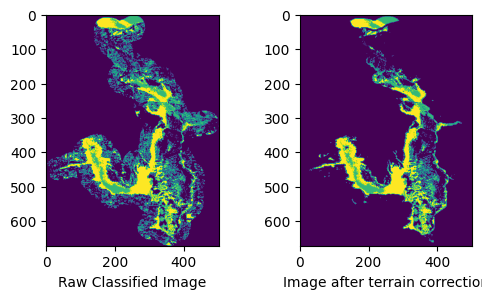

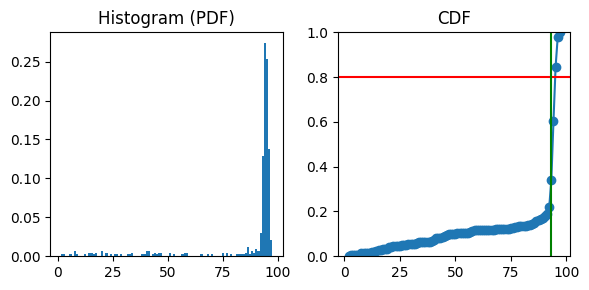

The bin value corresponding to the first CDF value just greater than 0.8 is: 95.12000274658203
Area after enhancement from thresholding is 23.6232 km2


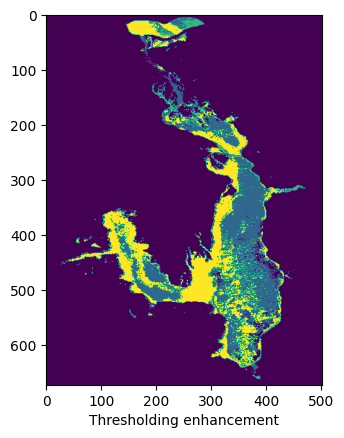

Elbow index:  93
Hockeyness Index: 0.13320040506816674
Area after elbow enhancement is 28.1214 km2


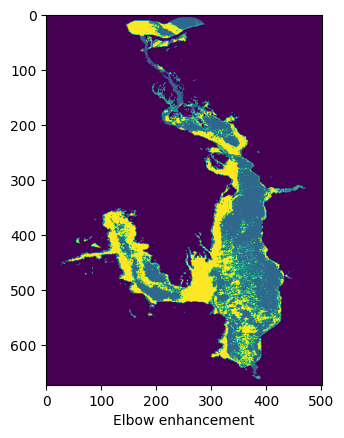

/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1480


100%|██████████| 12/12 [00:00<00:00, 55.28it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1480/clipped_rasters/2016023
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.5511853316731365
Starting classification


100%|██████████| 9/9 [00:00<00:00, 259.72it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(369, 444, 9)


/tmp/job.1346467/ipykernel_184889/1309891865.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B05']) / denominator, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:113: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['mndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B07']) / denominator, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of 

prediction took 0:00:00.583866 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 366.5587659000464	Solar zenith angle 324.0758469445055
Shape of the classified image is (369, 444) and DEM is (369, 444)
Shape of the JRC image is (369, 444)
Ice fraction is: 19.65%
Water ratio (Fmask:our classification) is: 0.72
Current raw area after terrain correction is 0.0279 km2
Cloud cover in % over reservoir: 63.96


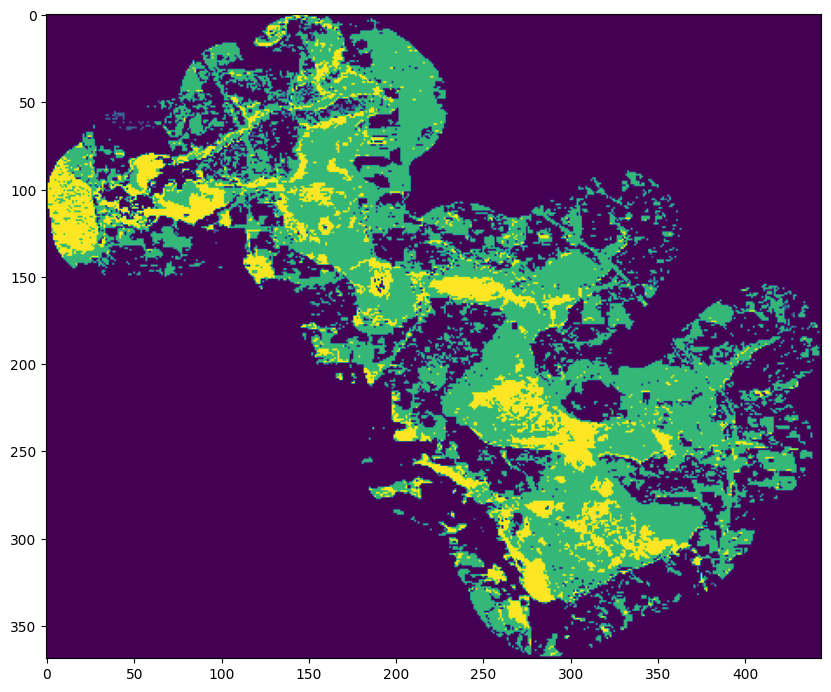

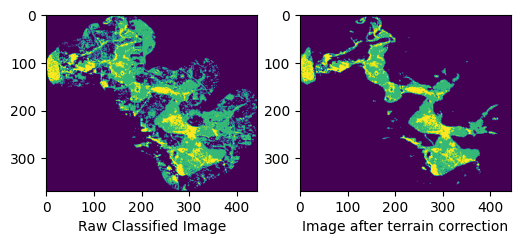

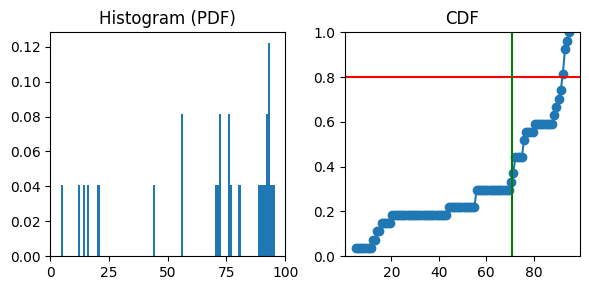

The bin value corresponding to the first CDF value just greater than 0.8 is: 92.36000061035156
Area after enhancement from thresholding is 10.7964 km2


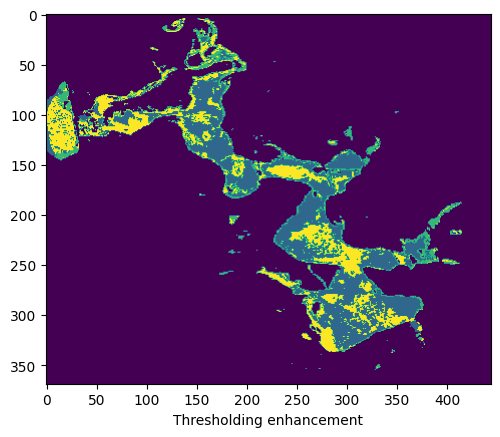

Elbow index:  71
Hockeyness Index: 0.02148071963508602
Area after elbow enhancement is 12.6504 km2


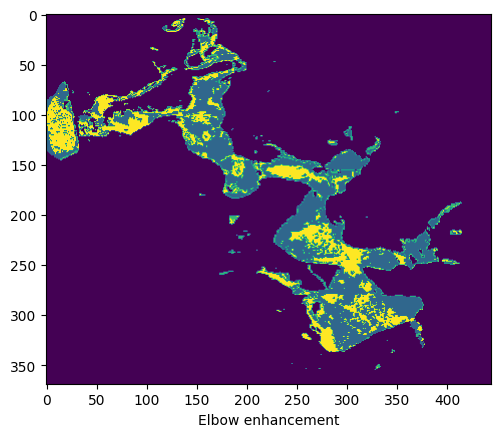

/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1511


100%|██████████| 12/12 [00:00<00:00, 54.53it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1511/clipped_rasters/2016023
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.544655059038797
Starting classification


100%|██████████| 9/9 [00:00<00:00, 279.39it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(393, 445, 9)
prediction took 0:00:00.538618 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 374.27231666523716	Solar zenith angle 332.5427754810304
Shape of the classified image is (393, 445) and DEM is (393, 445)
Shape of the JRC image is (393, 445)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  1512


100%|██████████| 12/12 [00:00<00:00, 57.75it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1512/clipped_rasters/2016023
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.39666666666666667
Starting classification


100%|██████████| 9/9 [00:00<00:00, 355.39it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCop

(300, 232, 9)


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


prediction took 0:00:00.286327 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 315.56798951149426	Solar zenith angle 260.01393160919537
Shape of the classified image is (300, 232) and DEM is (300, 232)
Shape of the JRC image is (300, 232)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!
Processing starting for reservoir:  1493


100%|██████████| 12/12 [00:00<00:00, 18.72it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/1493/clipped_rasters/2016023
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B10
Full image band:  B11
Full image band:  Fmask
0.6491169487643009
Starting classification


100%|██████████| 9/9 [00:00<00:00, 23.51it/s]
/tmp/job.1346467/ipykernel_184889/1309891865.py:91: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:93: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:97: SettingWithCopy

(1324, 1952, 9)
prediction took 0:00:06.100364 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 415.9741475510438	Solar zenith angle 383.80538180300016
Shape of the classified image is (1324, 1952) and DEM is (1324, 1952)
Shape of the JRC image is (1324, 1952)
Ice fraction is: 0.00%
No water found! Probably very cloudy!!


/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  828


100%|██████████| 16/16 [00:00<00:00, 45.83it/s]


Processing:  /scratch/user/anshulya/hls/data/raw/828/clipped_rasters/2016029
Full image band:  B01
Full image band:  B02
Full image band:  B03
Full image band:  B04
Full image band:  B05
Full image band:  B06
Full image band:  B07
Full image band:  B08
Full image band:  B8A
Full image band:  B09
Full image band:  B10
Full image band:  B11
Full image band:  B12
Full image band:  Fmask
0.5411005434782609
Starting classification


100%|██████████| 13/13 [00:00<00:00, 210.01it/s]

(480, 368, 13)



/tmp/job.1346467/ipykernel_184889/1309891865.py:55: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
/tmp/job.1346467/ipykernel_184889/1309891865.py:57: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
/tmp/job.1346467/ipykernel_184889/1309891865.py:61: SettingWithCopyWarning: 
A value is trying to be set on a c

prediction took 0:00:00.613403 time
Classification done!!
---------------------------------------------------------
Solar azimuth angle: 375.48095408740943	Solar zenith angle 330.54867040307977
Shape of the classified image is (480, 368) and DEM is (480, 368)
Shape of the JRC image is (480, 368)
Ice fraction is: 0.00%
Water ratio (Fmask:our classification) is: 0.56
Current raw area after terrain correction is 0.0225 km2
Cloud cover in % over reservoir: 98.83


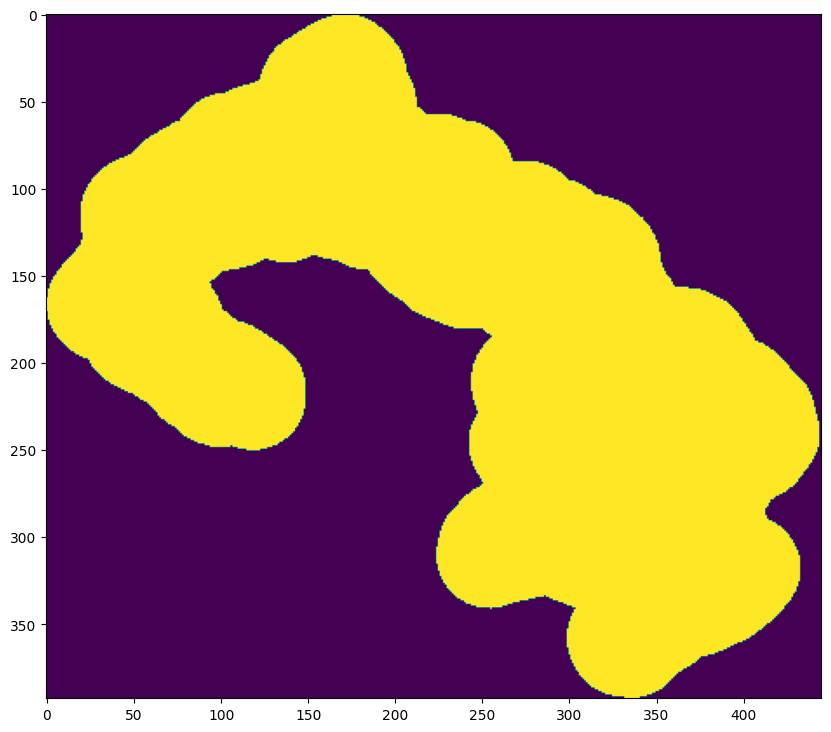

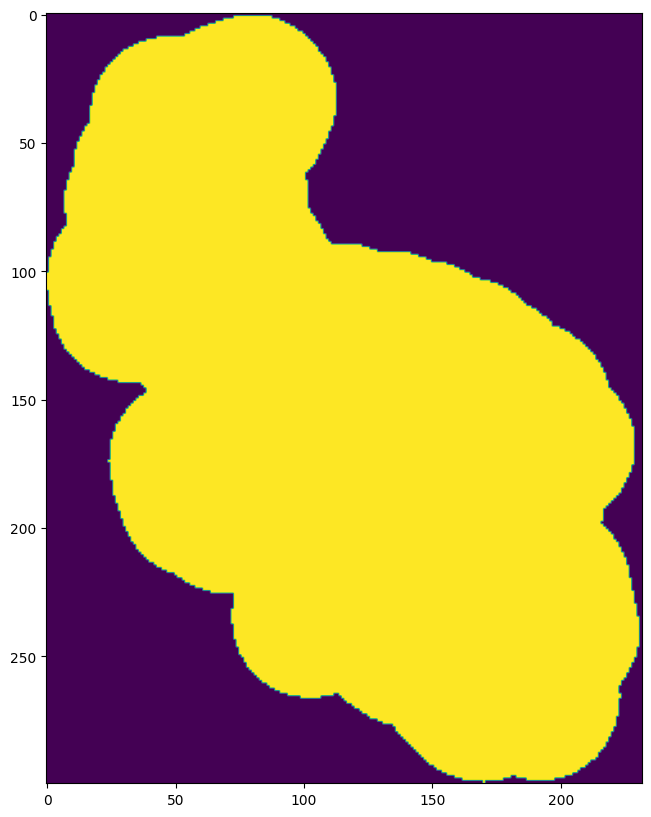

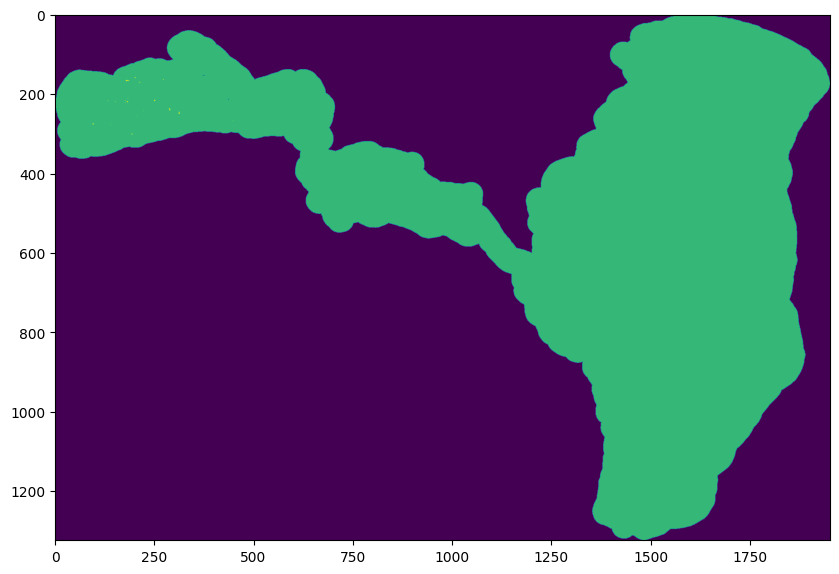

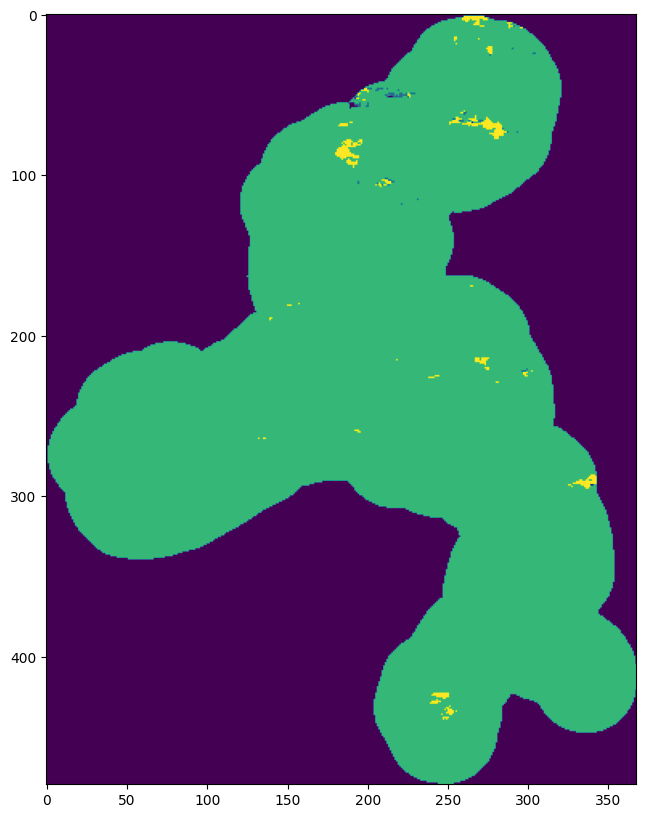

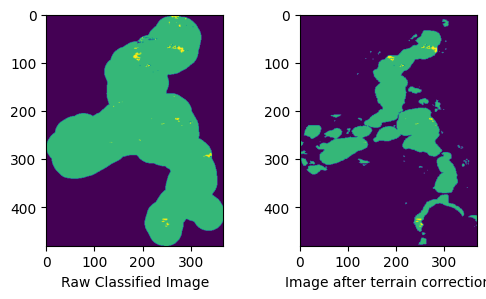

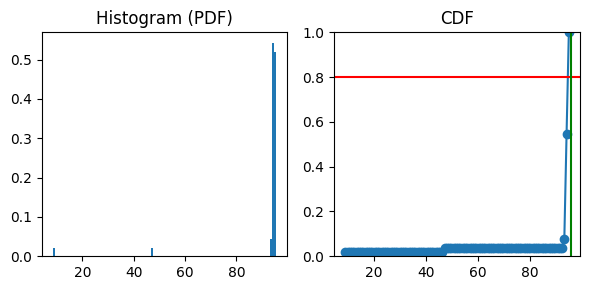

The bin value corresponding to the first CDF value just greater than 0.8 is: 95.12999725341797
Area after enhancement from thresholding is 19.7982 km2


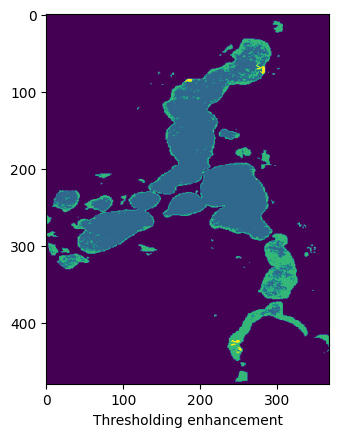

Elbow index:  96
Hockeyness Index: 0.32055850078076664
Area after elbow enhancement is 13.104 km2


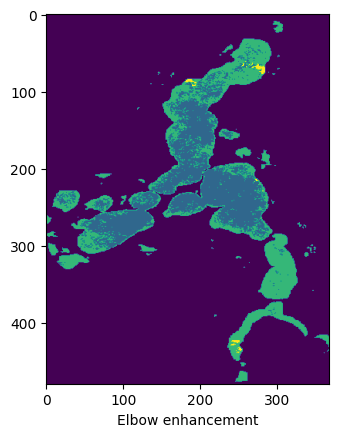

/tmp/job.1346467/ipykernel_184889/2991609677.py:19: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  res.geometry = res.geometry.buffer(0.01)
/home/anshulya/.local/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Processing starting for reservoir:  831


  0%|          | 0/16 [00:06<?, ?it/s]


KeyboardInterrupt: 

In [33]:
grand = gp.read_file('/scratch/user/anshulya/hls/data/auxiliary/gis/hls_reservoirs.geojson')
old_hls = gp.read_file('/scratch/user/anshulya/hls/data/auxiliary/gis/800_res.geojson')
s2_res = pd.read_csv('/scratch/user/anshulya/hls/data/auxiliary/gis/sentinel_tiles.csv')


not_done_gid = []
old_done_idx = [int(f.split('_')[0]) for f in os.listdir('/scratch/user/anshulya/hls/results/old') if f.endswith('_f.csv')]
old_gid = [old_hls.loc[id,'grand_id'] for id in old_done_idx]

new_gid = [int(f) for f in os.listdir('/scratch/user/anshulya/hls/results/hls_classified') if int(f) not in old_gid]
files = ['2016.zip','2017.zip','2018.zip','2019.zip','2020.zip','2021.zip','2022.zip','2023.zip']
for g in tqdm(new_gid):
    all_exist = all(Path(f'/scratch/user/anshulya/hls/results/hls_classified/{g}/{f}').exists() for f in files)
    if not all_exist:
        not_done_gid.append(g)
new_gid = [int(f) for f in os.listdir('/scratch/user/anshulya/hls/results/hls_classified') if int(f) not in old_gid and int(f) not in not_done_gid]
print(len(os.listdir('/scratch/user/anshulya/hls/results/hls_classified')), len(new_gid))

done_gid = new_gid + old_gid
not_done_gid = [x for x in grand['GRAND_ID'].values if x not in done_gid]

todo_tiles = ['15TXL', '15TVL', '16TCS', '14TQR', '14TQS', '15TYJ', '15TYL', '15TUL', '15TYK', '16TCP', '16TCR', 
              '15TUN', '14TQT', '15TVM', '15TYM', '15TWL', '15TUM', '15TVN']
              
res_list = [x for x in s2_res.loc[s2_res['Name'].isin(todo_tiles),'GRAND_ID'].unique() if x in not_done_gid]

todo_res_list = {}
ext_res = []
for r in res_list:
    tiles = s2_res.loc[s2_res['GRAND_ID']==r,'Name'].unique()
    rogue = [t for t in tiles if t not in todo_tiles]
    if len(rogue)>0:
        print(r, tiles)
        print(r, [t for t in tiles if t not in todo_tiles])
        ext_res.append(r)
    else:
        todo_res_list[r] = list(tiles)
print('Reservoirs to be processed: ',len(todo_res_list))

###############
todo_res_list[1493] = ['16TCP']

for day in range(start_day, end_day):
    try:
        process_reservoirs_for_day(day, todo_tiles, todo_res_list, grand)
    except Exception as e:
            print(f"Error processing day: {e}")
    

# # Use ProcessPoolExecutor to parallelize the function
# with ProcessPoolExecutor(max_workers=num_workers) as executor:
#     # Submit tasks to process each day in parallel
#     futures = [executor.submit(process_reservoirs_for_day, day, todo_tiles, todo_res_list, grand) for day in range(start_day, end_day)]

#     # Optionally, wait for all tasks to complete and handle results
#     for future in futures:
#         try:
#             future.result()  # This will raise any exceptions encountered during execution
#         except Exception as e:
#             print(f"Error processing day: {e}")
    

## Errata

In [29]:
# Function to delete a directory and its contents
def delete_directory(dir_path):
    if os.path.exists(dir_path):
        shutil.rmtree(dir_path)
        print(f"Directory '{dir_path}' and its contents have been deleted.")
    else:
        print(f"Directory '{dir_path}' does not exist.")

In [32]:
for i in todo_res_list.keys():
    dir_path = f'/scratch/user/anshulya/hls/results/hls_classified/{i}'
    delete_directory(dir_path)

Directory '/scratch/user/anshulya/hls/results/hls_classified/828' does not exist.
Directory '/scratch/user/anshulya/hls/results/hls_classified/831' does not exist.
Directory '/scratch/user/anshulya/hls/results/hls_classified/782' does not exist.
Directory '/scratch/user/anshulya/hls/results/hls_classified/786' and its contents have been deleted.
Directory '/scratch/user/anshulya/hls/results/hls_classified/795' does not exist.
Directory '/scratch/user/anshulya/hls/results/hls_classified/800' does not exist.
Directory '/scratch/user/anshulya/hls/results/hls_classified/803' and its contents have been deleted.
Directory '/scratch/user/anshulya/hls/results/hls_classified/809' does not exist.
Directory '/scratch/user/anshulya/hls/results/hls_classified/813' and its contents have been deleted.
Directory '/scratch/user/anshulya/hls/results/hls_classified/821' does not exist.
Directory '/scratch/user/anshulya/hls/results/hls_classified/824' and its contents have been deleted.
Directory '/scratc

In [26]:
for i in todo_res_list.keys():
    dir_path = f'/scratch/user/anshulya/hls/results/hls_classified/{i}'
    if os.path.exists(dir_path):
        print(i, len(os.listdir(dir_path)))
    else:
        print(i, 0)
    

828 4
831 3
782 3
786 5
795 4
800 3
803 4
809 4
813 3
821 4
824 4
750 4
769 1
772 2
776 4
834 2
838 3
853 1
857 3
781 5
785 3
787 4
788 3
797 3
801 3
808 3
758 3
767 3
779 3
829 0
844 0
852 0
856 0
783 2
794 0
807 0
812 0
814 0
820 0
839 1
840 1
842 1
843 2
847 1
849 2
850 0
833 1
841 1
846 1
855 1
878 1
883 0
892 0
1501 0
1504 0
1505 0
1515 0
1479 0
1480 0
822 1
826 1
1453 1
1454 1
1458 1
1459 1
1461 1
805 0
1422 1
1424 1
1427 0
1435 0
1442 1
1445 1
1447 1
7320 0
1502 2
1509 2
1511 2
1512 2


In [12]:
len(res_list)

71

In [ ]:
# Define the range of days you want to process
start_day = 2016001
end_day = 2024001



In [ ]:
def process_dates_in_range(start_day, end_day, num_workers):
    grand = gp.read_file('/scratch/user/anshulya/hls/data/auxiliary/gis/hls_reservoirs.geojson')
    old_hls = gp.read_file('/scratch/user/anshulya/hls/data/auxiliary/gis/800_res.geojson')
    s2_res = pd.read_csv('/scratch/user/anshulya/hls/data/auxiliary/gis/sentinel_tiles.csv')
    
    
    not_done_gid = []
    old_done_idx = [int(f.split('_')[0]) for f in os.listdir('/scratch/user/anshulya/hls/results/old') if f.endswith('_f.csv')]
    old_gid = [old_hls.loc[id,'grand_id'] for id in old_done_idx]
    
    new_gid = [int(f) for f in os.listdir('/scratch/user/anshulya/hls/results/hls_classified') if int(f) not in old_gid]
    files = ['2016.zip','2017.zip','2018.zip','2019.zip','2020.zip','2021.zip','2022.zip','2023.zip']
    for g in tqdm(new_gid):
        all_exist = all(Path(f'/scratch/user/anshulya/hls/results/hls_classified/{g}/{f}').exists() for f in files)
        if not all_exist:
            not_done_gid.append(g)
    new_gid = [int(f) for f in os.listdir('/scratch/user/anshulya/hls/results/hls_classified') if int(f) not in old_gid and int(f) not in not_done_gid]
    print(len(os.listdir('/scratch/user/anshulya/hls/results/hls_classified')), len(new_gid))
    
    done_gid = new_gid + old_gid
    not_done_gid = [x for x in grand['GRAND_ID'].values if x not in done_gid]
    
    todo_tiles = ['15TXL', '15TVL', '16TCS', '14TQR', '14TQS', '15TYJ', '15TYL', '15TUL', '15TYK', '16TCP', '16TCR', 
                  '15TUN', '14TQT', '15TVM', '15TYM', '15TWL', '15TUM', '15TVN']
                  
    res_list = [x for x in s2_res.loc[s2_res['Name'].isin(todo_tiles),'GRAND_ID'].unique() if x in not_done_gid]
    
    todo_res_list = {}
    ext_res = []
    for r in res_list:
        tiles = s2_res.loc[s2_res['GRAND_ID']==r,'Name'].unique()
        rogue = [t for t in tiles if t not in todo_tiles]
        if len(rogue)>0:
            print(r, tiles)
            print(r, [t for t in tiles if t not in todo_tiles])
            ext_res.append(r)
        else:
            todo_res_list[r] = list(tiles)
    print('Reservoirs to be processed: ',len(todo_res_list))
    
    ###############
    todo_res_list[1493] = ['16TCP']

    # Use ProcessPoolExecutor to parallelize the function
    with ProcessPoolExecutor(max_workers=num_workers) as executor:
        # Submit tasks to process each day in parallel
        futures = [executor.submit(process_reservoirs_for_day, day, todo_tiles, todo_res_list, grand) for day in range(start_day, end_day)]
    
        # Optionally, wait for all tasks to complete and handle results
        for future in futures:
            try:
                future.result()  # This will raise any exceptions encountered during execution
            except Exception as e:
                print(f"Error processing day: {e}")
    

In [ ]:
if __name__ == '__main__':
    # Check if the required arguments are provided
    if len(sys.argv) != 4:
        print("Usage: python script.py <start_date> <end_date> <num_workers>")
        print("Example: python script.py 01-01-2022 01-05-2022 4")
        sys.exit(1)
    
    # Get the command-line arguments
    start_date_input = sys.argv[1]
    end_date_input = sys.argv[2]
    num_workers_input = int(sys.argv[3])

    start_date = datetime.strptime(start_date_input, '%m-%d-%Y')
    end_date = datetime.strptime(end_date_input, '%m-%d-%Y')
    
    print(int(start_date.strftime('%Y%j')), int(end_date.strftime('%Y%j')))

    process_dates_in_range(int(start_date.strftime('%Y%j')), int(end_date.strftime('%Y%j')), int(num_workers_input))

# Download Cluster

In [ ]:
link = "https://data.lpdaac.earthdatacloud.nasa.gov/lp-prod-protected/HLSL30.020/HLS.L30.T11SQA.2021221T181517.v2.0/HLS.L30.T11SQA.2021221T181517.v2.0.B05.tif"
cmd = "python /scratch/user/anshulya/hls/code/DAACDataDownload.py -dir /scratch/user/anshulya/hls/data/hls_data -f {}".format(link)
os.system(cmd)

In [ ]:
def get_search_params(date_str, lp_links, fieldShape):
  lp_search = [l['href'] for l in lp_links if l['rel'] == 'search'][0]    # Define the search endpoint

  # Set up a dictionary that will be used to POST requests to the search endpoint
  params = {}

  # default limit is 10, maximum limit is 250
  params['limit'] = 250

  # Defined from ROI bounds
  bbox = f'{fieldShape.bounds[0]},{fieldShape.bounds[1]},{fieldShape.bounds[2]},{fieldShape.bounds[3]}'
  params['bbox'] = bbox

  # Define start time period / end time period
  date_time = date_str + "T00:00:00Z/" + date_str + "T23:59:59Z"
  params['datetime'] = date_time

  s30_id = "HLSS30.v2.0"
  l30_id = "HLSL30.v2.0"
  params["collections"] = [s30_id, l30_id]
  # params["collections"] = [l30_id]

  return params

In [ ]:
def download_unmerged_rasters(tile, day, year_start, lp_links, fieldShape):
  # Define bands to be downloaded
  l30_bands = ['B01', 'B03', 'B05', 'B06', 'B04', 'Fmask', 'B07',
        'B10', 'B02', 'B11','SAA','SZA']
  s30_bands = ['B10', 'B07', 'B09', 'B04', 'B03', 'B11', 'B06',
        'B12','B02', 'B8A', 'B08', 'B01', 'Fmask','B05','SAA','SZA']

  # Define parameters for the day
  date = year_start + timedelta(days=day)
  params = get_search_params(date.strftime('%Y-%m-%d'), lp_links, fieldShape)
  lp_search = [l['href'] for l in lp_links if l['rel'] == 'search'][0]

  s30_urls = []
  l30_urls = []

  # Search for the HLSS30 and HLSL30 items of interest:
  hls_items = r.post(lp_search, json=params).json()['features']    # Send POST request with S30 and L30 collections included
  if len(hls_items)>0:
    s_idx = []
    l_idx = []

    # find out the indices of hls_items which are from S30 and L30
    for i in range(len(hls_items)):
      h = hls_items[i]
      if h['id'].split('.')[1] == 'S30':
        s_idx.append(i)
      elif h['id'].split('.')[1] == 'L30':
        l_idx.append(i)
      else:
        continue

    # S30 rasters
    for b in s30_bands:
      for i in s_idx:
        h = hls_items[i]
        link = h['assets'][b]['href']
        if tile in link:
          s30_urls.append(link)

    # L30 rasters
    for b in l30_bands:
      for i in l_idx:
        h = hls_items[i]
        link = h['assets'][b]['href']
        if tile in link:
          l30_urls.append(link)
  else:
    print(f'data not available for day {day}')
    return

  save_path = None

  if s30_urls:
    print('Sentinel-2 data available')

  for url in tqdm(s30_urls):
    save_path = os.path.join('/scratch/user/anshulya/hls/data/raw',tile,'unmerged_rasters', url.split('/')[-1].split('.')[3][:7], 'S30')
    if os.path.exists(os.path.join(save_path, url.split('/')[-1])):
      continue
    cmd = f"python /scratch/user/anshulya/hls/code/DAACDataDownload.py -dir {save_path} -f {url}"
    os.system(cmd)

  if l30_urls:
    print('Landsat data available')

  for url in tqdm(l30_urls):
    save_path = os.path.join('/scratch/user/anshulya/hls/data/raw',tile,'unmerged_rasters', url.split('/')[-1].split('.')[3][:7], 'L30')
    if os.path.exists(os.path.join(save_path, url.split('/')[-1])):
      continue
    cmd = f"python /scratch/user/anshulya/hls/code/DAACDataDownload.py -dir {save_path} -f {url}"
    os.system(cmd)

  # # Create an empty dataframe for each day
  # column_names = ['id', 'tile', 'cloud_cover', 'satellite', 'no_value']
  # df = pd.DataFrame(columns=column_names)

  # for i, h in enumerate(hls_items):
  #   df.loc[i,'id'] = h['id']
  #   df.loc[i,'tile'] = h['id'].split('.')[2]
  #   df.loc[i,'cloud_cover'] = int(h['properties']['eo:cloud_cover'])
  #   df.loc[i,'satellite'] = h['collection']

  #   if h['collection'] == 'HLSS30.v2.0':
  #     save_path = os.path.join(tile,'unmerged_rasters', url.split('/')[-1].split('.')[3][:7], 'S30')
  #   elif h['collection'] == 'HLSL30.v2.0':
  #     save_path = os.path.join(tile,'unmerged_rasters', url.split('/')[-1].split('.')[3][:7], 'L30')
  #   else:
  #     continue

  #   ras = rio.open(os.path.join(save_path,h['assets']['B01']['href'].split('/')[-1]))
  #   ras_data = ras.read(1)
  #   df.loc[i,'no_value'] = ras_data[ras_data==ras.meta['nodata']].shape[0]/ras_data.flatten().shape[0]
  #   ras.close()

  # head, tail = os.path.split(save_path)

  # print('Saving dataframe...')
  # df.to_csv(os.path.join(head,'tile_metadata.csv'))

  
  if save_path:
    head, tail = os.path.split(save_path)  
    print("Unmerged rasters downloaded!!! Available at {}".format(head))
    print("------------------------------------------------------------------------------------")

    return head
  else:
    return None

In [ ]:
## Reproject downloaded rasters
def project_hls_latlon(hls, jrc, filename = 'hls_proj.tif'):
  projTIF = filename
  transform, width, height = calculate_default_transform(
      hls.crs, jrc.crs, hls.width, hls.height, *hls.bounds)
  kwargs = hls.meta.copy()
  kwargs.update({
      'crs': jrc.crs,
      'transform': transform,
      'width': width,
      'height': height
  })

  with rio.open(projTIF, 'w', **kwargs) as dst:
      for i in range(1, hls.count + 1):
          reproject(
              source=rio.band(hls, i),
              destination=rio.band(dst, i),
              src_transform=hls.transform,
              src_crs=hls.crs,
              dst_transform=transform,
              dst_crs=jrc.crs,
              resampling=Resampling.nearest)
  return projTIF

def reproject_unmerged_rasters(save_path):
  print('start of reprojections')
  for filename in tqdm(os.listdir(save_path)):
    if filename == 'tile_metadata.csv':
      continue
    if os.path.isfile(os.path.join(save_path, filename)):
      jrc = rio.open('/scratch/user/anshulya/hls/data/383_LAKE_MEAD.tif')
      hls = rio.open(os.path.join(save_path, filename))
      project_hls_latlon(hls, jrc, os.path.join(save_path, filename))

In [ ]:
def getFeatures(gdf):
  """Function to parse features from GeoDataFrame in such a manner that rasterio wants them"""
  import json
  return [json.loads(gdf.to_json())['features'][0]['geometry']]

In [ ]:
def process_hls_rasters(tile, day, year_start, lp_links, fieldShape):
  print(os.path.join('/scratch/user/anshulya/hls/data/raw',tile,'unmerged_rasters',str(year_start.year)+str(day+1).zfill(3)))
  retries = 0
  max_retries = 3
  while retries < max_retries:
    try:
      save_path = download_unmerged_rasters(tile, day, year_start, lp_links, fieldShape)

      if save_path == None:
        return


      if os.path.isdir(os.path.join(save_path,'L30')):
        flag1 = 1
        reproject_unmerged_rasters(os.path.join(save_path,'L30'))
      else:
        flag1 = 0

      if os.path.isdir(os.path.join(save_path,'S30')):
        flag2 = 1
        reproject_unmerged_rasters(os.path.join(save_path,'S30'))
      else:
        flag2 = 0

      return
    except Exception as e:
      print(f"Error downloading {day}: {e}. Retrying...")
      traceback.print_exc()
      retries += 1
      time.sleep(5)  # Optional: wait for 5 seconds before retrying
  else:
    print(f"Failed to download {day} after {max_retries} attempts.")

In [ ]:
def clip_raster(src, res, fname = 'clipped_hls.tif'):
  coords = getFeatures(res)

  # Clip the raster with Polygon
  out_image, out_transform = mask(dataset=src, shapes=coords, crop=True, nodata=-9999)

  # Update the metadata with the new bounds and resolution
  out_meta = src.meta.copy()
  out_meta.update({
      'height': out_image.shape[1],
      'width': out_image.shape[2],
      'transform': out_transform
  })

  with rio.open(fname, 'w', **out_meta) as dest:
    dest.write(out_image)
  return fname

In [ ]:
def resample_jrc_raster(hls_path, jrc, filename):
  # Open the reference raster
  with rio.open(hls_path) as src:
    # Get the metadata for the reference raster
    profile = src.profile
    transform = src.transform

    # Create a new empty raster with the same shape and metadata as the reference raster
    data = np.empty(shape=(src.height, src.width), dtype=np.float32)
    new_profile = profile.copy()
    new_profile.update(dtype=data.dtype)

    # Create a transform for the new raster using the same resolution as the reference raster
    new_transform = Affine(transform.a, transform.b, transform.c,
                          transform.d, transform.e, transform.f)

    # Open the source raster to be used for updating the empty raster
    with jrc as src2:
      # Update each pixel in the new raster with the nearest neighbor value from the source raster
      rio.warp.reproject(source=rio.band(src2, 1), destination=data,
                              src_transform=src2.transform, src_crs=src2.crs,
                              dst_transform=new_transform, dst_crs=src.crs,
                              resampling=rio.warp.Resampling.nearest)

    # Write the updated raster to a new file
    with rio.open(filename, 'w', **new_profile) as dst:
      dst.write(data, 1)
      return filename

In [ ]:
def terrain_shadow(dem, azimuth, zenith):
  # Convert azimuth and zenith angles to radians
  azimuth_rad = math.radians(azimuth)
  zenith_rad = math.radians(zenith)

  # Compute the slope and aspect
  dx, dy = np.gradient(dem)
  slope = np.arctan(np.sqrt(dx**2 + dy**2))
  aspect = np.arctan2(-dy, dx)

  # Compute the cosine of the incident angle
  cos_theta_i = np.cos(zenith_rad) * np.cos(slope) + np.sin(zenith_rad) * np.sin(slope) * np.cos(azimuth_rad - aspect)

  # Calculate the terrain shadow mask
  shadow_mask = cos_theta_i < 0

  return shadow_mask

In [ ]:
def find_elbow(data):
  """
  Find the elbow point in a dataset.
  
  Parameters:
  - data: A list or numpy array of y-values.
  
  Returns:
  - index of the elbow point.
  """
  # Create a vector from the first data point to the last data point
  first_point = [0, data[0]]
  last_point = [len(data) - 1, data[-1]]
  line_vector = np.subtract(last_point, first_point)
  
  # Normalize the line vector
  line_vector_norm = line_vector / np.sqrt(sum(line_vector**2))
  
  # Find the point that is farthest from the line
  max_distance = -1
  elbow_index = 0
  for i, value in enumerate(data):
    point = [i, value]
    distance = np.abs(np.cross(line_vector_norm, np.subtract(first_point, point)))
    if distance > max_distance:
      max_distance = distance
      elbow_index = i
            
  return elbow_index

In [ ]:
def half_image_correction(larger_raster_path, smaller_raster_path, padded_raster_path):
  """
  Pads the smaller raster to match the size of the larger raster.
  
  Parameters:
  - larger_raster_path: Path to the larger raster file.
  - smaller_raster_path: Path to the smaller raster file.
  - padded_raster_path: Path to save the padded raster.
  """
  
  with rio.open(larger_raster_path) as larger_raster:
    with rio.open(smaller_raster_path) as smaller_raster:
        
      # Extract pixel resolution from the raster's transform
      pixel_resolution_x = abs(smaller_raster.transform[0])
      pixel_resolution_y = abs(smaller_raster.transform[4])

      # Calculate the difference in extents
      left_diff = int((smaller_raster.bounds.left - larger_raster.bounds.left) / pixel_resolution_x)
      right_diff = int((larger_raster.bounds.right - smaller_raster.bounds.right) / pixel_resolution_x)
      top_diff = int((larger_raster.bounds.top - smaller_raster.bounds.top) / pixel_resolution_y)
      bottom_diff = int((smaller_raster.bounds.bottom - larger_raster.bounds.bottom) / pixel_resolution_y)
      
      # Read the smaller raster data
      smaller_data = smaller_raster.read(1)
      
      # Pad the smaller raster data
      padded_data = np.pad(smaller_data, ((top_diff, bottom_diff), (left_diff, right_diff)), 'constant', constant_values=-9999)
      
      # Create a new raster with the padded data and the same metadata as the larger raster
      with rio.open(padded_raster_path, 'w', **larger_raster.meta) as dst:
        dst.write(padded_data, 1)

def get_bit(number, bit_position):
  return (number >> bit_position) & 1

def matrix_get_bit(matrix, bit_position):
  matrix = matrix.astype(int)  # Ensure matrix elements are integers
  vec_get_bit = np.vectorize(get_bit)
  return vec_get_bit(matrix, bit_position)

In [ ]:
def classify_reservoir(dir_path):
    try:
        clip_path, sat = dir_path.rsplit('\\', 1)
        if sat == 'L30':
            bands = ['B01', 'B02', 'B03', 'B04', 'B05','B06','B07','B10','B11']
            clf = joblib.load(os.path.join(root,'models','lake_rf_new_L30_ice.pkl'))
        else:
            bands = ['B01', 'B02', 'B03', 'B04', 'B05','B06','B07','B08','B8A','B09','B10', 'B11', 'B12']
            clf = joblib.load(os.path.join(root,'models','lake_rf_new_S30_ice.pkl'))
        
        print('Processing: ',clip_path)
        
        if sat == 'S30':
            max_x = 4025
            max_y = 5159
            max_file_name = r'C:\Anshul\hls-2024\data\raw\597\clipped_rasters\2016027\L30\B05_stitched_raster.tif'
        else:
            max_x = 4006
            max_y = 5135
            max_file_name = r'C:\Anshul\hls-2024\data\raw\597\clipped_rasters\2016021\S30\B05_stitched_raster.tif'
        
        if not os.path.exists(os.path.join(clip_path,sat,'full')):
            os.makedirs(os.path.join(clip_path,sat,'full'))
        
        ext_bands = bands + ['Fmask']  
        for b in ext_bands:
            ras = rio.open(os.path.join(clip_path,sat,b+'_stitched_raster.tif')).read(1)
            if ras.shape[0]<max_x or ras.shape[1]<max_y:
                half_image_correction(max_file_name,
                os.path.join(clip_path,sat,b+'_stitched_raster.tif'),
                os.path.join(clip_path,sat,'full',b+'_stitched_raster.tif'))
            else:
                print('Full image band: ',b)
                shutil.copy(os.path.join(clip_path,sat,b+'_stitched_raster.tif'),
                os.path.join(clip_path,sat,'full',b+'_stitched_raster.tif'))
        
        # Check if image has substantial data
        ras = rio.open(os.path.join(clip_path,sat,'full','B01_stitched_raster.tif')).read(1)
        print(ras[ras==-9999].flatten().shape[0]/ras.flatten().shape[0])
        if ras[ras==-9999].flatten().shape[0]/ras.flatten().shape[0]>0.98:
            print('mostly empty raster')
            print(clip_path)
            print('---------------------------------------------------------')
            # return
        else:
            flag = 1
            print('Starting classification')
            for b in tqdm(bands):
                data = rio.open(os.path.join(clip_path,sat,'full',b+'_stitched_raster.tif')).read(1).astype('float')*0.0001
                if flag:
                    input_array = np.array(data)
                    flag = 0
                else:
                    input_array = np.dstack((input_array, np.array(data)))
            print(input_array.shape)
        
        super_df = pd.DataFrame(input_array.reshape((-1, input_array.shape[-1])), columns=bands)
        test_df = super_df[(super_df != -0.9999).all(axis=1)]
        
        if sat == 'S30':
            # NDSI calculation for Sentinel-2 (Green and SWIR1)
            denominator_ndsi = test_df['B03'] + test_df['B11']
            test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B11']) / denominator_ndsi, 0)
            # Set values beyond the range of -1 to 1 as -10
            test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -10, test_df['ndsi'])
        
            # NDVI (Red and NIR)
            denominator_ndvi = test_df['B08'] + test_df['B04']
            test_df['ndvi'] = np.where(denominator_ndvi != 0, (test_df['B08'] - test_df['B04']) / denominator_ndvi, 0)
            # Set values beyond the range of -1 to 1 as -10
            test_df['ndvi'] = np.where((test_df['ndvi'] > 1) | (test_df['ndvi'] < -1), -10, test_df['ndvi'])
        
            # NDMI (NIR and SWIR1)
            denominator_ndmi = test_df['B08'] + test_df['B11']
            test_df['ndmi'] = np.where(denominator_ndmi != 0, (test_df['B08'] - test_df['B11']) / denominator_ndmi, 0)
            # Set values beyond the range of -1 to 1 as -10
            test_df['ndmi'] = np.where((test_df['ndmi'] > 1) | (test_df['ndmi'] < -1), -10, test_df['ndmi'])
        
            # NDWI (Green and NIR)
            denominator = test_df['B03'] + test_df['B08']
            test_df['ndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B08']) / denominator, 0)
        
            # MNDWI calculation (Green and SWIR2)
            denominator = test_df['B03'] + test_df['B12']
            test_df['mndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B12']) / denominator, 0)
            # Set values beyond the range of -1 to 1 as -10
            test_df['mndwi'] = np.where((test_df['mndwi'] > 1) | (test_df['mndwi'] < -1), -10, test_df['mndwi'])
        
            # AWEI without shadow
            test_df['awei_ns'] = 4 * (test_df['B03'] - test_df['B11']) - (0.25 * test_df['B08'] + 2.75 * test_df['B12'])
        
            # AWEI with shadow (assuming 'Blue' corresponds to Band 2)
            test_df['awei_sh'] = test_df['B02'] + 2.5 * test_df['B03'] - 1.5 * (test_df['B08'] + test_df['B11']) - 0.25 * test_df['B12']
        
        elif sat == 'L30':
            
            ## NDSI calculation for Landsat (Green and SWIR1)
            denominator_ndsi = test_df['B03'] + test_df['B06']
            test_df['ndsi'] = np.where(denominator_ndsi != 0, (test_df['B03'] - test_df['B06']) / denominator_ndsi, 0)
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['ndsi'] = np.where((test_df['ndsi'] > 1) | (test_df['ndsi'] < -1), -1, test_df['ndsi'])
        
            ## Calculation of NDVI (Red and NIR) for comparison
            denominator_ndvi = test_df['B05'] + test_df['B04']
            test_df['ndvi'] = np.where(denominator_ndvi != 0, (test_df['B05'] - test_df['B04']) / denominator_ndvi, 0)
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['ndvi'] = np.where((test_df['ndvi'] > 1) | (test_df['ndvi'] < -1), -1, test_df['ndvi'])
        
            ## Calculation of other indices (e.g., Normalized Difference Moisture Index - NDMI)
            denominator_ndmi = test_df['B05'] + test_df['B06']
            test_df['ndmi'] = np.where(denominator_ndmi != 0, (test_df['B05'] - test_df['B06']) / denominator_ndmi, 0)
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['ndmi'] = np.where((test_df['ndmi'] > 1) | (test_df['ndmi'] < -1), -1, test_df['ndmi'])
        
            #L30 NDWI
            denominator = test_df['B03'] + test_df['B05']
            test_df['ndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B05']) / denominator, 0)
        
            #L30 MNDWI calculation
            denominator = test_df['B03'] + test_df['B07']
            test_df['mndwi'] = np.where(denominator != 0, (test_df['B03'] - test_df['B07']) / denominator, 0)
        
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['ndwi'] = np.where((test_df['ndwi'] > 1) | (test_df['ndwi'] < -1), -1,test_df['ndwi'])
        
            # Set values beyond the range of -1 to 1 as np.nan
            test_df['mndwi'] = np.where((test_df['mndwi'] > 1) | (test_df['mndwi'] < -1), -1, test_df['mndwi'])
        
            # AWEI without shadow
            test_df['awei_ns'] = 4 * (test_df['B03'] - test_df['B06']) - (0.25 * test_df['B05'] + 2.75 * test_df['B07'])
        
            # AWEI with shadow (assuming 'Blue' corresponds to Band 2)
            test_df['awei_sh'] = test_df['B02'] + 2.5 * test_df['B03'] - 1.5 * (test_df['B05'] + test_df['B06']) - 0.25 * test_df['B07']
        X_pred = test_df
        
        t1 = datetime.now()
        
        predictions = clf.predict(X_pred)
        print('prediction took {} time'.format(datetime.now()-t1))
        print('Classification done!!')
        print('---------------------------------------------------------')
        
        valid_rows_mask = (super_df != -0.9999).all(axis=1)
        super_df['predictions'] = 0
        super_df.loc[valid_rows_mask, 'predictions'] = predictions
        predictions = super_df['predictions'].values
        final_img = np.array(predictions.reshape(input_array.shape[:2])).astype('int')
        
        plt.figure(figsize=(10,10))
        plt.imshow(final_img)
        
        ## Terrain Correction
        ##------------------------------------
        
        az_data = np.array(rio.open(os.path.join(clip_path,sat,'SAA_stitched_raster.tif')).read(1).astype('float'))
        az_data[az_data==65535]=np.nan
        azimuth = np.nanmean(az_data)*0.01
        
        zen_data = np.array(rio.open(os.path.join(clip_path,sat,'SZA_stitched_raster.tif')).read(1).astype('float'))
        zen_data[zen_data==65535]=np.nan
        zenith = np.nanmean(zen_data)*0.01
        
        print('Solar azimuth angle: {}\tSolar zenith angle {}'.format(azimuth, zenith))
        
        im_name = [f for f in os.listdir(os.path.join(root,'data','auxiliary','srtm_data')) if f.startswith(str(res_gid)+'_')][0]
        
        dem_ras = rio.open(os.path.join(root,'data','auxiliary','srtm_data',im_name))
        resample_jrc_raster(os.path.join(clip_path,sat,'full','B01_stitched_raster.tif'), dem_ras, os.path.join(clip_path,sat,'dem.tif'))
        dem_ras = rio.open(os.path.join(clip_path,sat,'dem.tif'))
        dem = dem_ras.read(1)
        
        print('Shape of the classified image is {} and DEM is {}'.format(final_img.shape, dem.shape))
        
        # Compute the terrain shadow mask
        shadow_mask = terrain_shadow(dem, azimuth, zenith)
        sm = 1 - shadow_mask.astype(int)
        
        im_name = [f for f in os.listdir(os.path.join(root,'data','auxiliary','jrc_data')) if f.startswith(str(res_gid)+'_')][0]
        
        # Input the JRC data
        jrc_ras = rio.open(os.path.join(root,'data','auxiliary','jrc_data',im_name))
        resample_jrc_raster(os.path.join(clip_path,sat,'full', 'B01_stitched_raster.tif'), jrc_ras, os.path.join(clip_path,sat,'jrc.tif'))
        jrc_ras = rio.open(os.path.join(clip_path,sat,'jrc.tif'))
        jrc_data = jrc_ras.read(1)
        print('Shape of the JRC image is {}'.format(jrc_data.shape))
        
        ## Calculate the cloud cover
        ref_img = rio.open(os.path.join(clip_path,sat,'full', 'B01_stitched_raster.tif')).read(1).astype('float')*0.0001
        
        X = final_img.astype(float)
        X[(ref_img==-9999*0.0001)] = 2
        
        fmask = rio.open(os.path.join(clip_path,sat,'full', 'Fmask_stitched_raster.tif')).read(1).astype('int')
        cloud_mask = matrix_get_bit(fmask, 1)
        cloud_shadow = matrix_get_bit(fmask, 3)
        water_mask = matrix_get_bit(fmask, 5)
        ice_mask = matrix_get_bit(fmask, 4)
        
        raw_cloud = X.copy()
        raw_cloud[(water_mask==1)] = 1
        raw_cloud[(cloud_mask==1)&(X!=1)] = 2
        raw_cloud[(cloud_shadow==1)] = 2
        raw_cloud[(ice_mask==1)|(X==3)] = 3
        raw_cloud[(ref_img==-9999*0.0001)] = -1
        
        i_frac = ice_mask[(ice_mask==1)&(X==3)&(jrc_data>0)].shape[0]/jrc_data[jrc_data>0].shape[0]
        print('Ice fraction is: {:.2f}%'.format(i_frac*100))
        
        if X[X==1].shape[0]==0:
            print('No water found! Probably very cloudy!!')
            return final_img, final_img, final_img
        else:
            w_frac = (raw_cloud[raw_cloud==1]).shape[0]/(X[X==1]).shape[0]
            print('Water ratio (Fmask:our classification) is: {:.2f}'.format(w_frac))
            
            X[(sm==0)&(X==1)] = 2
            X[(jrc_data==0)] = 0
        
            terr_img = X.copy()
            terr_area = X[X==1].shape[0]*900/10**6
            print('Current raw area after terrain correction is {} km2'.format(X[X==1].shape[0]*900/10**6))
        
            b = jrc_data[jrc_data>0].shape[0]
            a = X[(X==2)&(jrc_data>0)].shape[0]
            cl_cov = a/b*100
            print('Cloud cover in % over reservoir: {:.2f}'.format(cl_cov))
        
            fig, ax = plt.subplots(1,2,figsize=(6,3))
            ax[0].imshow(final_img)
            ax[0].set_xlabel('Raw Classified Image')
            ax[1].imshow(X)
            ax[1].set_xlabel('Image after terrain correction')
            plt.show()
        
            if i_frac>0.9 and cl_cov<10:
                print('Ice fraction is more than 90%! Area estimation not performed')
                return terr_img, terr_img, terr_img
                
            if cl_cov < 5:
                print('Cloud cover less than 5 %. No enhancement required!!')
                bin_value = 0
                enh_area1 = terr_area
                enh_area2 = terr_area
                return terr_img, terr_img, terr_img
            else:
                a = 0
                b = 30
                Y = np.zeros(X.shape)
                Y[X==1] = b
                Y[X==0] = a
                Y[X==2] = 100
                # Create a mask for vertical transitions between a and b
                vertical_mask = np.where(((Y == a) & (np.roll(Y, shift=-1, axis=1) == b)) |
                                    ((Y == b) & (np.roll(Y, shift=-1, axis=1) == a)), 255, 0).astype(np.uint8)
                
                # Create a mask for horizontal transitions between a and b
                horizontal_mask = np.where(((Y == a) & (np.roll(Y, shift=-1, axis=0) == b)) |
                                      ((Y == b) & (np.roll(Y, shift=-1, axis=0) == a)), 255, 0).astype(np.uint8)
                
                # Combine the masks
                combined_mask = np.maximum(vertical_mask, horizontal_mask)
                
                # Apply Canny edge detection
                edges = cv2.Canny(combined_mask.astype(np.uint8), 20, 40)
                
                # Compute the histogram
                hist, bins = np.histogram(jrc_data[(edges>0)&(X!=0)].flatten(), bins=100, density=True)
                
                # Compute the CDF
                cdf = np.cumsum(hist) * (bins[1] - bins[0])  # Multiply by bin width to ensure the CDF goes to 1
                
                # # Plot the histogram and CDF
                plt.figure(figsize=(6, 3))
                
                plt.subplot(1, 2, 1)
                plt.bar(bins[:-1], hist, width=bins[1] - bins[0])
                plt.title('Histogram (PDF)')
                
                plt.subplot(1, 2, 2)
                plt.plot(bins[:-1], cdf, marker='o')
                plt.title('CDF')
                plt.axhline(y=0.8,color='red')
                plt.axvline(x=find_elbow(cdf),color='green')
                plt.ylim(0, 1)
                
                plt.tight_layout()
                plt.show()
                
                # Find the bin value corresponding to the first CDF value just greater than 0.8
                index = np.where(cdf >= 0.8)[0][0]
                bin_value = bins[index]
                thr = int(bin_value)
                
                print(f"The bin value corresponding to the first CDF value just greater than 0.8 is: {bin_value}")
                
                Y = X.copy()
                if i_frac>0.1:
                    Y[(jrc_data>=int(bin_value))&(X<=2)]=1
                else:
                    Y[(jrc_data>=int(bin_value))]=1
                print('Area after enhancement from thresholding is {} km2'.format(Y[Y==1].shape[0]*900/10**6))
                enh_area1 = Y[Y==1].shape[0]*900/10**6
                
                plt.imshow(Y)
                plt.xlabel('Thresholding enhancement')
                plt.show()
        
                print('Elbow index: ',find_elbow(cdf))
        
                elbow_point = find_elbow(cdf)
                
                # Compute the rate of change
                rate_of_change = np.diff(cdf)
                
                # Calculate average rate of change before and after the elbow point
                avg_rate_before = np.mean(rate_of_change[:elbow_point])
                avg_rate_after = np.mean(rate_of_change[elbow_point:])
                
                # Generate the "hockeyness" index
                hockeyness_index = avg_rate_after - avg_rate_before
                
                print(f"Hockeyness Index: {hockeyness_index}")
                
                # if hockeyness_index >0.0:
                bin_value = find_elbow(cdf)
                
                if i_frac>0.1:
                    X[(jrc_data>=int(bin_value))&(X<=2)] = 1
                else:
                    X[(jrc_data>=int(bin_value))] = 1
                
                enh_area2 = X[X==1].shape[0]*900/10**6
                print('Area after elbow enhancement is {} km2'.format(X[X==1].shape[0]*900/10**6))
                
                plt.imshow(X)
                plt.xlabel('Elbow enhancement')
                plt.show()
                return terr_img, Y, X
    except BaseException as error:
        print('An exception occurred: {}'.format(error))
        traceback.print_exc()
        print('----------------------------------------------------------------------------------')
        return None, None, None

In [ ]:
res_gid = 597
start_date = datetime(2016,2,1)
end_date = datetime(2016,12,31)
num_cores=4

## Get reservoir shapefile and geometry
fname = os.path.join(root,'data','auxiliary','gis','hls_reservoirs.geojson')
reservoirs = gp.read_file(fname)
fieldShape1 = reservoirs.loc[reservoirs['GRAND_ID']==res_gid, 'geometry'].values[0] # Define the geometry as a shapely polygon
fieldShape = fieldShape1.buffer(0.01)

## CMR-STAC setup begins here
# Set Up Working Environment
inDir = os.getcwd()
os.chdir(inDir)

stac = 'https://cmr.earthdata.nasa.gov/stac/' # CMR-STAC API Endpoint
stac_response = r.get(stac).json()            # Call the STAC API endpoint
for s in stac_response: print(s)

print(f"You are now using the {stac_response['id']} API (STAC Version: {stac_response['stac_version']}). {stac_response['description']}")
print(f"There are {len(stac_response['links'])} STAC catalogs available in CMR.")

stac_lp = [s for s in stac_response['links'] if 'LP' in s['title']]  # Search for only LP-specific catalogs

# LPCLOUD is the STAC catalog we will be using and exploring today
lp_cloud = r.get([s for s in stac_lp if s['title'] == 'LPCLOUD'][0]['href']).json()
lp_links = lp_cloud['links']

lp_links = lp_cloud['links']
## CMR-STAC setup ends here

year_start = datetime(start_date.year,1,1)
day1 = start_date - year_start
day2 = end_date - year_start
day1 = day1.days
day2 = day2.days
print(day1, day2)

# ## Multiprocessing setup
# num_cores = 20
# print(num_cores)

# num_chunks = (day2 - day1) // num_cores

for day in range(day1, day2):
    print(day)
    merge_path = process_hls_rasters(root, res_gid, day, year_start, lp_links, fieldShape)

    print(merge_path)

    if not merge_path:
        continue
    
    res = reservoirs.loc[reservoirs['GRAND_ID']==res_gid]
    res.geometry = res.geometry.buffer(0.01)
    
    im_name = [f for f in os.listdir(os.path.join(root, 'data','auxiliary','jrc_data')) if f.startswith(str(res_gid)+'_')][0]
    jrc = rio.open(os.path.join(root, 'data','auxiliary','jrc_data',im_name))

    if os.path.isdir(os.path.join(merge_path,'S30')):
        for ras_path in tqdm(os.listdir(os.path.join(merge_path,'S30'))):
            ras = rio.open(os.path.join(merge_path,'S30',ras_path))
    
            dir_path = os.path.join(root, 'data', 'raw', str(res_gid), 'clipped_rasters', merge_path.split('\\')[-1], 'S30')
            if not os.path.exists(dir_path):
                os.makedirs(dir_path)
    
            if ras_path.startswith('Fmask_'):
                clip_raster(ras, res, os.path.join(dir_path, ras_path), 255)
            elif ras_path.startswith('SAA_') or ras_path.startswith('SZA_'):
                clip_raster(ras, res, os.path.join(dir_path, ras_path), 65535)
            else:
                clip_raster(ras, res, os.path.join(dir_path, ras_path))
    
        jrc = rio.open(os.path.join(root, 'data','auxiliary','jrc_data',im_name))
        resample_jrc_raster(os.path.join(dir_path, ras_path), jrc,
                                  os.path.join(dir_path,'jrc.tif'))
        shutil.copy(os.path.join(merge_path,'tile_metadata.csv'), os.path.join(dir_path,'tile_metadata.csv'))
        shutil.rmtree(os.path.join(merge_path,'S30'))
    
    if os.path.isdir(os.path.join(merge_path,'L30')):
        for ras_path in tqdm(os.listdir(os.path.join(merge_path,'L30'))):
            ras = rio.open(os.path.join(merge_path,'L30',ras_path))
    
            dir_path = os.path.join(root, 'data', 'raw', str(res_gid), 'clipped_rasters', merge_path.split('\\')[-1], 'L30')
            if not os.path.exists(dir_path):
                os.makedirs(dir_path)
            if ras_path.startswith('Fmask_'):
                clip_raster(ras, res, os.path.join(dir_path, ras_path), 255)
            elif ras_path.startswith('SAA_') or ras_path.startswith('SZA_'):
                clip_raster(ras, res, os.path.join(dir_path, ras_path), 65535)
            else:
                clip_raster(ras, res, os.path.join(dir_path, ras_path))
    
        jrc = rio.open(os.path.join(root, 'data','auxiliary','jrc_data',im_name))
        resample_jrc_raster(os.path.join(dir_path,ras_path), jrc,
                                  os.path.join(dir_path,'jrc.tif'))
        shutil.copy(os.path.join(merge_path,'tile_metadata.csv'), os.path.join(dir_path,'tile_metadata.csv'))
        shutil.rmtree(os.path.join(merge_path,'L30'))
    print(dir_path)
    A, B, C = classify_reservoir(dir_path)
    if A is not None:
        results_dir = os.path.join(root,'results',str(res_gid), dir_path.split('\\')[-2])
        if not os.path.exists(results_dir):
            os.makedirs(results_dir)
        
        sparse.save_npz(os.path.join(results_dir, 'terrain.npz'), sparse.csr_matrix(A))
        sparse.save_npz(os.path.join(results_dir, 'enh1.npz'), sparse.csr_matrix(B))
        sparse.save_npz(os.path.join(results_dir, 'enh2.npz'), sparse.csr_matrix(C))
    shutil.rmtree(dir_path)
    shutil.rmtree(os.path.join(root,'data','raw',str(res_gid),'unmerged_rasters', dir_path.split('\\')[-2]))